In [1]:
!pip install factor_analyzer

     |████████████████████████████████| 41 kB 29 kB/s             
  Preparing metadata (setup.py) ... - done
  Created wheel for factor-analyzer: filename=factor_analyzer-0.4.0-py3-none-any.whl size=41455 sha256=99467f3264056376b9be1a41318ff941e2b5cfb1150986854d8aba9f7cf0c944
  Stored in directory: /root/.cache/pip/wheels/ac/00/37/1f0e8a5039f9e9f207c4405bbce0796f07701eb377bfc6cc76
Successfully built factor-analyzer


In [2]:
!pip install rfpimp

  Preparing metadata (setup.py) ... - done
  Created wheel for rfpimp: filename=rfpimp-1.3.7-py3-none-any.whl size=10667 sha256=dad35d23b2e124cbe32f4a4050f75595d51a4cc8faa217389a8f508521eac776
  Stored in directory: /root/.cache/pip/wheels/ad/48/d9/21fc62fbeff405425b0d5dd8b0354576cdb62ac97f6b11d1ef
Successfully built rfpimp


In [3]:
# Import Essential Libraries required for this study

import pandas as pd
import numpy as np

# EDA anaysis 

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import show
from matplotlib.colors import ListedColormap
from plotnine import *


# from factor_analyzer import FactorAnalyzer and randomforest
from factor_analyzer import FactorAnalyzer
from sklearn.preprocessing import LabelEncoder as le
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score,accuracy_score,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import silhouette_score

from sklearn.datasets import make_classification

import lime
from lime.lime_tabular import LimeTabularExplainer
import eli5
from eli5.sklearn import PermutationImportance
import shap
from shap import TreeExplainer,KernelExplainer,LinearExplainer
shap.initjs()

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.


In [4]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [5]:
# Will create the separator for better data visualization among each variable

def Line_Separator():
    print('*'*60, '\n')
    
def Line_Separator1():
    print('*'*100, '\n')

**Step 1: Data preparation and Data understanding**

**A. Readmission**
-- 1. Readmissions and Deaths - Hospital.csv
-- 2. Complications - Hospital.csv

**B. Mortality**
-- 1. Readmissions and Deaths - Hospital.csv
-- 2. Complications - Hospital.csv

**C. Safety of Care**
--1. Healthcare-Associated Infections - Hospital.csv
--2. Complications - Hospital.csv

**D. Patient Experience**
--1. HCAHPS - Hospital.csv

**E. Medical Imaging**
--1. Outpatient Imaging Efficiency - Hospital.csv

**F. Timeliness**
--1. Timely and Effective Care - Hospital.csv

**G. Effectiveness**
--1. Timely and Effective Care - Hospital.csv

**H. Score Calculation (compiled all files by merge using provider ID)**

* --1. mortality score
* --2. readmission_score
* --4. safety_score
* --5. experience_score
* --6. medical_score
* --7. timely_score
* --8. effectiveness_score

**A. Readmissions** - Output file 'readmissions_data' & 'readmissions_score'

In [6]:
# Import first file Name - Readmissions and Deaths - Hospital

df_readmissions = pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Readmissions and Deaths - Hospital.csv', index_col=None)
df_readmissions.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Acute Myocardial Infarction (AMI) 30-Day Morta...,MORT_30_AMI,No Different than the National Rate,733,12.5,10.6,14.9,NaN,07/01/2012,06/30/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Death rate for CABG,MORT_30_CABG,No Different than the National Rate,278,4.2,2.6,6.8,NaN,07/01/2012,06/30/2015


In [7]:
# Check number of columns and rows
Number_of_row = df_readmissions.shape[0]
Number_of_column = df_readmissions.shape[1]

print('Number of rows in Readmissions and Deaths - Hospital file     :', Number_of_row)
print('Number of columns in Readmissions and Deaths - Hospital file  :', Number_of_column); Line_Separator1()

Number of rows in Readmissions and Deaths - Hospital file     : 67452
Number of columns in Readmissions and Deaths - Hospital file  : 18
**************************************************************************************************** 



In [8]:
# Review columns title

print("Columns in  Readmissions and Deaths - Hospital file:\n \n",df_readmissions.columns.values)

Columns in  Readmissions and Deaths - Hospital file:
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Measure Name' 'Measure ID'
 'Compared to National' 'Denominator' 'Score' 'Lower Estimate'
 'Higher Estimate' 'Footnote' 'Measure Start Date' 'Measure End Date']


In [9]:
# Check number of categorical and numerical features

def data_features (data):
    categorical_features = df_readmissions.select_dtypes(exclude = [np.number]).columns
    numerical_features = df_readmissions.select_dtypes(include = [np.number]).columns
    print("Categorical features in  Readmissions and Deaths - Hospital file :\n",categorical_features);Line_Separator1()
    print("Numerical features in  Readmissions and Deaths - Hospital file   :\n",numerical_features);Line_Separator1()
    
print(data_features(df_readmissions))

Categorical features in  Readmissions and Deaths - Hospital file :
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'Measure Name', 'Measure ID', 'Compared to National', 'Denominator',
       'Score', 'Lower Estimate', 'Higher Estimate', 'Footnote',
       'Measure Start Date', 'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in  Readmissions and Deaths - Hospital file   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [10]:
# Review the datatypes

print("Review the Data Format in  Readmissions and Deaths - Hospital file  :\n \n",df_readmissions.dtypes)

Review the Data Format in  Readmissions and Deaths - Hospital file  :
 
 Provider ID              int64
Hospital Name           object
Address                 object
City                    object
State                   object
ZIP Code                 int64
County Name             object
Phone Number             int64
Measure Name            object
Measure ID              object
Compared to National    object
Denominator             object
Score                   object
Lower Estimate          object
Higher Estimate         object
Footnote                object
Measure Start Date      object
Measure End Date        object
dtype: object


In [11]:
# keep the info on hospital related infromation and denominator, score and compared to National

df_readmissions = df_readmissions.drop(df_readmissions.columns[[8,13,14,15,16,17]],axis=1)

In [12]:
# Chek if any 'Not Available' in the columns

for col in df_readmissions.columns:
    if df_readmissions[col].dtype == object:
         print(col,df_readmissions[col][df_readmissions[col] == 'Not Available'].count())

Hospital Name 0
Address 0
City 0
State 0
County Name 0
Measure ID 0
Compared to National 14550
Denominator 25742
Score 25742


In [13]:
# Replace 'Not Available' with NA for 'Compared to National,' 'Denominator,' 'Score'

def remove_missing(value ,replace_str, replace_by):
    if value == replace_str:
        return replace_by
    else:
        return value

In [14]:
# Convert not avaialne to nan

df_readmissions["Score"] = df_readmissions["Score"].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")
df_readmissions["Denominator"]  = df_readmissions["Denominator"].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")
df_readmissions["Compared to National"]  = df_readmissions["Compared to National"].apply(lambda x: remove_missing(x,"Not Available", np.nan))

In [15]:
# Storing all hospital related info in table

table = df_readmissions.iloc[:,:8]
table.drop_duplicates(inplace=True)

In [16]:
# Creaete separate df for score, denominator and compared to national

score = df_readmissions[df_readmissions.columns[[0,8,11]]]
denominator = df_readmissions[df_readmissions.columns[[0,8,10]]]
compared_to_national = df_readmissions[df_readmissions.columns[[0,8,9]]]

In [17]:
# Converting three df such as score, denominator and compareed to national to wide format using pivot

score_wide = score.pivot(index = "Provider ID", columns= "Measure ID")
denominator_wide = denominator.pivot(index = "Provider ID", columns= "Measure ID")
compared_to_national_wide = compared_to_national.pivot(index = "Provider ID", columns= "Measure ID")

In [18]:
# Indexing the column and merging the table, score, and denominator 

score_index = []
for i in list(score_wide.columns):
    score_index.append(i[1])
score_wide.columns=score_index
denominator_wide.columns = score_index
compared_to_national_wide.columns = score_index

# merging table, score and denominator

data = denominator_wide.merge( score_wide, 
              left_on="Provider ID",right_on="Provider ID",
              suffixes=("_denominator","_score"))

data = table.merge(data, left_on="Provider ID",right_on="Provider ID")

In [19]:
# Readmission related columns will be extracted as readmission

data_for_readmission = data
readmission_data = data_for_readmission[data_for_readmission.columns[[0,1,2,3,4,5,6,7,14,15,16,17,18,19,20,21,28,29,30,31,32,33,34,35]]]
readmission_score = readmission_data[readmission_data.columns[[0,16,17,18,19,20,21,22,23]]]

readmission = readmission_score

In [20]:
# Identify missing value

round(100*(readmission_score.isnull()).sum()/len(readmission_score), 2).sort_values(ascending=False)

READM_30_CABG_score         78.68
READM_30_AMI_score          55.11
READM_30_STK_score          45.87
READM_30_HIP_KNEE_score     43.32
READM_30_COPD_score         24.28
READM_30_HF_score           24.24
READM_30_PN_score           15.13
READM_30_HOSP_WIDE_score     8.78
Provider ID                  0.00
dtype: float64

In [21]:
# Create dataframe having mortality info

data_for_mortality = data.drop(data.columns[[14,15,16,17,18,19,20,21,28,29,30,31,32,33,34,35]],axis=1)

**B. Mortality** - Output file 'mortality_data' & 'mortality_score'

In [22]:
# Import second file Name - Complications - Hospital.csv

df_mortality= pd.read_csv("../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Complications - Hospital.csv")
df_mortality.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Rate of complications for hip/knee replacement...,COMP_HIP_KNEE,No Different than the National Rate,331,3.8,2.6,5.5,NaN,04/01/2012,03/31/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Serious blood clots after surgery,PSI_12_POSTOP_PULMEMB_DVT,No Different than the National Rate,4549,3.32,1.25,5.38,NaN,07/01/2013,06/30/2015


In [23]:
# Check number of columns and rows

Number_of_row = df_mortality.shape[0]
Number_of_column = df_mortality.shape[1]

print('Number of rows in Complications - Hospital file     :', Number_of_row)
print('Number of columns in Complications - Hospital file  :', Number_of_column); Line_Separator1()

Number of rows in Complications - Hospital file     : 52998
Number of columns in Complications - Hospital file  : 18
**************************************************************************************************** 



In [24]:
# Review columns title

print("Columns in Complications - Hospital file  :\n \n",df_mortality.columns.values)

Columns in Complications - Hospital file  :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Measure Name' 'Measure ID'
 'Compared to National' 'Denominator' 'Score' 'Lower Estimate'
 'Higher Estimate' 'Footnote' 'Measure Start Date' 'Measure End Date']


In [25]:
#  Check the number of categorical and numerical features

def data_features (data):
    categorical_features = df_mortality.select_dtypes(exclude = [np.number]).columns
    numerical_features = df_mortality.select_dtypes(include = [np.number]).columns
    print("Categorical features in Complications - Hospital file :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in Complications - Hospital file   :\n",numerical_features);Line_Separator1()

print(data_features(df_mortality))

Categorical features in Complications - Hospital file :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'Measure Name', 'Measure ID', 'Compared to National', 'Denominator',
       'Score', 'Lower Estimate', 'Higher Estimate', 'Footnote',
       'Measure Start Date', 'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in Complications - Hospital file   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [26]:
# Create the dataframe having data of provider ID, score, and denominator 

df_mortality = df_mortality[df_mortality.columns[[0,9,11,12]]]

In [27]:
# Chek 'Not Available' in the col

for col in df_mortality.columns:
    if df_mortality[col].dtype == object:
         print(col,df_mortality[col][df_mortality[col] == 'Not Available'].count())

Measure ID 0
Denominator 25098
Score 21874


In [28]:
# Replace not available to nan

df_mortality["Score"] = df_mortality["Score"].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")
df_mortality["Denominator"] = df_mortality["Denominator"].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")

In [29]:
# Extract variable "PSI_4_SURG_COMP" is also part of  group mortality

mydf = df_mortality[df_mortality["Measure ID"] == "PSI_4_SURG_COMP"]
mydf.columns= ["Provider ID","Measure ID","PSI_4_SURG_COMP_Denominator","PSI_4_SURG_COMP_Score"]
mydf = mydf.drop(mydf.columns[[1]],axis=1)

In [30]:
# Merging the file and create a final file having all the data and only score data

mortality_data = data_for_mortality.merge(mydf,left_on="Provider ID",right_on="Provider ID")
mortality_score = mortality_data[mortality_data.columns[[0,14,15,16,17,18,19,21]]]
mortality = mortality_score

In [31]:
# Identify missing value

round(100*(mortality_score.isnull()).sum()/len(mortality_score), 2).sort_values(ascending=False)

MORT_30_CABG_score       78.46
PSI_4_SURG_COMP_Score    62.27
MORT_30_AMI_score        50.44
MORT_30_STK_score        44.46
MORT_30_COPD_score       25.47
MORT_30_HF_score         24.91
MORT_30_PN_score         15.15
Provider ID               0.00
dtype: float64

**C. Safety of Care** - Output file 'safety_data' & 'safety_score'

File 3 :Healthcare Associated Infections - Hospital.csv

In [32]:
#  Import 3rd file i.e. Healthcare-Associated Infections-Hospital

safety_info =pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Healthcare Associated Infections - Hospital.csv')
safety_info.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Score,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,CLABSI: Lower Confidence Limit,HAI_1_CI_LOWER,NaN,1.03,NaN,1/1/2015,12/31/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,CLABSI: Upper Confidence Limit,HAI_1_CI_UPPER,NaN,2.765,NaN,1/1/2015,12/31/2015


In [33]:
# Check number of columns and rows

Number_of_row = safety_info.shape[0]
Number_of_column = safety_info.shape[1]

print('Number of rows in Healthcare Associated Infections - Hospital file     :', Number_of_row)
print('Number of columns in Healthcare Associated Infections - Hospital file  :', Number_of_column); Line_Separator1()

Number of rows in Healthcare Associated Infections - Hospital file     : 231264
Number of columns in Healthcare Associated Infections - Hospital file  : 15
**************************************************************************************************** 



In [34]:
# Review columns title

print("Columns in Healthcare Associated Infections - Hospital file :\n \n",safety_info.columns.values)

Columns in Healthcare Associated Infections - Hospital file :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Measure Name' 'Measure ID'
 'Compared to National' 'Score' 'Footnote' 'Measure Start Date'
 'Measure End Date']


In [35]:
# Check the number of categorical and numerical features.

def data_features (data):
    categorical_features = safety_info.select_dtypes(exclude = [np.number]).columns
    numerical_features = safety_info.select_dtypes(include = [np.number]).columns
    print("Categorical features in Healthcare Associated Infections - Hospital :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in Healthcare Associated Infections - Hospital   :\n",numerical_features);Line_Separator1()
    
print(data_features(safety_info))

Categorical features in Healthcare Associated Infections - Hospital :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'Measure Name', 'Measure ID', 'Compared to National', 'Score',
       'Footnote', 'Measure Start Date', 'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in Healthcare Associated Infections - Hospital   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [36]:
# Review the datatypes

print("Review the Data Format in Healthcare Associated Infections - Hospital  :\n \n",safety_info.dtypes)

Review the Data Format in Healthcare Associated Infections - Hospital  :
 
 Provider ID              int64
Hospital Name           object
Address                 object
City                    object
State                   object
ZIP Code                 int64
County Name             object
Phone Number             int64
Measure Name            object
Measure ID              object
Compared to National    object
Score                   object
Footnote                object
Measure Start Date      object
Measure End Date        object
dtype: object


In [37]:
# Create dataframe with hospital info such as 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code', 'County Name' and 'Phone Number'

safety_info =safety_info.drop(safety_info.columns[[8, 10, 12, 13, 14]],axis=1)

In [38]:
# Chek 'Not Available' in the col

for col in safety_info.columns:
    if safety_info[col].dtype == object:
         print(col,safety_info[col][safety_info[col] == 'Not Available'].count())

Hospital Name 0
Address 0
City 0
State 0
County Name 0
Measure ID 0
Score 101886


In [39]:
# Replace 'Not Available' to 'NA'

safety_info["Score"] = safety_info["Score"].apply(lambda x: remove_missing(x, "Not Available", np.nan)).astype("float64")

In [40]:
# Create dataframe having hospital information

table = safety_info[safety_info.columns[[0,1,2,3,4,5,6,7]]]
table.drop_duplicates(inplace=True)

In [41]:
# Create separate dataframe for 'Compared to National', 'Denominator' and 'Score'

score = safety_info[safety_info.columns[[0,8,9]]]

In [42]:
# Convert 'Score' to the wide format using Pivot

score_wide = score.pivot(index = "Provider ID" , columns = "Measure ID")

In [43]:
# Indexing 

score_index = []
for i in list(score_wide.columns):
    score_index.append(i[1])
score_wide.columns=score_index
score_wide.reset_index()

# Create dataframe having 'Provider ID' & 'Measure ID'

score_wide = score_wide[score_wide.columns[[4,5,16,17,28,29,34,35,40,41,46,47]]]
safety_data_1 = table.merge(score_wide,left_on="Provider ID",right_on="Provider ID")

File 4 :Complications - Hospital.csv

In [44]:
#  Import fourth file  i.e. Complications-Hospital and review the data
safety_info1=pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Complications - Hospital.csv')
safety_info1.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Rate of complications for hip/knee replacement...,COMP_HIP_KNEE,No Different than the National Rate,331,3.8,2.6,5.5,NaN,04/01/2012,03/31/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Serious blood clots after surgery,PSI_12_POSTOP_PULMEMB_DVT,No Different than the National Rate,4549,3.32,1.25,5.38,NaN,07/01/2013,06/30/2015


In [45]:
# Check number of columns and rows

Number_of_row = safety_info1.shape[0]
Number_of_column = safety_info1.shape[1]

print('Number of rows in Complications-Hospital file     :', Number_of_row)
print('Number of columns in Complications-Hospital file  :', Number_of_column); Line_Separator()

Number of rows in Complications-Hospital file     : 52998
Number of columns in Complications-Hospital file  : 18
************************************************************ 



In [46]:
# Review columns title

print("Columns in Hospital Complications-Hospital file  :\n \n",safety_info1.columns.values)

Columns in Hospital Complications-Hospital file  :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Measure Name' 'Measure ID'
 'Compared to National' 'Denominator' 'Score' 'Lower Estimate'
 'Higher Estimate' 'Footnote' 'Measure Start Date' 'Measure End Date']


In [47]:
# Check the number of categorical and numerical features

def data_features (data):
    categorical_features = safety_info1.select_dtypes(exclude = [np.number]).columns
    numerical_features = safety_info1.select_dtypes(include = [np.number]).columns
    print("Categorical features in Complications-Hospital file :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in Complications-Hospital file   :\n",numerical_features);Line_Separator1()
    
print(data_features(safety_info1))

Categorical features in Complications-Hospital file :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'Measure Name', 'Measure ID', 'Compared to National', 'Denominator',
       'Score', 'Lower Estimate', 'Higher Estimate', 'Footnote',
       'Measure Start Date', 'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in Complications-Hospital file   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [48]:
# Review the datatypes

print("Review the Data Format in Complications-Hospital file  :\n \n",safety_info1.dtypes)

Review the Data Format in Complications-Hospital file  :
 
 Provider ID              int64
Hospital Name           object
Address                 object
City                    object
State                   object
ZIP Code                 int64
County Name             object
Phone Number             int64
Measure Name            object
Measure ID              object
Compared to National    object
Denominator             object
Score                   object
Lower Estimate          object
Higher Estimate         object
Footnote                object
Measure Start Date      object
Measure End Date        object
dtype: object


In [49]:
# Create DF having the column 'Provider ID,' 'Measure ID,' and 'Score.'

safety_info1 = safety_info1[safety_info1.columns[[0,9,11,12]]]

In [50]:
# Chek 'Not Available' in the col

for col in safety_info1.columns:
    if safety_info1[col].dtype == object:
         print(col,safety_info1[col][safety_info1[col] == 'Not Available'].count())

Measure ID 0
Denominator 25098
Score 21874


In [51]:
# Rename "Not Available" to "NA" for Denominator and Score column

safety_info1["Score"] = safety_info1["Score"].apply(lambda x: remove_missing(x, "Not Available", np.nan)).astype("float64")
safety_info1["Denominator"] = safety_info1["Denominator"].apply(lambda x: remove_missing(x, "Not Available", np.nan)).astype("float64")

In [52]:
# Create dataframe  that includes 'Provide ID,' 'Measure ID,' 'Score.'

score_1 = safety_info1[safety_info1.columns[[0,1,3]]]

# Create dataframe  that includes 'Provide ID,' 'Measure ID,' 'Denominator.'

Denominator_1 = safety_info1[safety_info1.columns[[0,1,2]]]

In [53]:
# Convert the score into pivot table 

score_1_wide = score_1.pivot(index="Provider ID" ,columns ="Measure ID")

In [54]:
# Indexing- scoring

score_1_wide_index = []
for i in list(score_1_wide.columns):
    score_1_wide_index.append(i[1])
score_1_wide.columns=score_1_wide_index
score_1_wide.reset_index()
score_1_wide = score_1_wide[score_1_wide.columns[[0,10]]]

In [55]:
# Convert the denominator into the pivot table

Denominator_1_wide = Denominator_1.pivot(index= "Provider ID",columns = "Measure ID")

In [56]:
# Indexing 

Denominator_1_wide_index = []
for i in list(Denominator_1_wide.columns):
    Denominator_1_wide_index.append(i[1])
Denominator_1_wide.columns=Denominator_1_wide_index
Denominator_1_wide.reset_index()
Denominator_1_wide = Denominator_1_wide[Denominator_1_wide.columns[[0,10]]]

In [57]:
# Data merging and extracing 

data_1 = score_1_wide.merge(Denominator_1_wide,left_on="Provider ID",right_on="Provider ID" ,suffixes = ("_Score","_Denominator"))
safety_data = safety_data_1.merge(data_1,left_on="Provider ID",right_on="Provider ID")

In [58]:
# Score data - extract score information 

safety_score = safety_data[safety_data.columns[[0,9,11,13,15,17,19,20,21]]]
safety = safety_score

In [59]:
# Identify missing value

round(100*(safety_score.isnull()).sum()/len(safety_score), 2).sort_values(ascending=False)

HAI_4_SIR              82.23
HAI_5_SIR              62.02
HAI_3_SIR              57.60
HAI_1_SIR              50.71
COMP_HIP_KNEE_Score    43.67
HAI_2_SIR              40.04
PSI_90_SAFETY_Score    33.08
HAI_6_SIR              32.09
Provider ID             0.00
dtype: float64

**D. Patient Experience** - Output file 'experience_data' & 'experience_score'

File 5 :HCAHPS - Hospital.csv

In [60]:
# Patient Experience -  Import fifth file Name - HCAHPS - Hospital.csv

data_hca= pd.read_csv("../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/HCAHPS - Hospital.csv", encoding = "ISO-8859-1")
data_hca.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,HCAHPS Measure ID,HCAHPS Question,...,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_STAR_RATING,Summary star rating,...,NaN,Not Applicable,NaN,Not Applicable,1194,NaN,27,NaN,01/01/2015,12/31/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,H_CLEAN_HSP_A_P,Patients who reported that their room and bath...,...,NaN,66,NaN,Not Applicable,1194,NaN,27,NaN,01/01/2015,12/31/2015


In [61]:
# Check the number of columns and rows

Number_of_row = data_hca.shape[0]
Number_of_column =data_hca.shape[1]

print('Number of rows in HCAHPS - Hospital  file     :', Number_of_row)
print('Number of columns in HCAHPS - Hospital file   :', Number_of_column); Line_Separator1()

Number of rows in HCAHPS - Hospital  file     : 264990
Number of columns in HCAHPS - Hospital file   : 22
**************************************************************************************************** 



In [62]:
# Review columns title

print("Columns in HCAHPS - Hospital file :\n \n",data_hca.columns.values)

Columns in HCAHPS - Hospital file :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'HCAHPS Measure ID' 'HCAHPS Question'
 'HCAHPS Answer Description' 'Patient Survey Star Rating'
 'Patient Survey Star Rating Footnote' 'HCAHPS Answer Percent'
 'HCAHPS Answer Percent Footnote' 'HCAHPS Linear Mean Value'
 'Number of Completed Surveys' 'Number of Completed Surveys Footnote'
 'Survey Response Rate Percent' 'Survey Response Rate Percent Footnote'
 'Measure Start Date' 'Measure End Date']


In [63]:
# Check the number of categorical and numerical features.

def data_features (data):
    categorical_features = data_hca.select_dtypes(exclude = [np.number]).columns
    numerical_features = data_hca.select_dtypes(include = [np.number]).columns
    print("Categorical features in HCAHPS - Hospital file :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in HCAHPS - Hospital file   :\n",numerical_features);Line_Separator1()
    
print(data_features(data_hca))

Categorical features in HCAHPS - Hospital file :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'HCAHPS Measure ID', 'HCAHPS Question', 'HCAHPS Answer Description',
       'Patient Survey Star Rating', 'Patient Survey Star Rating Footnote',
       'HCAHPS Answer Percent', 'HCAHPS Answer Percent Footnote',
       'HCAHPS Linear Mean Value', 'Number of Completed Surveys',
       'Number of Completed Surveys Footnote', 'Survey Response Rate Percent',
       'Survey Response Rate Percent Footnote', 'Measure Start Date',
       'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in HCAHPS - Hospital file   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [64]:
# Review the datatypes

print("Review the Data Format in HCAHPS - Hospital file  :\n \n",data_hca.dtypes)

Review the Data Format in HCAHPS - Hospital file  :
 
 Provider ID                               int64
Hospital Name                            object
Address                                  object
City                                     object
State                                    object
ZIP Code                                  int64
County Name                              object
Phone Number                              int64
HCAHPS Measure ID                        object
HCAHPS Question                          object
HCAHPS Answer Description                object
Patient Survey Star Rating               object
Patient Survey Star Rating Footnote      object
HCAHPS Answer Percent                    object
HCAHPS Answer Percent Footnote           object
HCAHPS Linear Mean Value                 object
Number of Completed Surveys              object
Number of Completed Surveys Footnote     object
Survey Response Rate Percent             object
Survey Response Rate Percent Foot

In [65]:
# Create df having hospital info, HCAHPS Measure ID, HCAHPS Linear Mean Value, Number of Completed Surveys

data_hca = data_hca[data_hca.columns[[0,1,2,3,4,5,6,7,8,15,16]]]

In [66]:
# Chek 'Not Available' in the col

for col in data_hca.columns:
    if data_hca[col].dtype == object:
         print(col,data_hca[col][data_hca[col] == 'Not Available'].count())

Hospital Name 0
Address 0
City 0
State 0
County Name 0
HCAHPS Measure ID 0
HCAHPS Linear Mean Value 14410
Number of Completed Surveys 31735


In [67]:
# Convert 'not available' to nan

data_hca["HCAHPS Linear Mean Value"] = data_hca["HCAHPS Linear Mean Value"].apply(lambda x: remove_missing(x, "Not Applicable", np.nan))
data_hca["Number of Completed Surveys"] = data_hca["Number of Completed Surveys"].apply(lambda x: remove_missing(x, "Not Available", np.nan))

In [68]:
# Create df having hospital info

table = data_hca[data_hca.columns[[0,1,2,3,4,5,6,7]]]
table.drop_duplicates(inplace=True)

In [69]:
# Create df having score data

score_mean = data_hca[data_hca.columns[[0,8,9]]]

In [70]:
# Create df having denominator data

denominator_survey = data_hca[data_hca.columns[[0,8,10]]]

In [71]:
# Covert score and denominator to wide using pviot table 

score_mean_wide = score_mean.pivot(index="Provider ID" , columns= "HCAHPS Measure ID")
denominator_survey_wide = denominator_survey.pivot(index="Provider ID" , columns= "HCAHPS Measure ID")

In [72]:
# Indexing score and denominator

score_mean_wide_index = []
for i in list(score_mean_wide.columns):
    score_mean_wide_index.append(i[1])
score_mean_wide.columns=score_mean_wide_index
score_mean_wide.reset_index()

denominator_survey_wide_index = []
for i in list(denominator_survey_wide.columns):
    denominator_survey_wide_index.append(i[1])
denominator_survey_wide.columns=denominator_survey_wide_index
denominator_survey_wide.reset_index()

# Select the critical columns for score and denominator
score_mean_wide = score_mean_wide[score_mean_wide.columns[[3,6,11,16,21,26,30,36,42,47,51]]]
denominator_survey_wide = denominator_survey_wide[denominator_survey_wide.columns[[3,6,11,16,21,26,30,36,42,47,51]]]

In [73]:
# Merging the final format data and extract as experience 

data_1 = score_mean_wide.merge(denominator_survey_wide,left_on="Provider ID",right_on="Provider ID" ,suffixes=("_mean","_total"))
experience_data = table.merge(data_1,left_on="Provider ID",right_on="Provider ID")
experience_score = experience_data[experience_data.columns[[0,8,9,10,11,12,13,14,15,16,17,18]]]
experience=experience_score

In [74]:
# Missing value 

round(100*(experience_score.isnull()).sum()/len(experience_score), 2).sort_values(ascending=False)

Provider ID                       0.0
H_CLEAN_LINEAR_SCORE_mean         0.0
H_COMP_1_LINEAR_SCORE_mean        0.0
H_COMP_2_LINEAR_SCORE_mean        0.0
H_COMP_3_LINEAR_SCORE_mean        0.0
H_COMP_4_LINEAR_SCORE_mean        0.0
H_COMP_5_LINEAR_SCORE_mean        0.0
H_COMP_6_LINEAR_SCORE_mean        0.0
H_COMP_7_LINEAR_SCORE_mean        0.0
H_HSP_RATING_LINEAR_SCORE_mean    0.0
H_QUIET_LINEAR_SCORE_mean         0.0
H_RECMND_LINEAR_SCORE_mean        0.0
dtype: float64

**E. Medical Imaging** - Output file 'medical_data' & 'medical_score'

File 6 :Outpatient Imaging Efficiency - Hospital

In [75]:
# Improt sixth file Name -Outpatient Imaging Efficiency - Hospital

data_otp =pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Outpatient Imaging Efficiency - Hospital.csv')
data_otp.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure ID,Measure Name,Score,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,OP_10,Abdomen CT Use of Contrast Material,6.4,NaN,07/01/2014,06/30/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,OP_11,Thorax CT Use of Contrast Material,0.9,NaN,07/01/2014,06/30/2015


In [76]:
# Check the number of columns and rows

Number_of_row = data_otp.shape[0]
Number_of_column = data_otp.shape[1]

print('Number of rows in Outpatient Imaging Efficiency - Hospital file     :', Number_of_row)
print('Number of columns in Outpatient Imaging Efficiency - Hospital file  :', Number_of_column); Line_Separator1()

Number of rows in Outpatient Imaging Efficiency - Hospital file     : 28908
Number of columns in Outpatient Imaging Efficiency - Hospital file  : 14
**************************************************************************************************** 



In [77]:
# Review columns title

print("Columns in Outpatient Imaging Efficiency - Hospital file :\n \n",data_otp.columns.values)

Columns in Outpatient Imaging Efficiency - Hospital file :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Measure ID' 'Measure Name' 'Score'
 'Footnote' 'Measure Start Date' 'Measure End Date']


In [78]:
# Check the number of categorical and numerical features.

def data_features (data):
    categorical_features = data_otp.select_dtypes(exclude = [np.number]).columns
    numerical_features = data_otp.select_dtypes(include = [np.number]).columns
    print("Categorical features in Outpatient Imaging Efficiency - Hospital file :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in Outpatient Imaging Efficiency - Hospital file   :\n",numerical_features);Line_Separator1()
    
print(data_features(data_otp))

Categorical features in Outpatient Imaging Efficiency - Hospital file :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name',
       'Measure ID', 'Measure Name', 'Score', 'Footnote', 'Measure Start Date',
       'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in Outpatient Imaging Efficiency - Hospital file   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [79]:
# Review the datatypes

print("Review the Data Format in Outpatient Imaging Efficiency - Hospital file  :\n \n",data_otp.dtypes)

Review the Data Format in Outpatient Imaging Efficiency - Hospital file  :
 
 Provider ID            int64
Hospital Name         object
Address               object
City                  object
State                 object
ZIP Code               int64
County Name           object
Phone Number           int64
Measure ID            object
Measure Name          object
Score                 object
Footnote              object
Measure Start Date    object
Measure End Date      object
dtype: object


In [80]:
#  Drop Footnote, Measure Start Date,and Measure End Date columns from df 

data_otp = data_otp.drop(data_otp.columns[[11,12,13]],axis=1)

In [81]:
# Chek 'Not Available' in the col

for col in data_otp.columns:
    if data_otp[col].dtype == object:
         print(col,data_otp[col][data_otp[col] == 'Not Available'].count())

Hospital Name 0
Address 0
City 0
State 0
County Name 0
Measure ID 0
Measure Name 0
Score 12595


In [82]:
data_otp["Score"] = data_otp["Score"].apply(lambda x:remove_missing(x , "Not Available", np.nan))

In [83]:
#  Create df having hospital info

table = data_otp.iloc[:,0:8]

# Create df having to score related info

score = data_otp[data_otp.columns[[0,8,10]]]

# Convert to score table to wide using pivot 

score_wide = score.pivot(index="Provider ID" ,columns ="Measure ID")

# Drop OP #9 

score_wide = score_wide.drop(score_wide.columns[[5]],axis=1)

In [84]:
# Indexing -score

score_index = []
for i in list(score_wide.columns):
    score_index.append(i[1])
score_wide.columns=score_index
score_wide.reset_index()

#  Incorporate score label with original column name

score_wide.columns = [str(col) + '_Score' for col in score_wide.columns]

In [85]:
# Merging the score file and extracting the data as the medical score

data = table.merge( score_wide,left_on="Provider ID",right_on="Provider ID")

medical_data = data.drop_duplicates()

medical_score = medical_data.drop(medical_data.columns[[1,2,3,4,5,6,7]],axis=1)

medical = medical_score

In [86]:
# Identify missing value

round(100*(medical_score.isnull()).sum()/len(medical_score), 2).sort_values(ascending=False)

OP_8_Score     68.37
OP_13_Score    53.65
OP_14_Score    52.18
OP_11_Score    30.49
OP_10_Score    24.68
Provider ID     0.00
dtype: float64

**F. Timeliness** - Output file 'timely_data' & 'timely_score'

File 7 :Timely and Effective Care - Hospital

In [87]:
# Improt seventh file Name -Timely and Effective Care - Hospital

timely=pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Timely and Effective Care - Hospital.csv')
timely.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Condition,Measure ID,Measure Name,Score,Sample,Footnote,Measure Start Date,Measure End Date
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Heart Attack or Chest Pain,AMI_7a,Fibrinolytic Therapy Received Within 30 Minute...,Not Available,Not Available,7 - No cases met the criteria for this measure.,01/01/2015,12/31/2015
1,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Heart Attack or Chest Pain,AMI_8a,Primary PCI Received Within 90 Minutes of Hosp...,92,24,3 - Results are based on a shorter time period...,01/01/2015,09/30/2015


In [88]:
# Check the number of columns and rows

Number_of_row = timely.shape[0]
Number_of_column = timely.shape[1]

print('Number of rows in Timely and Effective Care - Hospital file     :', Number_of_row)
print('Number of columns in Timely and Effective Care - Hospital file  :', Number_of_column); Line_Separator1()

Number of rows in Timely and Effective Care - Hospital file     : 207174
Number of columns in Timely and Effective Care - Hospital file  : 16
**************************************************************************************************** 



In [89]:
# Review columns title

print("Columns in Timely and Effective Care - Hospital file :\n \n",timely.columns.values)

Columns in Timely and Effective Care - Hospital file :
 
 ['Provider ID' 'Hospital Name' 'Address' 'City' 'State' 'ZIP Code'
 'County Name' 'Phone Number' 'Condition' 'Measure ID' 'Measure Name'
 'Score' 'Sample' 'Footnote' 'Measure Start Date' 'Measure End Date']


In [90]:
# Check the number of categorical and numerical features

def data_features (data):
    categorical_features = timely.select_dtypes(exclude = [np.number]).columns
    numerical_features = timely.select_dtypes(include = [np.number]).columns
    print("Categorical features in Timely and Effective Care - Hospital :\n \n",categorical_features);Line_Separator1()
    print("Numerical features in Timely and Effective Care - Hospital   :\n",numerical_features);Line_Separator1()
    
print(data_features(timely))

Categorical features in Timely and Effective Care - Hospital :
 
 Index(['Hospital Name', 'Address', 'City', 'State', 'County Name', 'Condition',
       'Measure ID', 'Measure Name', 'Score', 'Sample', 'Footnote',
       'Measure Start Date', 'Measure End Date'],
      dtype='object')
**************************************************************************************************** 

Numerical features in Timely and Effective Care - Hospital   :
 Index(['Provider ID', 'ZIP Code', 'Phone Number'], dtype='object')
**************************************************************************************************** 

None


In [91]:
# Review the datatypes

print("Review the Data Format in Timely and Effective Care - Hospital  :\n \n",timely.dtypes)

Review the Data Format in Timely and Effective Care - Hospital  :
 
 Provider ID            int64
Hospital Name         object
Address               object
City                  object
State                 object
ZIP Code               int64
County Name           object
Phone Number           int64
Condition             object
Measure ID            object
Measure Name          object
Score                 object
Sample                object
Footnote              object
Measure Start Date    object
Measure End Date      object
dtype: object


In [92]:
# Drop columns - condition, measure name, Footnote, Measure Start Date, & Measure End Date

timely = timely.drop(timely.columns[[8,10,13,14,15]],axis=1)

In [93]:
# Chek 'Not Available' in the col

for col in timely.columns:
    if timely[col].dtype == object:
         print(col,timely[col][timely[col] == 'Not Available'].count())

Hospital Name 0
Address 0
City 0
State 0
County Name 0
Measure ID 0
Score 129024
Sample 127487


In [94]:
# Replace 'not availabe' to NA

timely["Sample"] = timely["Sample"].apply(lambda x: remove_missing(x, "Not Available", np.nan))

In [95]:
# Create df having hospital info

table = timely.iloc[:,0:8]
table = table.drop_duplicates()

In [96]:
# Create df having provider id and score info

score = timely[timely.columns[[0,8,9]]]

# Creae the wide table using pivot 

score_wide = score.pivot(index="Provider ID" ,columns ="Measure ID")

In [97]:
# Indexing 

score_index = []
for i in list(score_wide.columns):
    score_index.append(i[1])
score_wide.columns=score_index
score_wide.reset_index()

# create df having coulmns - "Provider ID", "ED_1b","ED_2b","OP_18b","OP_20","OP_21","OP_3b","OP_5"

score_wide = score_wide[["ED_1b","ED_2b","OP_18b","OP_20","OP_21","OP_3b","OP_5"]]

In [98]:
# Create the table having sample and provider info and covert to pivot

sample = timely[timely.columns[[0,8,10]]]

sample_wide = sample.pivot(index="Provider ID" ,columns ="Measure ID")

In [99]:
# Indexing 

sample_index = []
for i in list(sample_wide.columns):
    sample_index.append(i[1])
sample_wide.columns=sample_index
sample_wide.reset_index()

# Create the same procedure as we did for the score in an earlier section - and merge the dataframes

sample_wide = sample_wide[["ED_1b","ED_2b","OP_18b","OP_20","OP_21","OP_3b","OP_5"]]
data = score_wide.merge(sample_wide,left_on="Provider ID",right_on="Provider ID",suffixes=("_Score","_Sample"))

In [100]:
# Merging and extracting the final file as timeliness

timely_data = table.merge(data,left_on="Provider ID",right_on="Provider ID")
timely_score = timely_data[timely_data.columns[[0,8,9,10,11,12,13,14]]]
timeliness = timely_score

In [101]:
# Identify missing value

round(100*(timely_score.isnull()).sum()/len(timely_score), 2).sort_values(ascending=False)

Provider ID     0.0
ED_1b_Score     0.0
ED_2b_Score     0.0
OP_18b_Score    0.0
OP_20_Score     0.0
OP_21_Score     0.0
OP_3b_Score     0.0
OP_5_Score      0.0
dtype: float64

**G. Effectiveness** - Output file 'effectiveness_data' & 'effectiveness_score'

File 7 : Timely and Effective Care - Hospital- repeating file for creating effectiveness score

In [102]:
# Improt seventh file Name -Timely and Effective Care - Hospital
data = pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Timely and Effective Care - Hospital.csv')

# it is same file that we used in E section so will not repeat same checklist
data = data.drop(data.columns[[13,14,15]],axis=1)

# Convert 'not available' to nan
data["Sample"] = data["Sample"].apply(lambda x:remove_missing(x, "Not Available", np.nan))

# Input table having the hospital info
table = data.iloc[:,0:8]

# Input table having provider id and score info
score = data[data.columns[[0,9,11]]]

# Input  table having denominator info
denominator = data[data.columns[[0,9,12]]]

In [103]:
# Indexing score

score_wide = score.pivot(index="Provider ID" ,columns ="Measure ID")
score_index = []
for i in list(score_wide.columns):
    score_index.append(i[1])
score_wide.columns=score_index
score_wide.reset_index()
score_wide = score_wide[['CAC_3','IMM_2','IMM_3_OP_27_FAC_ADHPCT','OP_22','OP_23','OP_29','OP_30','OP_4','PC_01','STK_4','STK_5','STK_6','STK_8','VTE_1','VTE_2','VTE_3','VTE_5','VTE_6']]  

In [104]:
# Indexing denominator

denominator_wide = denominator.pivot(index="Provider ID" ,columns ="Measure ID")
denominator_index = []
for i in list(denominator_wide.columns):
    denominator_index.append(i[1])
denominator_wide.columns=denominator_index
denominator_wide.reset_index()  
# extract the featrures for denominator
denominator_wide = denominator_wide[['CAC_3','IMM_2','IMM_3_OP_27_FAC_ADHPCT','OP_22','OP_23','OP_29','OP_30','OP_4','PC_01','STK_4','STK_5','STK_6','STK_8','VTE_1','VTE_2','VTE_3','VTE_5','VTE_6']]

In [105]:
# Merging and extracting info as effectiveness

data = denominator_wide.merge(score_wide,left_on="Provider ID",right_on="Provider ID",suffixes=("_denominator","_Score"))
data = table.merge(data,left_on="Provider ID",right_on="Provider ID")

effectiveness_data = data.drop_duplicates()#[which(!duplicated(data)),]

effectiveness_score = effectiveness_data[effectiveness_data.columns[[0,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43]]]
effectiveness = effectiveness_score

In [106]:
# Identify missing value
round(100*(effectiveness_score.isnull()).sum()/len(effectiveness_score), 2).sort_values(ascending=False)

Provider ID                     0.0
STK_4_Score                     0.0
VTE_5_Score                     0.0
VTE_3_Score                     0.0
VTE_2_Score                     0.0
VTE_1_Score                     0.0
STK_8_Score                     0.0
STK_6_Score                     0.0
STK_5_Score                     0.0
PC_01_Score                     0.0
CAC_3_Score                     0.0
OP_4_Score                      0.0
OP_30_Score                     0.0
OP_29_Score                     0.0
OP_23_Score                     0.0
OP_22_Score                     0.0
IMM_3_OP_27_FAC_ADHPCT_Score    0.0
IMM_2_Score                     0.0
VTE_6_Score                     0.0
dtype: float64

**D. Score Calculation**

In [107]:
# Score calculation by combining "readmission_score", "safety_score", "experience_score", "medical_score", "timely_score" & "effectiveness_score"

masterfile = mortality_score.merge(readmission_score,left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile = masterfile.merge(safety_score, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile = masterfile.merge(experience_score, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile = masterfile.merge(medical_score, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile = masterfile.merge(timely_score, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile = masterfile.merge(effectiveness_score, left_on="Provider ID",right_on="Provider ID",how="outer")

master = masterfile

master.head(2)

,Provider ID,MORT_30_AMI_score,MORT_30_CABG_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,PSI_4_SURG_COMP_Score,READM_30_AMI_score,READM_30_CABG_score,...,PC_01_Score,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score
0,10001,12.5,4.2,9.3,12.4,15.5,15.4,168.26,16.5,15.1,...,0,67,98,99,87,97,99,91,90,0
1,10005,16.0,NaN,7.6,15.5,20.8,15.5,179.05,16.7,NaN,...,1,Not Available,99,88,100,95,94,100,100,Not Available


In [108]:
# Identify missing value

round(100*(masterfile.isnull()).sum()/len(masterfile), 2).sort_values(ascending=False)

HAI_4_SIR                82.23
READM_30_CABG_score      78.68
MORT_30_CABG_score       78.46
OP_8_Score               68.37
PSI_4_SURG_COMP_Score    62.27
                         ...  
ED_2b_Score               0.00
OP_18b_Score              0.00
OP_20_Score               0.00
OP_21_Score               0.00
VTE_6_Score               0.00
Length: 65, dtype: float64

**Step 2: Data Cleaning**
1. After creating the RTA files for the group, the next step is to a) standardize the variables; b) account for the direction of measure; c) treat outliers.
2. Mortality:-For all parameters, lower is better because it indicates the death rate. Hence, we need to scale in the reverse direction, e.g., +1 indicates good, and -1 indicates wrong, i.e. (mu-x)/Sigma.
3. Outlier treatment: In the CMS documentation, it has been trimmed the measures at the 0.125th and the 99.875th percentiles.

**1:- Mortality**

In [109]:
# check the data shape
print(mortality.shape);Line_Separator()

# check the data types
print(mortality.dtypes);Line_Separator()

(4818, 8)
************************************************************ 

Provider ID                int64
MORT_30_AMI_score        float64
MORT_30_CABG_score       float64
MORT_30_COPD_score       float64
MORT_30_HF_score         float64
MORT_30_PN_score         float64
MORT_30_STK_score        float64
PSI_4_SURG_COMP_Score    float64
dtype: object
************************************************************ 



In [110]:
# Mortality:-For all parameters, lower is better because it indicates the death rate. Hence, we need to scale in the reverse direction, e.g., +1 
mortality.iloc[:,1:mortality.shape[1]]  = (mortality.iloc[:,1:mortality.shape[1]].mean(axis = 0 , skipna= True)-mortality.iloc[:,1:mortality.shape[1]])/mortality.iloc[:,1:mortality.shape[1]].std(axis = 0 , skipna= True)

In [111]:
# Outliers treatment
qunt = mortality[["MORT_30_AMI_score"]].quantile( np.arange(0, 1, 0.00001))
len(qunt)
qunt.iloc[125,:]
qunt.iloc[99875]["MORT_30_AMI_score"]

2.930143633966227

In [112]:
mortality["MORT_30_AMI_score"][mortality["MORT_30_AMI_score"] <= qunt.iloc[125]["MORT_30_AMI_score"]] =  qunt.iloc[125]["MORT_30_AMI_score"]
mortality["MORT_30_AMI_score"][mortality["MORT_30_AMI_score"] >= qunt.iloc[99875]["MORT_30_AMI_score"]] = qunt.iloc[99875]["MORT_30_AMI_score"]

In [113]:
# Code for outliers treatment for other variables

def treat_outliers(df):
    for i in range(1,df.shape[1]):
        qunt = df.iloc[:,i].quantile(np.arange(0, 1, 0.00001))
        df.iloc[:,i][df.iloc[:,i] <= float(qunt.iloc[125])] = float(qunt.iloc[125])
        df.iloc[:,i][df.iloc[:,i] >= float(qunt.iloc[99875])] = float(qunt.iloc[99875])

    return(df)

In [114]:
# Treat outliers and save as the clean file as mortality_clean
mortality = treat_outliers(mortality)
mortality_clean = mortality

**2) Readmission**: All measures having 'lower is better'

In [115]:
# Check the data shape
print(readmission.shape);Line_Separator()

# Check the data types
print(readmission.dtypes);Line_Separator()

(4818, 9)
************************************************************ 

Provider ID                   int64
READM_30_AMI_score          float64
READM_30_CABG_score         float64
READM_30_COPD_score         float64
READM_30_HF_score           float64
READM_30_HIP_KNEE_score     float64
READM_30_HOSP_WIDE_score    float64
READM_30_PN_score           float64
READM_30_STK_score          float64
dtype: object
************************************************************ 



In [116]:
# Standardization - readmission - measures that are 'Lower is better.'

readmission.iloc[:,1:readmission.shape[1]]  = (readmission.iloc[:,1:readmission.shape[1]].mean(axis = 0 , skipna= True)-readmission.iloc[:,1:readmission.shape[1]])/readmission.iloc[:,1:readmission.shape[1]].std(axis = 0 , skipna= True)

# Outliers treatment 
readmission = treat_outliers(readmission)

# Save the file as readmission_clean
readmission_clean = readmission

**3. Medical Imaging**

In [117]:
# Review the data shape
print(medical.shape);Line_Separator()

# Review the data types
print(medical.dtypes);Line_Separator()

(4818, 6)
************************************************************ 

Provider ID     int64
OP_10_Score    object
OP_11_Score    object
OP_13_Score    object
OP_14_Score    object
OP_8_Score     object
dtype: object
************************************************************ 



The data dictionary states: “The measures on the use of medical imaging show how often a hospital provides specific imaging tests for Medicare beneficiaries under circumstances where they may not be medically appropriate.” Hence lower percentage suggests more efficient use of medical imaging.

In [118]:
# Standardize the medical imaging data 
medical.iloc[:,1:medical.shape[1]]  = (medical.iloc[:,1:medical.shape[1]].mean(axis = 0 , skipna= True)-medical.iloc[:,1:medical.shape[1]])/medical.iloc[:,1:medical.shape[1]].std(axis = 0 , skipna= True)

# Outliers treatment
medical = treat_outliers(medical)

# Save the file as medical_clean
medical_clean = medical

**4) Safety**

In [119]:
# review the data shape
print(safety.shape);Line_Separator()

# review the data types
print(safety.dtypes);Line_Separator()

(4818, 9)
************************************************************ 

Provider ID              int64
HAI_1_SIR              float64
HAI_2_SIR              float64
HAI_3_SIR              float64
HAI_4_SIR              float64
HAI_5_SIR              float64
HAI_6_SIR              float64
COMP_HIP_KNEE_Score    float64
PSI_90_SAFETY_Score    float64
dtype: object
************************************************************ 



HAI indicates that hospitals contract patients for certain infections during their medical treatment, indicating that the lower is better.

In [120]:
# Standardize the safety data

safety.iloc[:,1:safety.shape[1]]  = (safety.iloc[:,1:safety.shape[1]].mean(axis = 0 , skipna= True)-safety.iloc[:,1:safety.shape[1]])/safety.iloc[:,1:safety.shape[1]].std(axis = 0 , skipna= True)

# Outliers treatment
safety = treat_outliers(safety)

# Save the file as safety_clean
safety_clean = safety

**5) Timeliness**

In [121]:
# Review the data shape
print(timeliness.shape);Line_Separator()

# Review the data types
print(timeliness.dtypes);Line_Separator()

(4818, 8)
************************************************************ 

Provider ID      int64
ED_1b_Score     object
ED_2b_Score     object
OP_18b_Score    object
OP_20_Score     object
OP_21_Score     object
OP_3b_Score     object
OP_5_Score      object
dtype: object
************************************************************ 



Timeliness data indicate the patient wait time before attending. Hence lower is better

In [122]:
# Rename not availabe to nan and convert to float 

for i in range(1,timeliness.shape[1]):
    timeliness.iloc[:, i] = timeliness.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")

# Standardize the timeliness data
timeliness.iloc[:,1:timeliness.shape[1]]  = (timeliness.iloc[:,1:timeliness.shape[1]].mean(axis = 0 , skipna= True)-timeliness.iloc[:,1:timeliness.shape[1]])/timeliness.iloc[:,1:timeliness.shape[1]].std(axis = 0 , skipna= True)

# Outliers treatment
timeliness = treat_outliers(timeliness)

# Save the file as timeliness_clean
timeliness_clean= timeliness

**6) Experience**

In [123]:
# Review the data shape
print(experience.shape);Line_Separator()

# Review the data types
print(experience.dtypes);Line_Separator()

(4818, 12)
************************************************************ 

Provider ID                        int64
H_CLEAN_LINEAR_SCORE_mean         object
H_COMP_1_LINEAR_SCORE_mean        object
H_COMP_2_LINEAR_SCORE_mean        object
H_COMP_3_LINEAR_SCORE_mean        object
H_COMP_4_LINEAR_SCORE_mean        object
H_COMP_5_LINEAR_SCORE_mean        object
H_COMP_6_LINEAR_SCORE_mean        object
H_COMP_7_LINEAR_SCORE_mean        object
H_HSP_RATING_LINEAR_SCORE_mean    object
H_QUIET_LINEAR_SCORE_mean         object
H_RECMND_LINEAR_SCORE_mean        object
dtype: object
************************************************************ 



For these variables, a higher score is better because the parameters indicate cleanliness, how well the nurses and or doctors communicate, quietness, etc.

In [124]:
# Rename not available to nan and convert to float 

for i in range(1,experience.shape[1]):
    experience.iloc[:, i] = experience.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")

# Standardize the timeliness data
experience.iloc[:,1:experience.shape[1]]  = (experience.iloc[:,1:experience.shape[1]]- experience.iloc[:,1:experience.shape[1]].mean(axis = 0 , skipna= True))/experience.iloc[:,1:experience.shape[1]].std(axis = 0 , skipna= True)

# outliers treatment
experience = treat_outliers(experience)

# Save the file as experience_clean
experience_clean = experience

**7)  Effectiveness**

In [125]:
# Review the data shape
print(effectiveness.shape);Line_Separator()

# Review the data types
print(effectiveness.dtypes);Line_Separator()

(4818, 19)
************************************************************ 

Provider ID                      int64
CAC_3_Score                     object
IMM_2_Score                     object
IMM_3_OP_27_FAC_ADHPCT_Score    object
OP_22_Score                     object
OP_23_Score                     object
OP_29_Score                     object
OP_30_Score                     object
OP_4_Score                      object
PC_01_Score                     object
STK_4_Score                     object
STK_5_Score                     object
STK_6_Score                     object
STK_8_Score                     object
VTE_1_Score                     object
VTE_2_Score                     object
VTE_3_Score                     object
VTE_5_Score                     object
VTE_6_Score                     object
dtype: object
************************************************************ 



The effectiveness has both positive and negative measures. This has also been followed in Timely and effective care. We will use for data standardization.

In [126]:
# Rename not available to nan and convert to float 

for i in range(1,effectiveness.shape[1]):
    effectiveness.iloc[:, i] = effectiveness.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")


# Standardize the timely effective
timely_effective = pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Timely and Effective Care - Hospital.csv')
positive_measures = list(np.array([2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18])-1)
negative_measures = list(np.array([5, 10, 19])-1)
effectiveness[effectiveness.columns[positive_measures]]  = (effectiveness[effectiveness.columns[positive_measures]]- effectiveness[effectiveness.columns[positive_measures]].mean(axis = 0 , skipna= True))/effectiveness[effectiveness.columns[positive_measures]].std(axis = 0 , skipna= True)
effectiveness[effectiveness.columns[negative_measures]]  = (effectiveness[effectiveness.columns[negative_measures]].mean(axis = 0 , skipna= True)-effectiveness[effectiveness.columns[negative_measures]])/effectiveness[effectiveness.columns[negative_measures]].std(axis = 0 , skipna= True)

# Outliers treatment
effectiveness = treat_outliers(effectiveness)

# Save the file as effectiveness_clean
effectiveness_clean = effectiveness

In [127]:
# Merging all standardised group dataframes

masterfile_clean = mortality.merge(readmission, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile_clean = masterfile_clean.merge(safety, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile_clean = masterfile_clean.merge(experience, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile_clean = masterfile_clean.merge(medical, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile_clean = masterfile_clean.merge(timeliness, left_on="Provider ID",right_on="Provider ID",how="outer")
masterfile_clean = masterfile_clean.merge(effectiveness, left_on="Provider ID",right_on="Provider ID",how="outer")

# Convert data into three decimal and save the file as masterfile_clean
masterfile_clean.iloc[:, 1:masterfile_clean.shape[1]] = masterfile_clean.iloc[:, 1:masterfile_clean.shape[1]].round(decimals=3)

masterfile_clean.head(2)

,Provider ID,MORT_30_AMI_score,MORT_30_CABG_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,PSI_4_SURG_COMP_Score,READM_30_AMI_score,READM_30_CABG_score,...,PC_01_Score,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score
0,10001,1.249,-0.996,-1.094,-0.166,0.428,-0.282,-1.712,0.409,-0.615,...,0.539,-1.228,-0.025,0.446,-0.570,0.334,0.381,-0.278,-0.254,0.416
1,10005,-1.546,NaN,0.434,-2.286,-2.103,-0.342,-2.298,0.200,NaN,...,0.324,NaN,0.193,-0.915,0.618,0.178,-0.450,0.819,0.635,NaN


**Step 3: EDA**

**Univariate Analysis**

1. For EDA - will import the file Hospital General Information to identify and further compare group importance for the hospital star rating analysis

In [128]:
# Import Hospital General Information - follow essential study about the file for hospital star ratings 

data_ratings =pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Hospital General Information.csv', encoding = "ISO-8859-1")
data_ratings.head(2)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Hospital Type,Hospital Ownership,...,Readmission national comparison,Readmission national comparison footnote,Patient experience national comparison,Patient experience national comparison footnote,Effectiveness of care national comparison,Effectiveness of care national comparison footnote,Timeliness of care national comparison,Timeliness of care national comparison footnote,Efficient use of medical imaging national comparison,Efficient use of medical imaging national comparison footnote
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Acute Care Hospitals,Government - Hospital District or Authority,...,Same as the National average,NaN,Below the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,Same as the National average,NaN
1,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,MARSHALL,2565938310,Acute Care Hospitals,Government - Hospital District or Authority,...,Above the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,Above the National average,NaN,Below the National average,NaN


In [129]:
# Check data shape
print(data_ratings.shape);Line_Separator1()

# Check data types
print(data_ratings.dtypes);Line_Separator1()

(4818, 28)
**************************************************************************************************** 

Provider ID                                                       int64
Hospital Name                                                    object
Address                                                          object
City                                                             object
State                                                            object
ZIP Code                                                          int64
County Name                                                      object
Phone Number                                                      int64
Hospital Type                                                    object
Hospital Ownership                                               object
Emergency Services                                               object
Meets criteria for meaningful use of EHRs                        object
Hospital overall ratin

In [130]:
# Check the type of hospital 
print(data_ratings["Hospital Type"].value_counts());Line_Separator()

Acute Care Hospitals         3382
Critical Access Hospitals    1337
Childrens                      99
Name: Hospital Type, dtype: int64
************************************************************ 



In [131]:
rating = data_ratings
rating = rating[rating["Hospital Type"] == "Acute Care Hospitals"]
rating["Hospital Type"] = rating["Hospital Type"].astype("category")
print("Acute Care Hospitals:")
print (rating[["Hospital Type", "Hospital overall rating" , "Provider ID"]].groupby(["Hospital Type", "Hospital overall rating" ]).count());Line_Separator1()

rating1 = data_ratings
rating1 = rating1[rating1["Hospital Type"] == "Critical Access Hospitals"]
rating1["Hospital Type"] = rating1["Hospital Type"].astype("category")
print('Critical Access Hospitals:')
print (rating1[["Hospital Type", "Hospital overall rating" , "Provider ID"]].groupby(["Hospital Type", "Hospital overall rating" ]).count());Line_Separator1()

rating2 = data_ratings
rating2 = rating2[rating2["Hospital Type"] == "Childrens"]
rating2["Hospital Type"] = rating2["Hospital Type"].astype("category")
print('Childrens:')
print (rating2[["Hospital Type", "Hospital overall rating" , "Provider ID"]].groupby(["Hospital Type", "Hospital overall rating" ]).count());Line_Separator1()

Acute Care Hospitals:
                                              Provider ID
Hospital Type        Hospital overall rating             
Acute Care Hospitals 1                                117
                     2                                659
                     3                               1426
                     4                                749
                     5                                110
                     Not Available                    321
**************************************************************************************************** 

Critical Access Hospitals:
                                                   Provider ID
Hospital Type             Hospital overall rating             
Critical Access Hospitals 2                                 25
                          3                                346
                          4                                215
                          5                                  1
      

Data for Critical Access Hospitals are significantly less, and Children Hospital is not available; hence will consider only Hospital type acute care hospitals for further study.

In [132]:
# Shape of "Data ratings"

print('Rating orginal file: ', data_ratings.shape)
print('Rating after grouping:', rating.shape);Line_Separator()

Rating orginal file:  (4818, 28)
Rating after grouping: (3382, 28)
************************************************************ 



In [133]:
# Ownership - most are private.
print('Rating Hospital type :')
print (rating["Hospital Ownership"].value_counts());Line_Separator()
print ("\n")

# Overall ratings
print('Rating Hospital Ownership:')
print (rating["Hospital overall rating"].value_counts());Line_Separator()

Rating Hospital type :
Voluntary non-profit - Private                 1383
Proprietary                                     723
Voluntary non-profit - Other                    369
Voluntary non-profit - Church                   284
Government - Hospital District or Authority     281
Government - Local                              183
Physician                                        63
Government - State                               54
Government - Federal                             38
Tribal                                            4
Name: Hospital Ownership, dtype: int64
************************************************************ 



Rating Hospital Ownership:
3                1426
4                 749
2                 659
Not Available     321
1                 117
5                 110
Name: Hospital overall rating, dtype: int64
************************************************************ 



In [134]:
# Convert not available to nan and to float too
rating["Hospital overall rating"][rating["Hospital overall rating"] == "Not Available"] = np.nan 
rating["Hospital overall rating"] = rating["Hospital overall rating"].astype("float32")

We will be segmented for different categorical variables and be comparing further with the average overall ratings.



Average Rating by Hospital Ownership:
                            Hospital Ownership  avg_rating  count
4                                    Physician    4.096774     63
7                Voluntary non-profit - Church    3.145455    284
8                 Voluntary non-profit - Other    3.112069    369
9               Voluntary non-profit - Private    3.066978   1383
1  Government - Hospital District or Authority    2.961686    281
0                         Government - Federal    2.933333     38
5                                  Proprietary    2.905213    723
2                           Government - Local    2.791667    183
3                           Government - State    2.636364     54
6                                       Tribal    2.500000      4
**************************************************************************************************** 



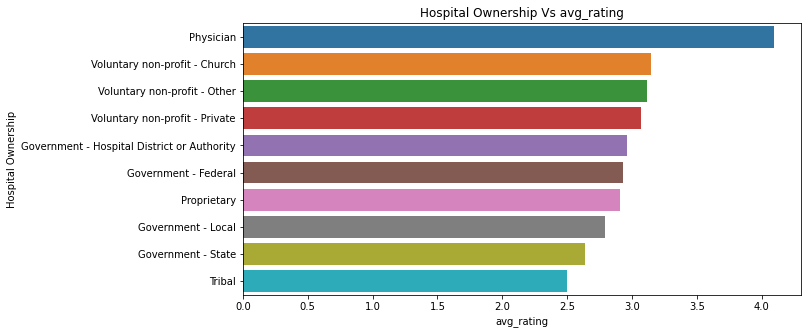

**************************************************************************************************** 





In [135]:
# Hospital ownership
avg_by_ownership = rating.groupby("Hospital Ownership" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"}).sort_values(["Hospital overall rating"] ,ascending=False)
avg_by_ownership.columns = ["Hospital Ownership","avg_rating","count"]
print('\n')
print('Average Rating by Hospital Ownership:')
print(avg_by_ownership);Line_Separator1()

# Data outcome visualization 
plt.rcParams['figure.figsize']=(10,5)
g=sns.barplot(data=avg_by_ownership, x="avg_rating", y="Hospital Ownership")
plt.title('Hospital Ownership Vs avg_rating')
plt.show();Line_Separator1()
print('\n')

AVG rating was observed low for tribal, local government, and the higher rating was kept for physician and voluntary non-profit organizations such as a church, private and others
1. This result indicates that the average star rating varies by about 1.15 in different levels of mortality.
2. will follow the similar SOP for other variables too.

In [136]:
def plot_rating(cat_var, var_name):
    a = rating.groupby(cat_var, as_index = False).agg({"Hospital overall rating":"mean"},skipna=True)
    b = rating.groupby(cat_var, as_index = False).agg({"Hospital overall rating":"count"},skipna=True)
    
  
    a.columns = [var_name,1]
    b.columns = [var_name,2]
    agg_response =  a.merge(b, left_on=var_name,right_on=var_name)
 
    agg_response.columns = [var_name, "avg_rating","count"]
    agg_response.iloc[:, 1] = agg_response.iloc[:,1]
  
    agg_response = agg_response.sort_values(["avg_rating"] ,ascending=False)
    
    p_plot = sns.barplot(y= var_name , x = "avg_rating" ,  data =agg_response)
    p_plot.set_xticklabels(p_plot.get_xticklabels(), rotation=45, horizontalalignment='right')
    p_plot.set_xlabel("Avg_rating")
    
        
    plt.show()
    return((agg_response.iloc[0, 1] - agg_response.iloc[agg_response.shape[0]-1, 1], p_plot, agg_response))

**1) Mortality** 



                                  Mortality national comparison Vs. avg_rating


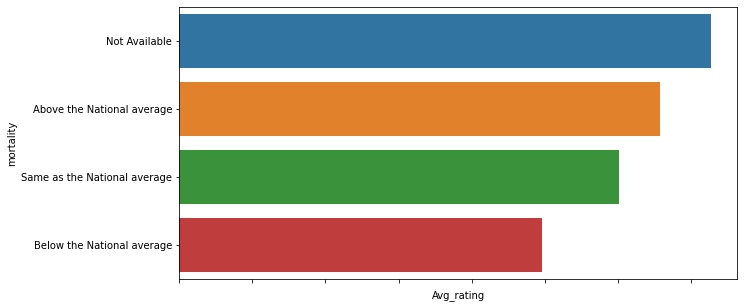

**************************************************************************************************** 



  Mortality national comparison  avg_rating  count
2                 Not Available    3.634021    510
0    Above the National average    3.290000    400
3  Same as the National average    3.007062   2129
1    Below the National average    2.481050    343
**************************************************************************************************** 

Mortality - average ratings :


1.152971
**************************************************************************************************** 



In [137]:
print('\n')
print('                                  Mortality national comparison Vs. avg_rating')
diff_mortality = plot_rating("Mortality national comparison", "mortality")
plt.show();Line_Separator1()

print('\n')

avg_by_mortality = rating.groupby("Mortality national comparison", as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"}).sort_values(["Hospital overall rating"] ,ascending=False)
avg_by_mortality.columns = ["Mortality national comparison","avg_rating","count"]
print (avg_by_mortality);Line_Separator1()

print("Mortality - average ratings :")
print('\n')
print (diff_mortality[0]);Line_Separator1()

The average star rating varies by 1.15 in different levels of mortality. Similarly, way we will maintain evaluable the average rating across other groups.

**2) Safety of care**



                               Safety of care national comparison Vs. avg_rating


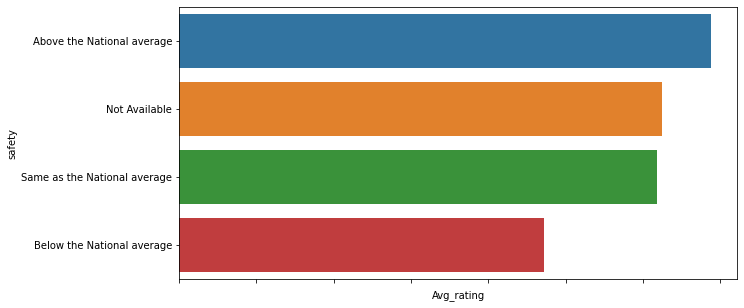

**************************************************************************************************** 



  Safety of care national comparison  avg_rating  count
0         Above the National average    3.437811    805
1         Below the National average    2.362556    673
2                      Not Available    3.121951    519
3       Same as the National average    3.092821   1385
**************************************************************************************************** 

Safety - average ratings :


1.0752552
**************************************************************************************************** 



In [138]:
print('\n')
print('                               Safety of care national comparison Vs. avg_rating')
diff_safety = plot_rating("Safety of care national comparison", "safety")
plt.show();Line_Separator1()

print('\n')

avg_by_safety = rating.groupby("Safety of care national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_safety.columns =[ "Safety of care national comparison" , "avg_rating", "count"]
print(avg_by_safety);Line_Separator1()

print("Safety - average ratings :")
print('\n')
print (diff_safety[0]);Line_Separator1()

**3) Readmission**



                               Readmission national comparison Vs. avg_rating


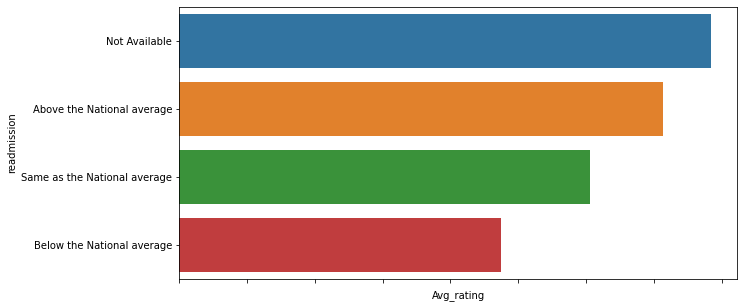

**************************************************************************************************** 



  Readmission national comparison  avg_rating  count
0      Above the National average    3.567636    791
1      Below the National average    2.375443    849
2                   Not Available    3.919355    427
3    Same as the National average    3.032333   1315
**************************************************************************************************** 

Readmission - average ratings :


1.5439122
**************************************************************************************************** 



In [139]:
print('\n')
print('                               Readmission national comparison Vs. avg_rating')
diff_readmission = plot_rating("Readmission national comparison", "readmission")
plt.show();Line_Separator1()

print('\n')

avg_by_readmission = rating.groupby("Readmission national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_readmission.columns =[ "Readmission national comparison" , "avg_rating", "count"]
print (avg_by_readmission);Line_Separator1()

print("Readmission - average ratings :")
print('\n')
print (diff_readmission[0]);Line_Separator1()


The average star rating varies by 1.54 in different levels in readmission.

**3) Patient experience**



                              Patient experience national comparison Vs. avg_rating


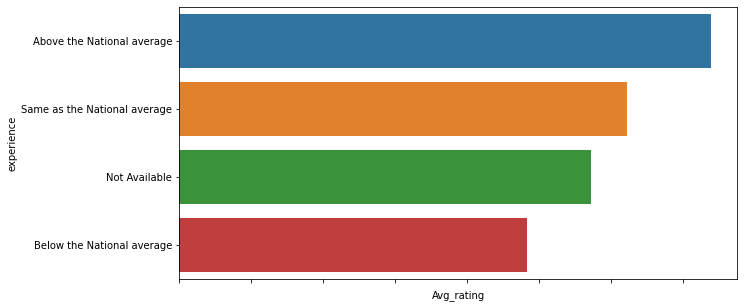

**************************************************************************************************** 



  Patient experience national comparison  avg_rating  count
0             Above the National average    3.689966    929
1             Below the National average    2.416126   1082
2                          Not Available    2.858586    370
3           Same as the National average    3.108434   1001
**************************************************************************************************** 

Patient experience - average ratings :


1.2738402
**************************************************************************************************** 



In [140]:
print('\n')
print('                              Patient experience national comparison Vs. avg_rating')
diff_experience = plot_rating("Patient experience national comparison", "experience")
plt.show();Line_Separator1()

print('\n')

avg_by_experience = rating.groupby("Patient experience national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_experience.columns =[ "Patient experience national comparison" , "avg_rating", "count"]
print (avg_by_experience);Line_Separator1()

print("Patient experience - average ratings :")
print('\n')
print (diff_experience[0]);Line_Separator1()

The average star rating varies by 1.27 at different levels in Patient experience.

**4) Effectiveness**




                             Effectiveness of care national comparison Vs. avg_rating


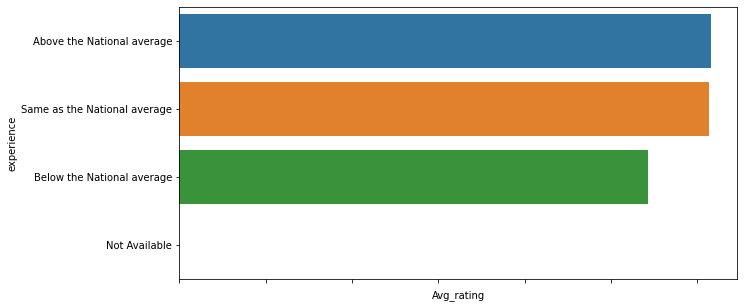

**************************************************************************************************** 



  Effectiveness of care national comparison  avg_rating  count
0                Above the National average    3.077699    991
1                Below the National average    2.716049    454
2                             Not Available         NaN    151
3              Same as the National average    3.068469   1786
**************************************************************************************************** 

Patient experience - average ratings :


nan
**************************************************************************************************** 



In [141]:
print('\n')
print('                             Effectiveness of care national comparison Vs. avg_rating')
diff_effectiveness = plot_rating("Effectiveness of care national comparison", "experience")
plt.show();Line_Separator1()

print('\n')

avg_by_effectiveness = rating.groupby("Effectiveness of care national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_effectiveness.columns =[ "Effectiveness of care national comparison" , "avg_rating", "count"]
print(avg_by_effectiveness);Line_Separator1()

print("Patient experience - average ratings :")
print('\n')
print (diff_effectiveness[0]);Line_Separator1()

**4) Medical**



                            Efficient use of medical imaging national comparison Vs. avg_rating


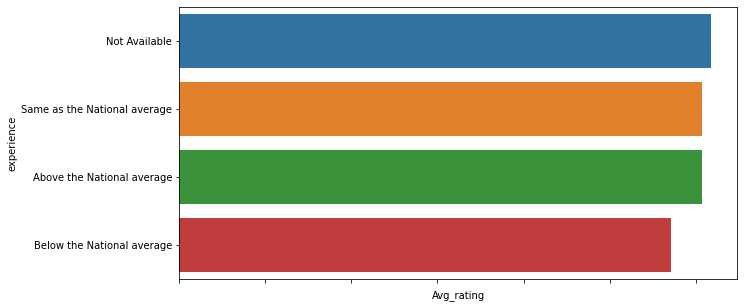

**************************************************************************************************** 



  Efficient use of medical imaging national comparison  avg_rating  count
0                         Above the National average      3.033426    359
1                         Below the National average      2.858824    345
2                                      Not Available      3.086331    867
3                       Same as the National average      3.035437   1811
**************************************************************************************************** 

Medical - average ratings :


0.22750735
**************************************************************************************************** 



In [142]:
print('\n')
print('                            Efficient use of medical imaging national comparison Vs. avg_rating')
diff_medical = plot_rating("Efficient use of medical imaging national comparison", "experience")
plt.show();Line_Separator1()

print('\n')

avg_by_medical = rating.groupby("Efficient use of medical imaging national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_medical.columns =[ "Efficient use of medical imaging national comparison" , "avg_rating", "count"]
print(avg_by_medical);Line_Separator1()

print("Medical - average ratings :")
print('\n')
print (diff_medical[0]);Line_Separator1()

There is not much difference observed between the avg ratings above and the same as an average national hospital by medical group variables.

**4) Timeliness**



                           Timeliness of care national comparison Vs. avg_rating


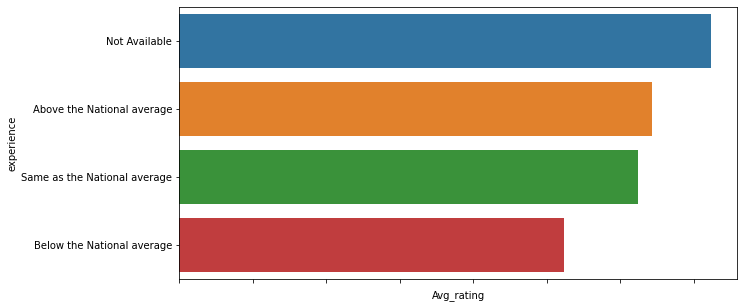

**************************************************************************************************** 



  Timeliness of care national comparison  avg_rating  count
0             Above the National average    3.217918    859
1             Below the National average    2.618465    899
2                          Not Available    3.615894    411
3           Same as the National average    3.123207   1213
**************************************************************************************************** 

Timeliness - average ratings :


0.99742913
**************************************************************************************************** 



In [143]:
print('\n')
print('                           Timeliness of care national comparison Vs. avg_rating')
diff_timeliness = plot_rating("Timeliness of care national comparison", "experience")
plt.show();Line_Separator1()

print('\n')

avg_by_timeliness = rating.groupby("Timeliness of care national comparison" , as_index = False).agg({"Hospital overall rating":"mean", "Provider ID":"count"})
avg_by_timeliness.columns =["Timeliness of care national comparison" , "avg_rating", "count"]
print(avg_by_timeliness);Line_Separator1()

print("Timeliness - average ratings :")
print('\n')
print (diff_timeliness[0]);Line_Separator1()

The average star rating varies by 0.99 in Timeliness of care, which is significant.

In [144]:
# Groups on avg star rating combined - summary
group_effect = pd.Series({"mortality" : diff_mortality[0], "timeliness" : diff_timeliness[0], "medical" : diff_medical[0], "effectiveness" : diff_effectiveness[0],  "experience" :diff_experience[0], "safety" : diff_safety[0],  "readmission" : diff_readmission[0]})
group_importance = group_effect.sort_values()
print (group_importance);Line_Separator1()

medical          0.227507
timeliness       0.997429
safety           1.075255
mortality        1.152971
experience       1.273840
readmission      1.543912
effectiveness         NaN
dtype: float32
**************************************************************************************************** 



**Bivariate analysis**

Analysis of correlation of variance in a different group

**1) Mortality** - will use clean file   

In [145]:
mortality = mortality_clean
print(mortality.shape);Line_Separator1()
print(mortality.dtypes);Line_Separator1()

(4818, 8)
**************************************************************************************************** 

Provider ID                int64
MORT_30_AMI_score        float64
MORT_30_CABG_score       float64
MORT_30_COPD_score       float64
MORT_30_HF_score         float64
MORT_30_PN_score         float64
MORT_30_STK_score        float64
PSI_4_SURG_COMP_Score    float64
dtype: object
**************************************************************************************************** 



In [146]:
# Calcuate the correlation
mortality_cor = mortality.iloc[:,1:].corr().round(2)
mortality_cor

,MORT_30_AMI_score,MORT_30_CABG_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,PSI_4_SURG_COMP_Score
MORT_30_AMI_score,1.00,0.34,0.20,0.31,0.33,0.26,0.20
MORT_30_CABG_score,0.34,1.00,0.18,0.21,0.22,0.13,0.14
MORT_30_COPD_score,0.20,0.18,1.00,0.38,0.34,0.30,0.13
MORT_30_HF_score,0.31,0.21,0.38,1.00,0.40,0.33,0.12
MORT_30_PN_score,0.33,0.22,0.34,0.40,1.00,0.28,0.17
MORT_30_STK_score,0.26,0.13,0.30,0.33,0.28,1.00,0.12
PSI_4_SURG_COMP_Score,0.20,0.14,0.13,0.12,0.17,0.12,1.00


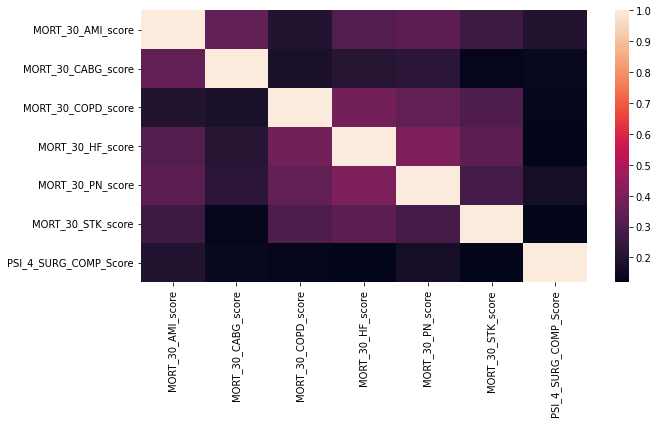

**************************************************************************************************** 

Features having correlation 0.30 above:4

['MORT_30_CABG_score', 'MORT_30_HF_score', 'MORT_30_PN_score', 'MORT_30_STK_score']


In [147]:
# Data visulization
plt.figure(figsize = (10,5))
ax = sns.heatmap(mortality_cor)
plt.show() ;Line_Separator1()

# upper value
Upper_Value = mortality_cor.where(np.triu(np.ones(mortality_cor.shape), k=1).astype(np.bool))

# # Features having a Higher correlation of more than 0.3
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.30)]

print("Features having correlation 0.30 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

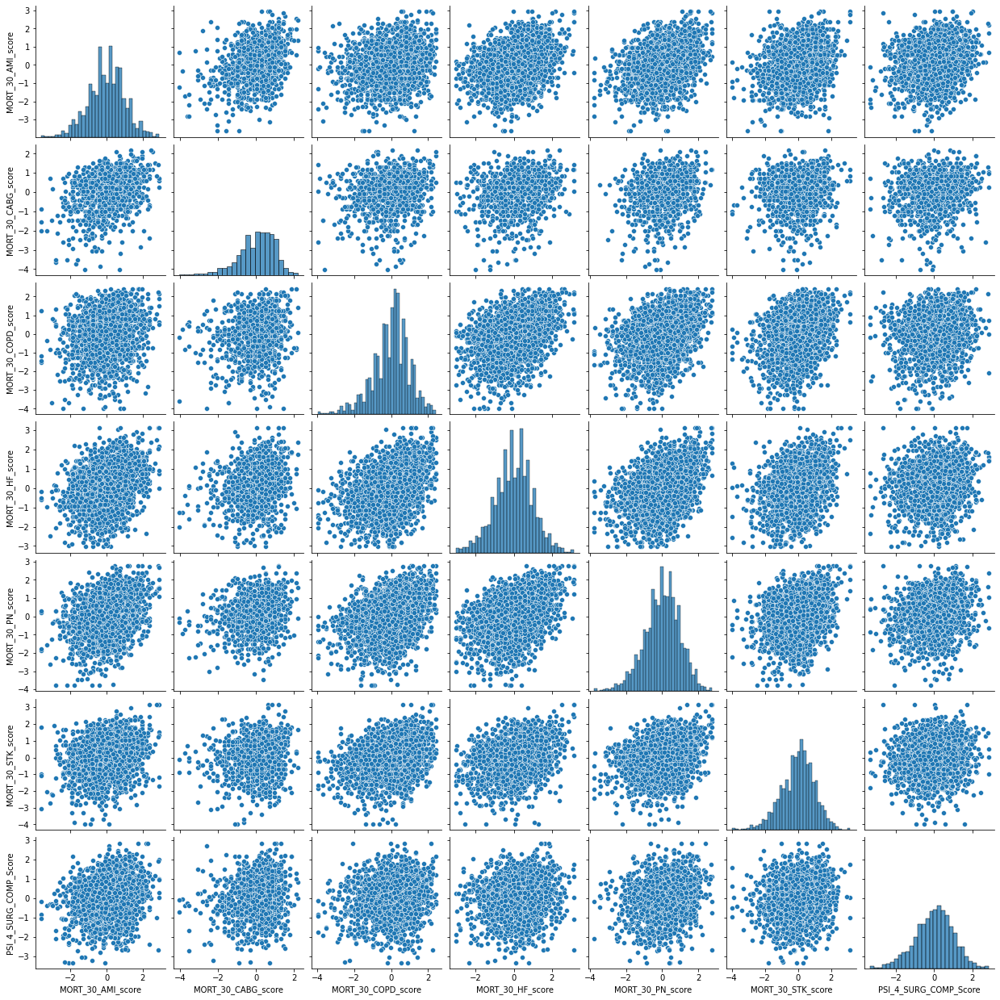

In [148]:
sns.pairplot(mortality.iloc[:,1:]) 
plt.show()

In [149]:
# Review how measured scores affect the overall star ratings 

# Import the Hospital General information file)
ratings = pd.read_csv('../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Hospital General Information.csv', encoding = "ISO-8859-1")

# Merge the file mrotality with ratings
mort_rating = mortality.merge(ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
mort_summary = mort_rating.iloc[:,1:].groupby("Hospital overall rating").mean()

# Save as mortality_directions
mortality_directions = mort_summary

mortality_directions

,MORT_30_AMI_score,MORT_30_CABG_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,PSI_4_SURG_COMP_Score
Hospital overall rating,,,,,,,
1,-0.435802,-0.226183,-0.411371,0.089222,-0.502762,-0.553750,-0.600630
2,-0.229956,-0.118130,-0.199247,-0.103743,-0.339176,-0.088457,-0.239604
3,0.006075,-0.015115,-0.015281,-0.078331,-0.051256,-0.014574,0.017706
4,0.235042,0.132540,0.180235,0.209782,0.375591,0.168116,0.289568
5,0.808561,0.394143,0.596584,0.752923,0.899423,0.395118,0.443426
Not Available,-0.233805,-0.135741,0.058257,-0.251130,-0.047638,-0.131775,1.402113


The rating increases as each score also increases but not for HF; hence could be less important.

**2. Readmission** - will use clean file 

In [150]:
readmission = readmission_clean
print(readmission.shape);Line_Separator1()
print(readmission.dtypes);Line_Separator1()

(4818, 9)
**************************************************************************************************** 

Provider ID                   int64
READM_30_AMI_score          float64
READM_30_CABG_score         float64
READM_30_COPD_score         float64
READM_30_HF_score           float64
READM_30_HIP_KNEE_score     float64
READM_30_HOSP_WIDE_score    float64
READM_30_PN_score           float64
READM_30_STK_score          float64
dtype: object
**************************************************************************************************** 



In [151]:
# calcuate the correlation
readmission_cor = readmission.iloc[:,1:].corr().round(2)
readmission_cor

,READM_30_AMI_score,READM_30_CABG_score,READM_30_COPD_score,READM_30_HF_score,READM_30_HIP_KNEE_score,READM_30_HOSP_WIDE_score,READM_30_PN_score,READM_30_STK_score
READM_30_AMI_score,1.00,0.37,0.30,0.39,0.22,0.46,0.36,0.31
READM_30_CABG_score,0.37,1.00,0.11,0.25,0.12,0.29,0.17,0.15
READM_30_COPD_score,0.30,0.11,1.00,0.37,0.14,0.51,0.38,0.29
READM_30_HF_score,0.39,0.25,0.37,1.00,0.15,0.58,0.44,0.38
READM_30_HIP_KNEE_score,0.22,0.12,0.14,0.15,1.00,0.33,0.18,0.17
READM_30_HOSP_WIDE_score,0.46,0.29,0.51,0.58,0.33,1.00,0.59,0.47
READM_30_PN_score,0.36,0.17,0.38,0.44,0.18,0.59,1.00,0.37
READM_30_STK_score,0.31,0.15,0.29,0.38,0.17,0.47,0.37,1.00


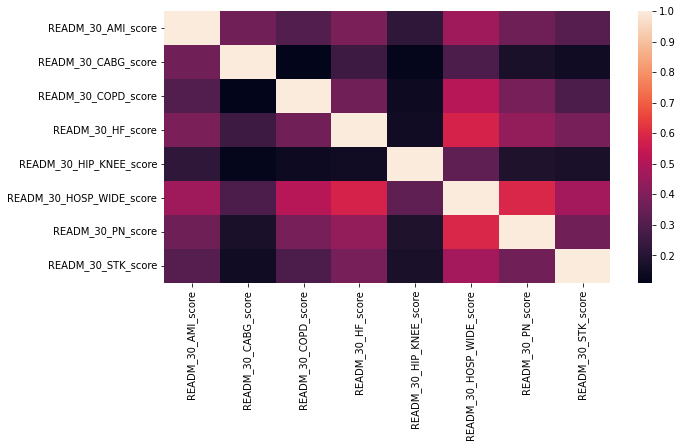

************************************************************ 

Features having correlation 0.50 above:2

['READM_30_HOSP_WIDE_score', 'READM_30_PN_score']


In [152]:
# Data visualization -2. readmission
plt.figure(figsize = (10,5))
ax = sns.heatmap(readmission_cor)
plt.show();Line_Separator()

# Upper value
Upper_Value = readmission_cor.where(np.triu(np.ones(readmission_cor.shape), k=1).astype(np.bool))

# Features having a Higher correlation of more than 0.5
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.50)]

print("Features having correlation 0.50 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

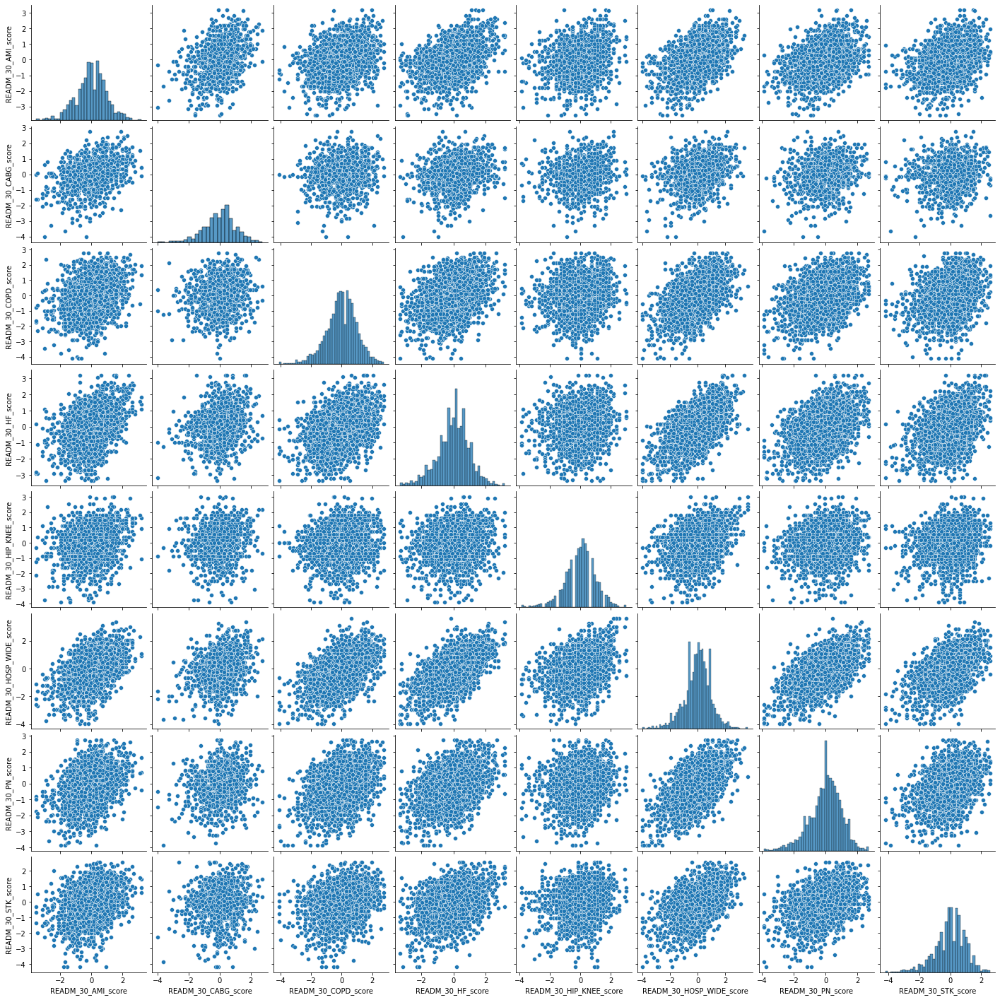

In [153]:
sns.pairplot(readmission.iloc[:,1:]) 
plt.show()

In [154]:
# Review how measured scores affect the overall star ratings 

# Merge the file readmission with ratings
read_rating = readmission.merge( ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
read_summary = read_rating.iloc[:,1:].groupby("Hospital overall rating").mean()

# Save file as readmission_directions
readmission_directions = read_summary

readmission_directions


,READM_30_AMI_score,READM_30_CABG_score,READM_30_COPD_score,READM_30_HF_score,READM_30_HIP_KNEE_score,READM_30_HOSP_WIDE_score,READM_30_PN_score,READM_30_STK_score
Hospital overall rating,,,,,,,,
1,-0.587987,-0.579170,-1.010922,-1.135419,-0.308514,-1.754811,-1.235761,-0.946181
2,-0.412838,-0.214150,-0.392431,-0.479812,-0.282714,-0.787223,-0.608951,-0.323454
3,0.050120,-0.037028,0.013501,-0.008729,-0.054326,-0.020774,0.032184,0.037234
4,0.362136,0.312745,0.346209,0.436153,0.201879,0.612331,0.408642,0.327276
5,1.010679,0.454325,0.965285,1.258529,0.882893,1.662541,0.849935,0.662691
Not Available,-0.697518,0.228152,-0.035695,-0.030337,-0.007115,0.004945,0.123448,0.155065


As the rating increases, all measures of readmission increase too. This says that all readmission measures seem to be necessary.

**3. Timeliness** - will use clean file

In [155]:
timeliness= timeliness_clean
print(timeliness.shape);Line_Separator1()
print(timeliness.dtypes);Line_Separator1()

(4818, 8)
**************************************************************************************************** 

Provider ID       int64
ED_1b_Score     float64
ED_2b_Score     float64
OP_18b_Score    float64
OP_20_Score     float64
OP_21_Score     float64
OP_3b_Score     float64
OP_5_Score      float64
dtype: object
**************************************************************************************************** 



In [156]:
# Calcuate the correlation

timeliness_cor = timeliness.iloc[:,1:].corr().round(2)

timeliness_cor

,ED_1b_Score,ED_2b_Score,OP_18b_Score,OP_20_Score,OP_21_Score,OP_3b_Score,OP_5_Score
ED_1b_Score,1.00,0.89,0.72,0.47,0.43,0.17,0.19
ED_2b_Score,0.89,1.00,0.59,0.34,0.31,0.08,0.13
OP_18b_Score,0.72,0.59,1.00,0.56,0.48,0.10,0.13
OP_20_Score,0.47,0.34,0.56,1.00,0.56,0.16,0.17
OP_21_Score,0.43,0.31,0.48,0.56,1.00,0.16,0.24
OP_3b_Score,0.17,0.08,0.10,0.16,0.16,1.00,0.29
OP_5_Score,0.19,0.13,0.13,0.17,0.24,0.29,1.00


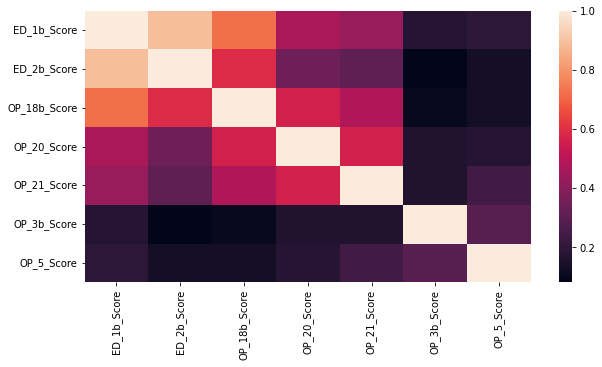

************************************************************ 

Features having correlation 0.50 above:4

['ED_2b_Score', 'OP_18b_Score', 'OP_20_Score', 'OP_21_Score']


In [157]:
plt.figure(figsize = (10,5))
ax = sns.heatmap(timeliness_cor)
plt.show();Line_Separator()

# uper value
Upper_Value = timeliness_cor.where(np.triu(np.ones(timeliness_cor.shape), k=1).astype(np.bool))

# Feture having Higher correlation more than 0.5
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.5)]

print("Features having correlation 0.50 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

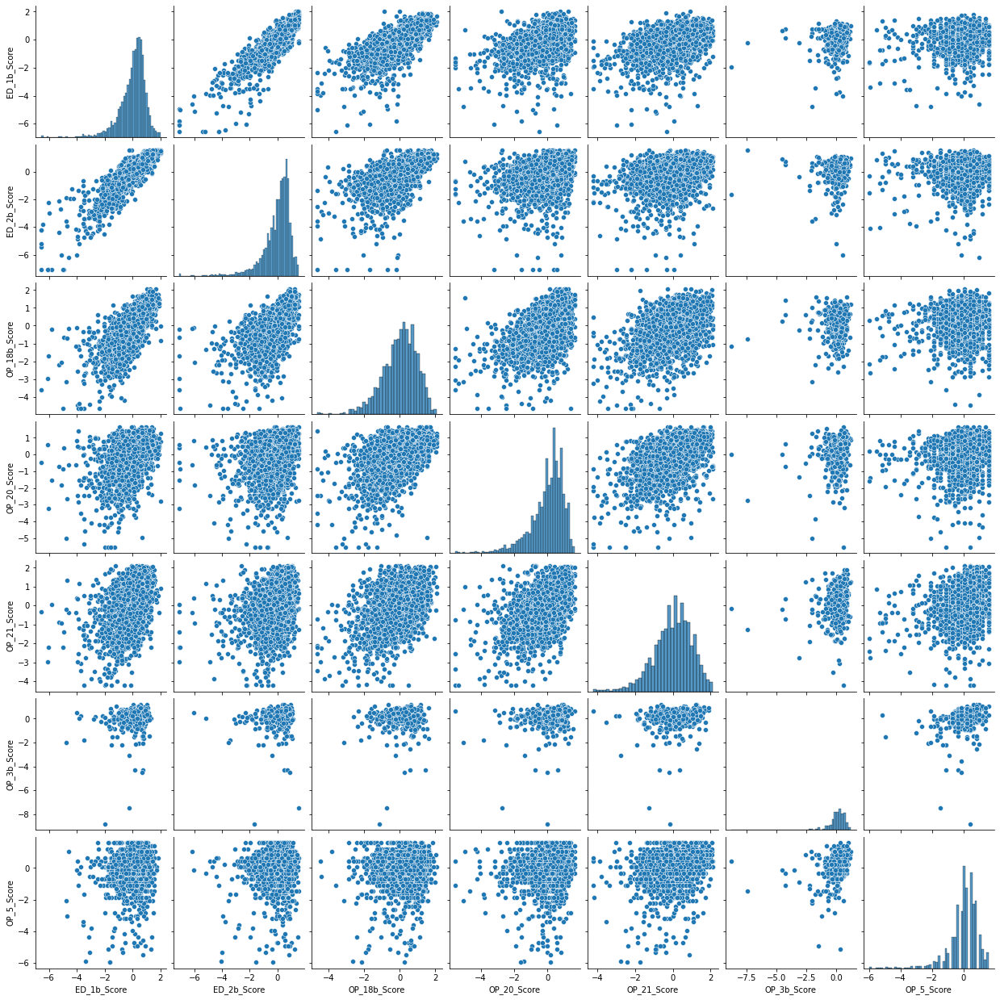

In [158]:
sns.pairplot(timeliness.iloc[:,1:]) 
plt.show()

In [159]:
# Review how measured scores affect the overall star ratings 

# Renaming not available to nan and convert them to float
for i in range(0,timeliness.shape[1]):
    timeliness.iloc[:, i] = timeliness.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")


# Merge the file timeliness with ratings
timeliness_rating = timeliness.merge(ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
timeliness_summary = timeliness_rating.iloc[:,1:].groupby("Hospital overall rating").mean()
 

# Save data as timeliness_directions
timeliness_directions = timeliness_summary
timeliness_directions

,ED_1b_Score,ED_2b_Score,OP_18b_Score,OP_20_Score,OP_21_Score,OP_3b_Score,OP_5_Score
Hospital overall rating,,,,,,,
1,-1.403124,-1.295772,-0.981962,-1.010547,-0.763128,-0.402648,-0.841403
2,-0.513647,-0.508411,-0.432308,-0.265527,-0.294163,-0.136963,-0.091390
3,0.101455,0.099121,0.055146,0.039011,0.029684,-0.020997,-0.015496
4,0.241641,0.206479,0.093315,0.152167,0.236086,0.182148,0.203804
5,0.301265,0.174043,-0.045435,0.124747,0.262826,0.541713,0.341089
Not Available,0.392616,0.499140,0.746512,0.287786,0.159653,-0.355088,-0.181074


The rating score increases as overall hospital increases except for OP_18b.

**4. Effectiveness** - will use clean file

In [160]:
effectiveness= effectiveness_clean
print(effectiveness.shape);Line_Separator1()
print(effectiveness.dtypes);Line_Separator1()

(4818, 19)
**************************************************************************************************** 

Provider ID                       int64
CAC_3_Score                     float64
IMM_2_Score                     float64
IMM_3_OP_27_FAC_ADHPCT_Score    float64
OP_22_Score                     float64
OP_23_Score                     float64
OP_29_Score                     float64
OP_30_Score                     float64
OP_4_Score                      float64
PC_01_Score                     float64
STK_4_Score                     float64
STK_5_Score                     float64
STK_6_Score                     float64
STK_8_Score                     float64
VTE_1_Score                     float64
VTE_2_Score                     float64
VTE_3_Score                     float64
VTE_5_Score                     float64
VTE_6_Score                     float64
dtype: object
**************************************************************************************************** 



In [161]:
# Calcuate the correlation

effectiveness_cor = effectiveness.iloc[:,1:].corr().round(2)
effectiveness_cor

,CAC_3_Score,IMM_2_Score,IMM_3_OP_27_FAC_ADHPCT_Score,OP_22_Score,OP_23_Score,OP_29_Score,OP_30_Score,OP_4_Score,PC_01_Score,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score
CAC_3_Score,1.00,0.31,0.03,0.15,0.04,-0.12,0.05,-0.09,-0.01,0.23,0.24,0.51,0.46,0.31,0.20,0.04,0.17,0.23
IMM_2_Score,0.31,1.00,0.17,0.11,0.18,0.13,0.14,0.29,0.20,0.34,0.28,0.21,0.30,0.56,0.37,0.15,0.26,0.21
IMM_3_OP_27_FAC_ADHPCT_Score,0.03,0.17,1.00,0.05,0.02,0.09,0.06,0.08,0.08,0.07,0.08,0.11,0.05,0.19,0.12,0.08,-0.01,0.07
OP_22_Score,0.15,0.11,0.05,1.00,0.15,0.06,0.06,0.10,0.05,0.09,0.06,0.04,0.06,0.09,0.11,0.08,0.04,0.08
OP_23_Score,0.04,0.18,0.02,0.15,1.00,0.08,0.06,0.09,0.01,0.26,0.10,0.19,0.16,0.26,0.23,0.10,0.14,0.20
OP_29_Score,-0.12,0.13,0.09,0.06,0.08,1.00,0.37,0.11,0.06,0.05,0.06,0.14,0.10,0.13,0.11,0.19,0.05,0.07
OP_30_Score,0.05,0.14,0.06,0.06,0.06,0.37,1.00,0.15,0.04,0.03,0.06,0.09,0.09,0.15,0.12,0.16,0.08,0.07
OP_4_Score,-0.09,0.29,0.08,0.10,0.09,0.11,0.15,1.00,0.16,0.04,0.10,0.12,0.08,0.41,0.21,0.15,0.14,0.12
PC_01_Score,-0.01,0.20,0.08,0.05,0.01,0.06,0.04,0.16,1.00,0.11,0.12,0.09,0.12,0.22,0.16,0.08,0.05,0.08
STK_4_Score,0.23,0.34,0.07,0.09,0.26,0.05,0.03,0.04,0.11,1.00,0.27,0.54,0.37,0.38,0.32,0.20,0.09,0.28


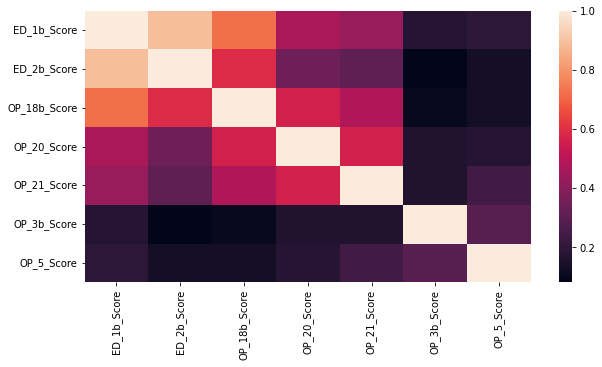

************************************************************ 

Features having correlation 0.50 above:4

['STK_6_Score', 'VTE_1_Score', 'VTE_2_Score', 'VTE_6_Score']


In [162]:
plt.figure(figsize = (10,5))
ax = sns.heatmap(timeliness_cor)
plt.show();Line_Separator()

# upper value
Upper_Value = effectiveness_cor.where(np.triu(np.ones(effectiveness_cor.shape), k=1).astype(np.bool))

# Feature having Higher correlation more than 0.5
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.50)]

print("Features having correlation 0.50 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

In [163]:
# Review how measured scores affect the overall star ratings

# Renaming not available to nan and convert them to float

for i in range(1,effectiveness.shape[1]):
    effectiveness.iloc[:, i] = effectiveness.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")


# Merge the file timeliness with ratings
effectiveness_rating = effectiveness.merge(ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
effectiveness_summary = effectiveness_rating.iloc[:,1:].groupby("Hospital overall rating").mean()

# Save data as effectiveness_directions
effectiveness_directions = effectiveness_summary

effectiveness_summary

,CAC_3_Score,IMM_2_Score,IMM_3_OP_27_FAC_ADHPCT_Score,OP_22_Score,OP_23_Score,OP_29_Score,OP_30_Score,OP_4_Score,PC_01_Score,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score
Hospital overall rating,,,,,,,,,,,,,,,,,,
1,0.093297,-0.237055,-0.286013,-0.668610,-0.018318,-0.283770,-0.287427,-0.108566,0.073756,-0.034679,-0.333651,-0.045860,-0.251070,-0.021012,-0.110076,-0.274894,-0.212911,-0.117512
2,-0.014510,0.048598,-0.216706,-0.237036,-0.022829,-0.151792,-0.150026,-0.098645,-0.075497,-0.102196,-0.076035,-0.070538,-0.122434,0.022722,-0.030565,-0.092616,-0.088784,0.005926
3,0.215222,0.077898,0.005147,0.000397,0.010375,0.005959,-0.006975,0.017295,0.017053,0.004799,0.059362,-0.024613,0.019375,0.027653,-0.043294,-0.018958,0.004722,-0.005670
4,-0.092655,0.229425,0.205339,0.206725,0.026419,0.128768,0.172189,0.144503,0.080127,0.195671,0.092348,0.137256,0.184154,0.223209,0.176954,0.135297,0.094529,0.068391
5,0.396966,0.311343,0.226511,0.400767,-0.035321,0.289198,0.233523,0.218820,0.117447,0.106661,0.186632,0.277361,0.090134,0.363209,0.282855,0.230927,0.259156,0.254097
Not Available,-0.253627,-0.980340,-0.075088,0.267615,-0.211141,-0.012028,-0.195705,-0.372397,-0.375349,-1.342218,-1.004279,-0.641596,-0.826454,-0.965513,-0.568791,0.315907,0.136592,-0.053075


As overall hospital rating increases, the score of variables increases except for CAC_3, OP_23, PC_01, SKT_6, and VTE_6.

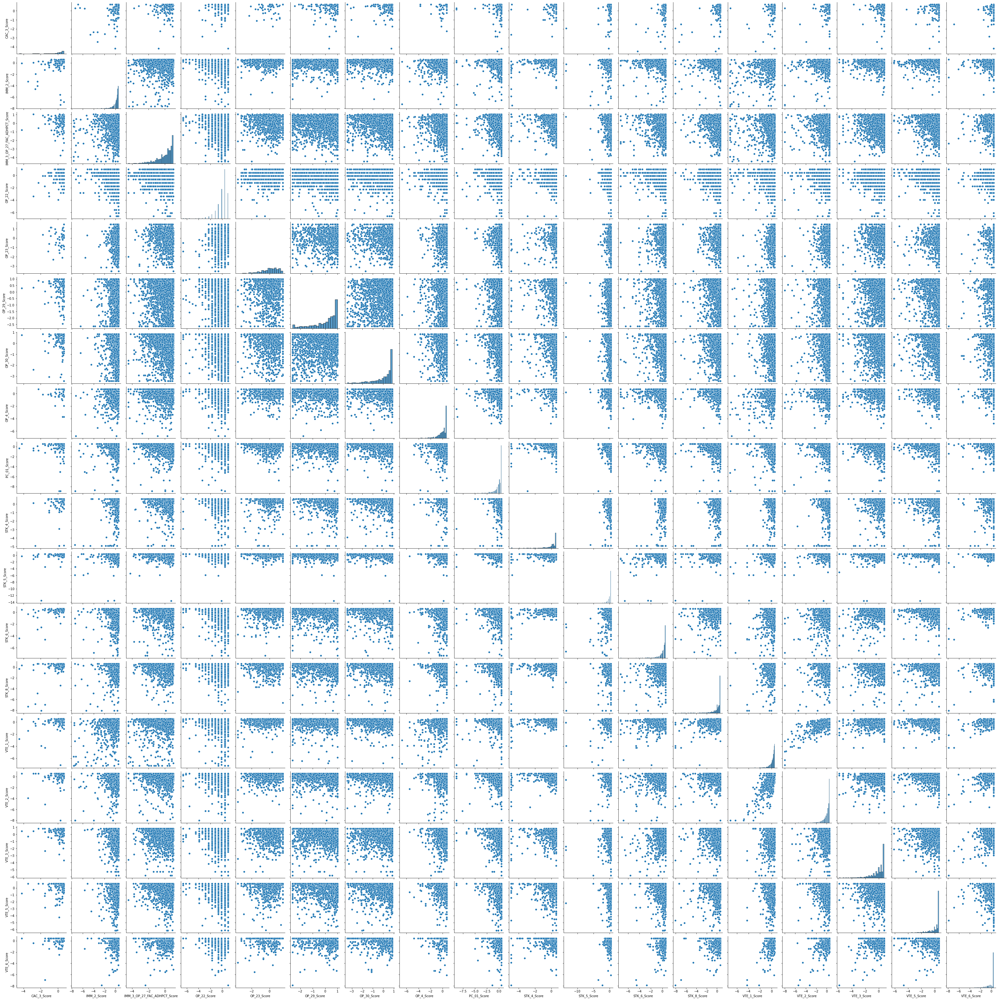

In [164]:
sns.pairplot(effectiveness.iloc[:,1:]) 
plt.show()

**5.  Experience** - will use clean file

In [165]:
experience= experience_clean
print(experience.shape);Line_Separator1()
print(experience.dtypes);Line_Separator1()

(4818, 12)
**************************************************************************************************** 

Provider ID                         int64
H_CLEAN_LINEAR_SCORE_mean         float64
H_COMP_1_LINEAR_SCORE_mean        float64
H_COMP_2_LINEAR_SCORE_mean        float64
H_COMP_3_LINEAR_SCORE_mean        float64
H_COMP_4_LINEAR_SCORE_mean        float64
H_COMP_5_LINEAR_SCORE_mean        float64
H_COMP_6_LINEAR_SCORE_mean        float64
H_COMP_7_LINEAR_SCORE_mean        float64
H_HSP_RATING_LINEAR_SCORE_mean    float64
H_QUIET_LINEAR_SCORE_mean         float64
H_RECMND_LINEAR_SCORE_mean        float64
dtype: object
**************************************************************************************************** 



In [166]:
# Calcuate the correlation

experience_cor = experience.iloc[:,1:].corr().round(2)
experience_cor

,H_CLEAN_LINEAR_SCORE_mean,H_COMP_1_LINEAR_SCORE_mean,H_COMP_2_LINEAR_SCORE_mean,H_COMP_3_LINEAR_SCORE_mean,H_COMP_4_LINEAR_SCORE_mean,H_COMP_5_LINEAR_SCORE_mean,H_COMP_6_LINEAR_SCORE_mean,H_COMP_7_LINEAR_SCORE_mean,H_HSP_RATING_LINEAR_SCORE_mean,H_QUIET_LINEAR_SCORE_mean,H_RECMND_LINEAR_SCORE_mean
H_CLEAN_LINEAR_SCORE_mean,1.00,0.70,0.55,0.72,0.64,0.65,0.47,0.66,0.64,0.50,0.56
H_COMP_1_LINEAR_SCORE_mean,0.70,1.00,0.76,0.87,0.86,0.80,0.65,0.84,0.84,0.59,0.77
H_COMP_2_LINEAR_SCORE_mean,0.55,0.76,1.00,0.69,0.71,0.72,0.53,0.72,0.73,0.63,0.65
H_COMP_3_LINEAR_SCORE_mean,0.72,0.87,0.69,1.00,0.80,0.78,0.61,0.76,0.77,0.59,0.67
H_COMP_4_LINEAR_SCORE_mean,0.64,0.86,0.71,0.80,1.00,0.74,0.58,0.78,0.79,0.56,0.73
H_COMP_5_LINEAR_SCORE_mean,0.65,0.80,0.72,0.78,0.74,1.00,0.63,0.76,0.76,0.58,0.67
H_COMP_6_LINEAR_SCORE_mean,0.47,0.65,0.53,0.61,0.58,0.63,1.00,0.68,0.66,0.37,0.61
H_COMP_7_LINEAR_SCORE_mean,0.66,0.84,0.72,0.76,0.78,0.76,0.68,1.00,0.85,0.56,0.83
H_HSP_RATING_LINEAR_SCORE_mean,0.64,0.84,0.73,0.77,0.79,0.76,0.66,0.85,1.00,0.64,0.93
H_QUIET_LINEAR_SCORE_mean,0.50,0.59,0.63,0.59,0.56,0.58,0.37,0.56,0.64,1.00,0.50


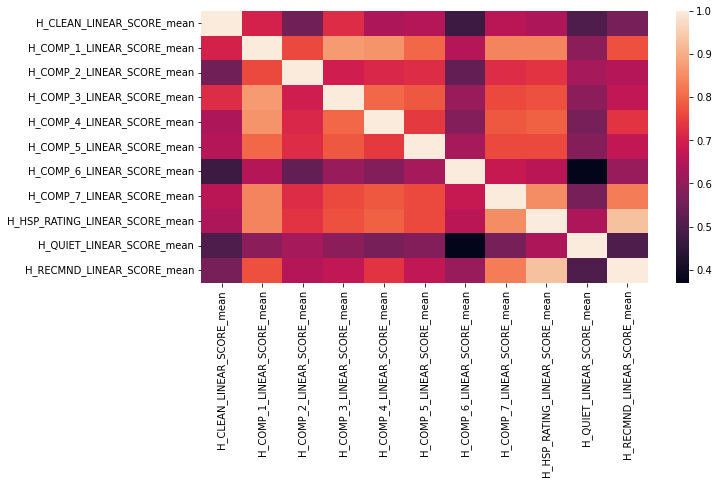

************************************************************ 

Features having correlation 0.70 above:10

['H_COMP_1_LINEAR_SCORE_mean', 'H_COMP_2_LINEAR_SCORE_mean', 'H_COMP_3_LINEAR_SCORE_mean', 'H_COMP_4_LINEAR_SCORE_mean', 'H_COMP_5_LINEAR_SCORE_mean', 'H_COMP_6_LINEAR_SCORE_mean', 'H_COMP_7_LINEAR_SCORE_mean', 'H_HSP_RATING_LINEAR_SCORE_mean', 'H_QUIET_LINEAR_SCORE_mean', 'H_RECMND_LINEAR_SCORE_mean']


In [167]:
# plt.figure(figsize = (10,5))
ax = sns.heatmap(experience_cor)
plt.show();Line_Separator()

# upper value
Upper_Value = experience_cor.where(np.triu(np.ones(experience_cor.shape), k=1).astype(np.bool))

# Feature having Higher correlation more than 0.7
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.50)]

print("Features having correlation 0.70 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

In [168]:
# Review how measured scores affect the overall star ratings

# Renaming not available to nan and convert them to float

for i in range(1,experience.shape[1]):
    experience.iloc[:, i] = experience.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")

# Merge the file timeliness with ratings
experience_rating = experience.merge( ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
experience_summary  = experience_rating.iloc[:,1:].groupby("Hospital overall rating").mean()

# Save data as experience_directions
experience_directions = experience_summary
experience_directions

,H_CLEAN_LINEAR_SCORE_mean,H_COMP_1_LINEAR_SCORE_mean,H_COMP_2_LINEAR_SCORE_mean,H_COMP_3_LINEAR_SCORE_mean,H_COMP_4_LINEAR_SCORE_mean,H_COMP_5_LINEAR_SCORE_mean,H_COMP_6_LINEAR_SCORE_mean,H_COMP_7_LINEAR_SCORE_mean,H_HSP_RATING_LINEAR_SCORE_mean,H_QUIET_LINEAR_SCORE_mean,H_RECMND_LINEAR_SCORE_mean
Hospital overall rating,,,,,,,,,,,
1,-1.278204,-1.572921,-1.165095,-1.635934,-1.480325,-1.305609,-1.316185,-1.370352,-1.529884,-1.091854,-1.310158
2,-0.705074,-0.789867,-0.708620,-0.805845,-0.766661,-0.739491,-0.661296,-0.783722,-0.790442,-0.577726,-0.736899
3,-0.022276,-0.030263,-0.007781,-0.004651,-0.025196,-0.057375,-0.035111,-0.077741,-0.064925,-0.022385,-0.087357
4,0.530316,0.601965,0.504448,0.565816,0.576971,0.576935,0.524472,0.619712,0.617158,0.363698,0.599671
5,0.922046,1.139993,0.822391,1.056120,1.052274,1.022407,0.883460,1.250723,1.385013,0.957874,1.373403
Not Available,0.377638,0.472766,0.410387,0.612969,0.448641,0.570098,0.424864,0.604751,0.553784,0.728751,0.499909


Data indicates that all measures in experience are essential measures.

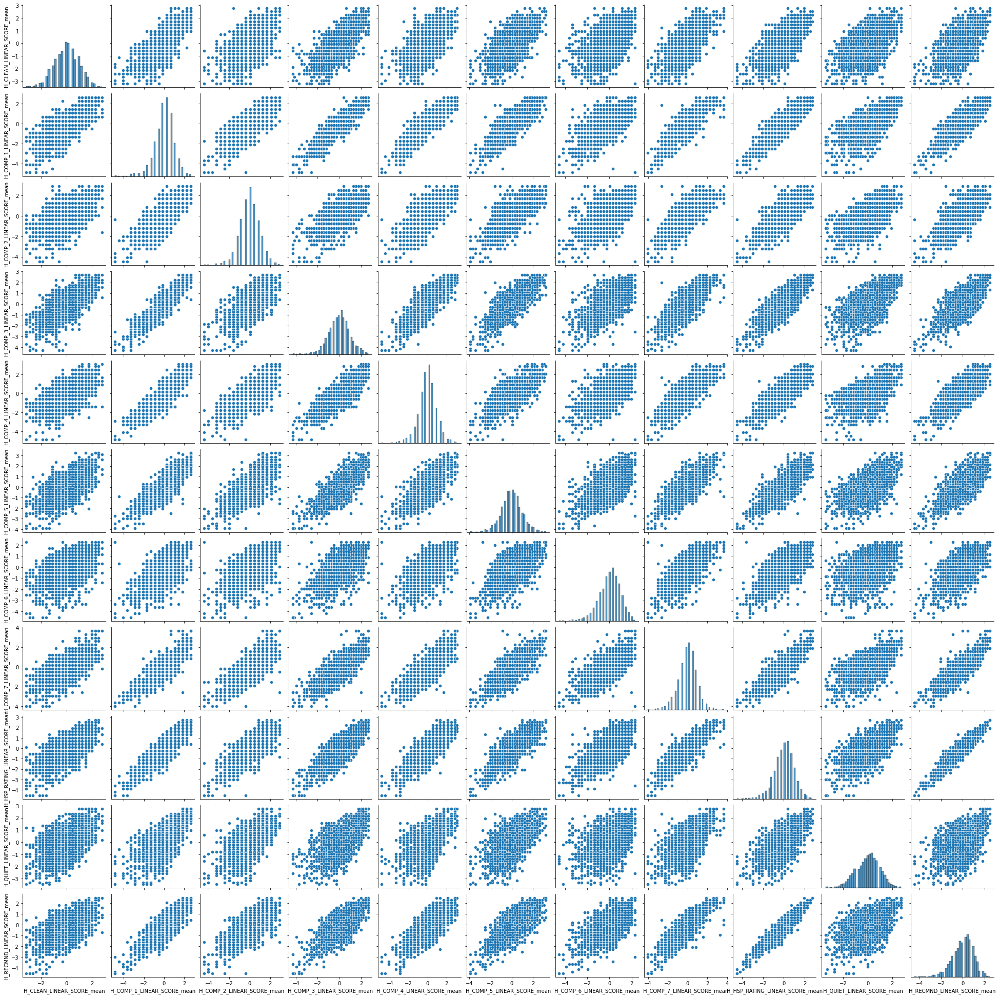

In [169]:
sns.pairplot(experience.iloc[:,1:]) 
plt.show()

**6. Medical** - will use clean file 

In [170]:
medical= pd.read_csv("../input/capstone-project-cms-hospital-ratings/medical_clean.csv", index_col="Unnamed: 0")
print(medical.shape);Line_Separator1()
print(medical.dtypes);Line_Separator1()

(4818, 6)
**************************************************************************************************** 

Provider ID      int64
OP_10_Score    float64
OP_11_Score    float64
OP_13_Score    float64
OP_14_Score    float64
OP_8_Score     float64
dtype: object
**************************************************************************************************** 



In [171]:
# Calcuate the correlation

medical_cor = medical.iloc[:,1:].corr().round(2)
medical_cor

,OP_10_Score,OP_11_Score,OP_13_Score,OP_14_Score,OP_8_Score
OP_10_Score,1.00,0.45,-0.00,-0.05,0.08
OP_11_Score,0.45,1.00,-0.05,-0.01,0.07
OP_13_Score,-0.00,-0.05,1.00,0.03,-0.03
OP_14_Score,-0.05,-0.01,0.03,1.00,0.11
OP_8_Score,0.08,0.07,-0.03,0.11,1.00


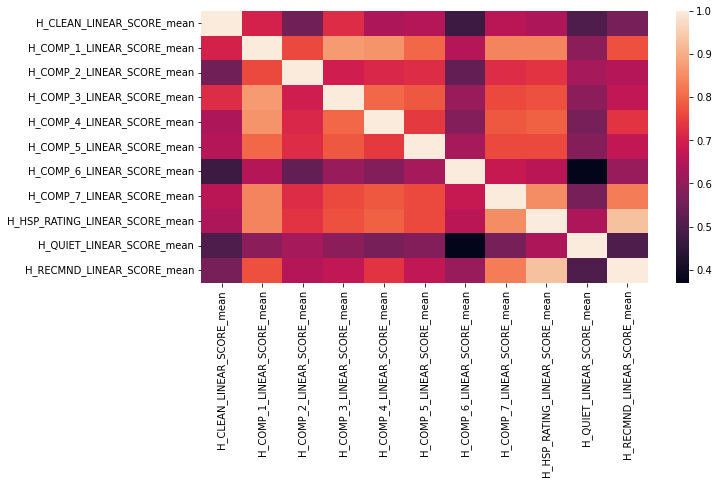

************************************************************ 

Features having correlation 0.50 above:0

[]


In [172]:
plt.figure(figsize = (10,5))
ax = sns.heatmap(experience_cor)
plt.show();Line_Separator()

# upper value
Upper_Value = medical_cor.where(np.triu(np.ones(medical_cor.shape), k=1).astype(np.bool))

# Feature having Higher correlation more more than 0.7
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.50)]

print("Features having correlation 0.50 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

In [173]:
# Review how measured scores affect the overall star ratings

# Renaming not available to nan and convert them to float
for i in range(1,medical.shape[1]):
    medical.iloc[:, i] = medical.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")


# Merge the file timeliness with ratings
medical_rating = medical.merge( ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
medical_summary = medical_rating.iloc[:,1:].groupby("Hospital overall rating").mean()


#  Save data as medical_directions
medical_directions = medical_summary
medical_directions

,OP_10_Score,OP_11_Score,OP_13_Score,OP_14_Score,OP_8_Score
Hospital overall rating,,,,,
1,0.074951,0.132137,0.031845,-0.685448,0.130028
2,-0.088798,-0.095514,-0.035976,-0.272753,0.031217
3,-0.011410,-0.013438,0.031801,0.023550,-0.017616
4,0.132541,0.110139,-0.015565,0.100059,0.003697
5,0.130504,0.240098,-0.135248,0.316503,0.096963
Not Available,-0.213389,-0.271615,0.007125,1.056499,-0.612482


OP 14 is favorable compared to others since the overall hospital rate increases OP_14 increases while others are not.

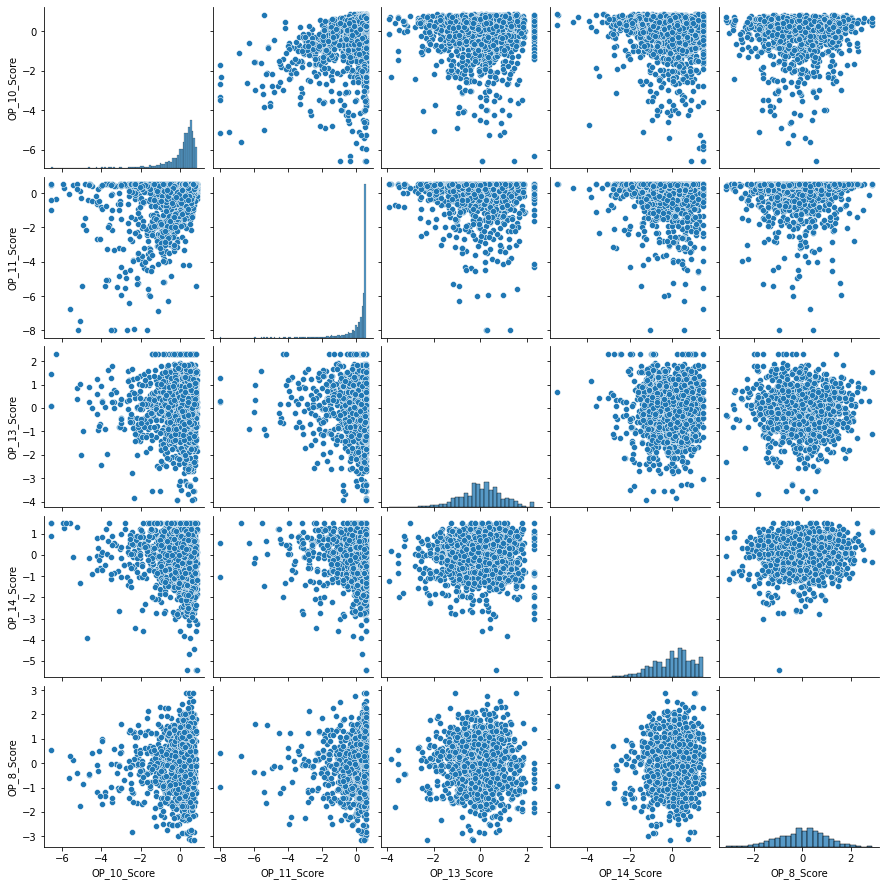

In [174]:
sns.pairplot(medical.iloc[:,1:]) 
plt.show()

** 7. Safety** - will use clean file

In [175]:
safety = safety_clean
print(safety.shape);Line_Separator1()
print(safety.dtypes);Line_Separator1()

(4818, 9)
**************************************************************************************************** 

Provider ID              int64
HAI_1_SIR              float64
HAI_2_SIR              float64
HAI_3_SIR              float64
HAI_4_SIR              float64
HAI_5_SIR              float64
HAI_6_SIR              float64
COMP_HIP_KNEE_Score    float64
PSI_90_SAFETY_Score    float64
dtype: object
**************************************************************************************************** 



In [176]:
# Calcuate the correlation

safety_cor = safety.iloc[:,1:].corr().round(2)
safety_cor

,HAI_1_SIR,HAI_2_SIR,HAI_3_SIR,HAI_4_SIR,HAI_5_SIR,HAI_6_SIR,COMP_HIP_KNEE_Score,PSI_90_SAFETY_Score
HAI_1_SIR,1.00,0.27,0.11,0.08,0.22,-0.02,-0.01,0.06
HAI_2_SIR,0.27,1.00,0.21,0.17,0.12,0.13,-0.01,0.12
HAI_3_SIR,0.11,0.21,1.00,0.20,0.03,0.05,-0.02,0.11
HAI_4_SIR,0.08,0.17,0.20,1.00,-0.02,-0.02,0.01,0.10
HAI_5_SIR,0.22,0.12,0.03,-0.02,1.00,0.10,0.01,-0.01
HAI_6_SIR,-0.02,0.13,0.05,-0.02,0.10,1.00,0.04,0.05
COMP_HIP_KNEE_Score,-0.01,-0.01,-0.02,0.01,0.01,0.04,1.00,0.14
PSI_90_SAFETY_Score,0.06,0.12,0.11,0.10,-0.01,0.05,0.14,1.00


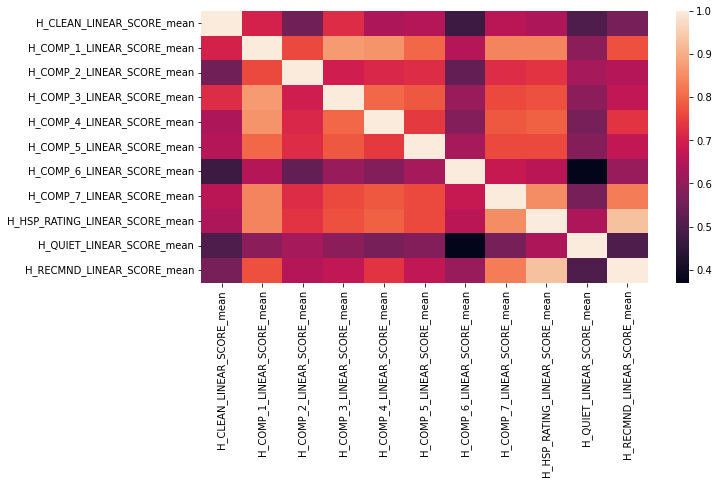

************************************************************ 

Features having correlation 0.50 above:0

[]


In [177]:
plt.figure(figsize = (10,5))
ax = sns.heatmap(experience_cor)
plt.show();Line_Separator()

# uper value
Upper_Value = safety_cor.where(np.triu(np.ones(safety_cor.shape), k=1).astype(np.bool))

# Feture having Higher correlation more than 0.7
High_Corr_features = [column for column in Upper_Value.columns if any(Upper_Value[column] > 0.50)]

print("Features having correlation 0.50 above:{}\n\n{}".format(len(High_Corr_features), High_Corr_features))

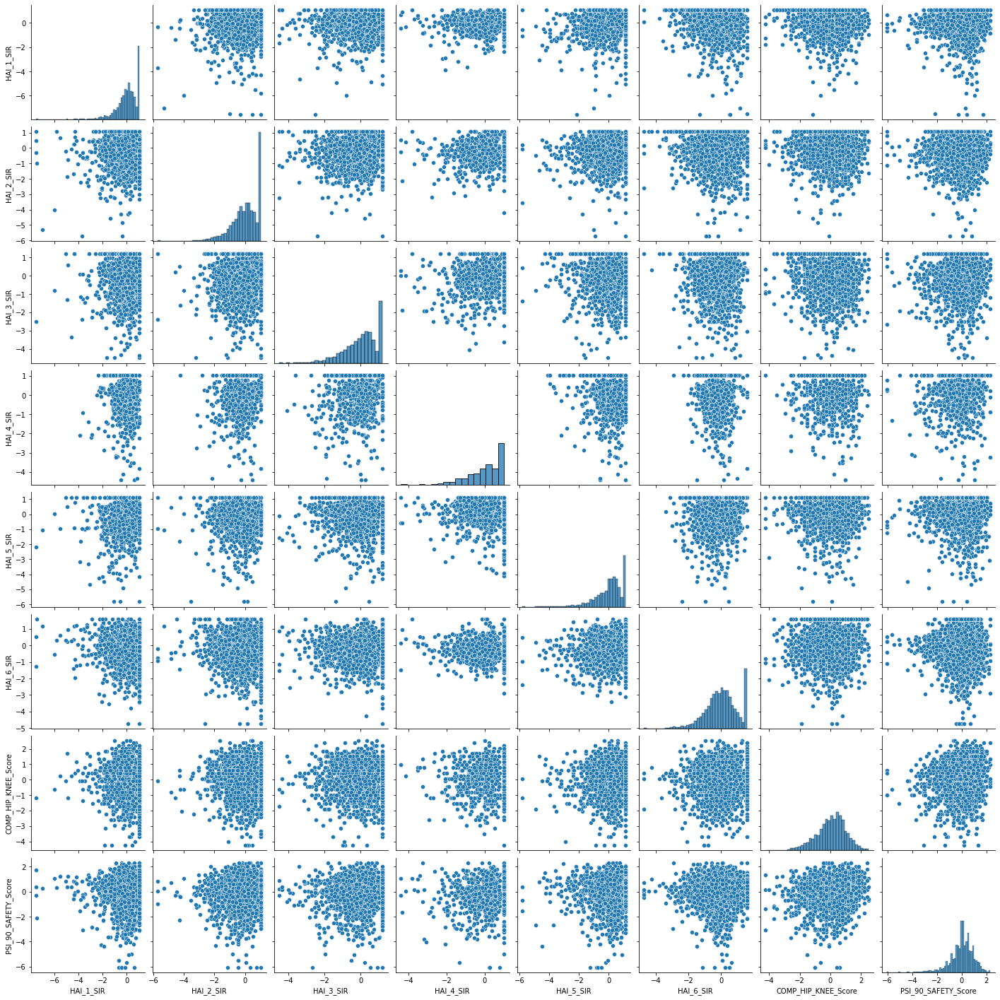

In [178]:
sns.pairplot(safety.iloc[:,1:]) 
plt.show()

In [179]:
# Review how measured scores affect the overall star ratings

# Renaming not available to nan and convert them to float
for i in range(0,safety.shape[1]):
    safety.iloc[:, i] = safety.iloc[:, i].apply(lambda x: remove_missing(x,"Not Available", np.nan)).astype("float64")


# Merge the file timeliness with ratings
safety_rating =safety.merge( ratings[["Provider ID", "Hospital overall rating"]],left_on="Provider ID",right_on="Provider ID")
safety_summary = safety_rating.iloc[:,1:].groupby("Hospital overall rating").mean()
  

# Save data as safety_directions
safety_directions = safety_summary
safety_directions

,HAI_1_SIR,HAI_2_SIR,HAI_3_SIR,HAI_4_SIR,HAI_5_SIR,HAI_6_SIR,COMP_HIP_KNEE_Score,PSI_90_SAFETY_Score
Hospital overall rating,,,,,,,,
1,-0.445257,-0.525988,-0.172483,-0.395203,-0.340611,-0.025693,-0.203735,-1.879795
2,-0.171715,-0.108591,-0.045859,0.036222,-0.070869,-0.100026,-0.148963,-0.530592
3,0.048985,0.065471,0.011896,0.043413,0.002349,-0.024012,-0.076439,0.065246
4,0.176978,0.074500,0.061343,-0.048754,0.152054,0.004763,0.124941,0.471327
5,0.232377,0.119577,-0.028518,0.166387,0.280334,0.510352,0.845557,0.942345
Not Available,-0.097015,-0.025706,0.065978,0.043902,-0.071423,0.402833,0.152785,0.068886


All score increases with increasing hospital overall rating except HAI_3 SIR,and HAI_4_SIR.

In [180]:
# let's look at the importance of measures in star rating prediction for each group
star_ratings = ratings[ratings.columns[[0, 12]]]

# Remove all rows with NA values for the star rating
star_ratings.iloc[:, 1] = star_ratings.iloc[:, 1].apply(lambda x: remove_missing(x, "Not Available", np.nan))
star_ratings.iloc[:, 1] = star_ratings.iloc[:, 1].astype("float64")
print (star_ratings["Hospital overall rating"].value_counts());Line_Separator1()
print (star_ratings["Hospital overall rating"].isna().value_counts())

3.0    1772
4.0     964
2.0     684
1.0     117
5.0     111
Name: Hospital overall rating, dtype: int64
**************************************************************************************************** 

False    3648
True     1170
Name: Hospital overall rating, dtype: int64


In [181]:
# Merging group-level data with star ratings

mortality_rating  = mortality.merge(star_ratings,left_on="Provider ID",right_on="Provider ID")
readmission_rating  = readmission.merge(star_ratings,left_on="Provider ID",right_on="Provider ID")
effectiveness_rating  = effectiveness.merge( star_ratings,left_on="Provider ID",right_on="Provider ID")
timeliness_rating  = timeliness.merge(star_ratings,left_on="Provider ID",right_on="Provider ID")
medical_rating  = medical.merge(star_ratings,left_on="Provider ID",right_on="Provider ID")
experience_rating  = experience.merge( star_ratings,left_on="Provider ID",right_on="Provider ID")
safety_rating  = safety.merge(star_ratings,left_on="Provider ID",right_on="Provider ID")

**Step 3: Factorial Analysis**

1. Factorial analysis followed for individual data cleaned filed, for that we will create the def function 
2. will begin a study for one variable and later develop the def process for all six variables effectiveness

In [182]:
eff = effectiveness_clean
print(eff.shape)

(4818, 19)


In [183]:
# Removing row numbers and ID 
eff = effectiveness.drop(effectiveness.columns[[0]] , axis=1)
print(eff.shape)

(4818, 18)


In [184]:
print((eff.isna().sum(axis=0)))

CAC_3_Score                     4643
IMM_2_Score                     1034
IMM_3_OP_27_FAC_ADHPCT_Score     711
OP_22_Score                     1543
OP_23_Score                     3608
OP_29_Score                     2087
OP_30_Score                     2191
OP_4_Score                      2599
PC_01_Score                     2296
STK_4_Score                     3919
STK_5_Score                     3276
STK_6_Score                     2239
STK_8_Score                     2454
VTE_1_Score                     1200
VTE_2_Score                     1883
VTE_3_Score                     2332
VTE_5_Score                     2587
VTE_6_Score                     3560
dtype: int64


In [185]:
# Observing correlations in the effectiveness measures
eff_cor = eff.corr()
eff_cor

,CAC_3_Score,IMM_2_Score,IMM_3_OP_27_FAC_ADHPCT_Score,OP_22_Score,OP_23_Score,OP_29_Score,OP_30_Score,OP_4_Score,PC_01_Score,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score
CAC_3_Score,1.000000,0.307425,0.025433,0.149427,0.036481,-0.116862,0.048494,-0.091974,-0.014988,0.231340,0.244995,0.508359,0.461546,0.314173,0.199805,0.040541,0.168670,0.230610
IMM_2_Score,0.307425,1.000000,0.170114,0.105140,0.182623,0.132883,0.136568,0.289408,0.199131,0.344067,0.277227,0.206452,0.304295,0.557277,0.374205,0.148472,0.258414,0.213120
IMM_3_OP_27_FAC_ADHPCT_Score,0.025433,0.170114,1.000000,0.053654,0.024158,0.086131,0.055661,0.084303,0.082572,0.069830,0.082382,0.108200,0.051702,0.187894,0.115834,0.077178,-0.005392,0.067519
OP_22_Score,0.149427,0.105140,0.053654,1.000000,0.152253,0.058027,0.061430,0.104871,0.052846,0.087812,0.062392,0.038587,0.057247,0.089602,0.114571,0.083232,0.044087,0.083034
OP_23_Score,0.036481,0.182623,0.024158,0.152253,1.000000,0.083617,0.057422,0.093696,0.012888,0.264524,0.101268,0.190432,0.158456,0.261942,0.231065,0.100174,0.143347,0.202780
OP_29_Score,-0.116862,0.132883,0.086131,0.058027,0.083617,1.000000,0.370573,0.113696,0.060550,0.050402,0.060654,0.143045,0.097320,0.130828,0.105804,0.192465,0.047200,0.072414
OP_30_Score,0.048494,0.136568,0.055661,0.061430,0.057422,0.370573,1.000000,0.148635,0.036518,0.033341,0.062588,0.094162,0.094151,0.146349,0.123451,0.160656,0.084148,0.065988
OP_4_Score,-0.091974,0.289408,0.084303,0.104871,0.093696,0.113696,0.148635,1.000000,0.163487,0.038293,0.096101,0.117347,0.078754,0.412443,0.206730,0.145593,0.139422,0.115968
PC_01_Score,-0.014988,0.199131,0.082572,0.052846,0.012888,0.060550,0.036518,0.163487,1.000000,0.112263,0.116890,0.089023,0.117905,0.215861,0.159113,0.080997,0.046039,0.078030
STK_4_Score,0.231340,0.344067,0.069830,0.087812,0.264524,0.050402,0.033341,0.038293,0.112263,1.000000,0.266018,0.541183,0.366691,0.380328,0.319075,0.204799,0.091164,0.281395


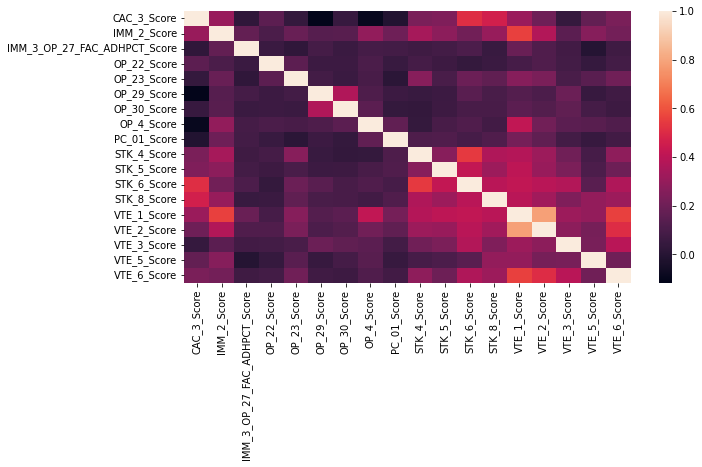

In [186]:
plt.figure(figsize = (10,5))
ax = sns.heatmap(eff_cor)
plt.show()

In [187]:
# Using FactorAnalyzer from the factor_analyzer package to find the loadings
eff_fact = FactorAnalyzer(rotation="promax" , method="ml" , n_factors=1 )
eff_fact.fit(eff)

FactorAnalyzer(method='ml', n_factors=1, rotation_kwargs={})

In [188]:
eff_loadings = eff_fact.loadings_
print (eff_fact.loadings_)

[[0.11675194]
 [0.32565735]
 [0.15437459]
 [0.23995877]
 [0.17062165]
 [0.21509673]
 [0.22711054]
 [0.16787591]
 [0.19406394]
 [0.25427111]
 [0.36073325]
 [0.45135739]
 [0.45428246]
 [0.43786438]
 [0.54679612]
 [0.40925904]
 [0.32394547]
 [0.35934296]]


In [189]:
# Round of the value to two-digits
eff_loadings = np.round(eff_loadings , 2)
print (eff_loadings)

[[0.12]
 [0.33]
 [0.15]
 [0.24]
 [0.17]
 [0.22]
 [0.23]
 [0.17]
 [0.19]
 [0.25]
 [0.36]
 [0.45]
 [0.45]
 [0.44]
 [0.55]
 [0.41]
 [0.32]
 [0.36]]


In [190]:
# Convert value in dataframe
eff_loadings = pd.DataFrame(eff_loadings)

In [191]:
# compare with correlations of same variable
eff_cor = effectiveness_cor
eff_cor = eff_cor.mean().round(2)
eff_loadings.index  = eff_cor.index
eff_cor = pd.concat([eff_cor, eff_loadings] ,axis = 1)
eff_cor.columns = ["avg_correlation", "factor loading"]
print(eff_cor)

                              avg_correlation  factor loading
CAC_3_Score                              0.21            0.12
IMM_2_Score                              0.29            0.33
IMM_3_OP_27_FAC_ADHPCT_Score             0.13            0.15
OP_22_Score                              0.13            0.24
OP_23_Score                              0.18            0.17
OP_29_Score                              0.15            0.22
OP_30_Score                              0.15            0.23
OP_4_Score                               0.18            0.17
PC_01_Score                              0.15            0.19
STK_4_Score                              0.26            0.25
STK_5_Score                              0.24            0.36
STK_6_Score                              0.31            0.45
STK_8_Score                              0.28            0.45
VTE_1_Score                              0.38            0.44
VTE_2_Score                              0.32            0.55
VTE_3_Sc

STK -5, STK-6, SKT-8 and VTE -1, VTE -2, VTE- 3, and VTE-6 has higher score loading comparatively based on factor loading number.

In [192]:
# Factorial list of weight
eff_weights = eff_fact.get_communalities()
print (eff_weights)

[0.01363102 0.10605271 0.02383151 0.05758021 0.02911175 0.0462666
 0.0515792  0.02818232 0.03766081 0.0646538  0.13012848 0.20372349
 0.20637255 0.19172521 0.298986   0.16749296 0.10494067 0.12912736]


In [193]:
print(sum(eff_weights))

1.8910466577118854


The sum of the weight is more than 1. Hence, we will normalize the weight by dividing each weight by the sum of the weights.

In [194]:
eff_weights = eff_weights/sum(eff_weights)
print(sum(eff_weights))

1.0000000000000002


In [195]:
# Create dataframe and merge data eff_cor and eff_weights
eff_weights = pd.DataFrame(eff_weights).round(3)
eff_weights.index = eff_cor.index
eff_cor = pd.concat([eff_cor, eff_weights] , axis = 1)
eff_cor.columns =  ["avg_correlation", "factor loading","weights"]
eff_cor

,avg_correlation,factor loading,weights
CAC_3_Score,0.21,0.12,0.007
IMM_2_Score,0.29,0.33,0.056
IMM_3_OP_27_FAC_ADHPCT_Score,0.13,0.15,0.013
OP_22_Score,0.13,0.24,0.030
OP_23_Score,0.18,0.17,0.015
OP_29_Score,0.15,0.22,0.024
OP_30_Score,0.15,0.23,0.027
OP_4_Score,0.18,0.17,0.015
PC_01_Score,0.15,0.19,0.020
STK_4_Score,0.26,0.25,0.034


Observations

1. Weights are approximately proportional to factor loading
2. Using weights, we will calculate the group score for each hospital's effectiveness correlation

Calculating group scores for each hospital ACC to CMS, hospital needs to have at least three measures per group; we will look into the hospitals which do not meet these criteria, finding rows with less than three measures

In [196]:
eff["invalid"] = False

for i in range(0,eff.shape[0]):
    if (sum(eff.iloc[i,:].isna())) > 3:
        eff.loc[i,"invalid"] = True

In [197]:
print('\n')
print("Percentage of hospitals are valid to get effectiveness score    :", sum(eff["invalid"])/eff.shape[0]*100);Line_Separator1()
print("Percentage of hospitals are not valid to get effectiveness score:", 100-sum(eff["invalid"])/eff.shape[0]*100);Line_Separator1()



Percentage of hospitals are valid to get effectiveness score    : 45.404157043879906
**************************************************************************************************** 

Percentage of hospitals are not valid to get effectiveness score: 54.595842956120094
**************************************************************************************************** 



In [198]:
valid_indicator = eff["invalid"]==True
print(valid_indicator)

0       True
43      True
86      True
129     True
172     True
        ... 
4812    True
4813    True
4814    True
4815    True
4817    True
Name: invalid, Length: 8660, dtype: bool


In [199]:
# Drop invalid and need to take care of missing values replacing them with the median value
eff = eff[valid_indicator ]
print (sum(eff["invalid"]))
eff = eff.drop("invalid" , axis=1)

3932


In [200]:
# Replacing missing value with median value to calculate the score
eff  = eff.fillna(eff.median())

In [201]:
# Calculate group scores

eff_weights
n = eff.shape[1]
eff["score"] = 0

for i in range(0,eff.shape[0]):
    eff.loc[i, "score"] = round(sum(np.array(eff.iloc[i,:-1])*np.array(eff_weights).reshape(18))/len(eff_weights),3)
    

effectiveness = effectiveness[valid_indicator]
effectiveness["score"] = eff["score"]
effectiveness_scores = effectiveness[["Provider ID", "score"]]
effectiveness_scores.columns = ["Provider ID", "eff_score"]
print (effectiveness_scores.head())

     Provider ID  eff_score
0          10001      0.002
43         10005     -0.027
86         10006     -0.037
129        10007      0.017
172        10008      0.017


We will follow the same calculation for each variable (mortality, readmission, effectiveness, timeliness, medical, safety, and experience) using the same made.

In [202]:
def factorial_group_scores(main , measures_cor):
    
  # Code for removing row numbers and ID 
    measures = main.iloc[:,1:]
    print(measures.head(2))
    print('\n')
    print(measures.isna().sum(axis=0))
    print('\n')
    
    
  # Using Factorial Analysis
    measures_fact = FactorAnalyzer(rotation="promax" , method="ml" , n_factors=1 )
    measures_fact.fit(measures)
    measures_loadings = measures_fact.loadings_
    print(measures_loadings)
    print('\n')
    
    
    measures_loads = measures_loadings #np.round(measures_loadings , 2)
    measures_loads = pd.DataFrame(measures_loads)
    measures_cor = measures_cor.mean() #.round(2)
    
    
    measures_loads.index  = measures_cor.index
    measures_cor = pd.concat([measures_cor, measures_loads] ,axis = 1)
    measures_cor.columns = ["avg_correlation", "factor loading"]
    print(measures_cor)    # comparing with correlations
    print('\n')
    
   # Factorial weights
    measures_weights = measures_fact.get_communalities()
    print(measures_weights)
    print('\n')
    print('Sum of the weight:', sum(measures_weights))
    print('\n')
    
    
   # Normalize the factorial weights to near 1 by dividing the sum wights 
    measures_weights = measures_weights/sum(measures_weights)
    print('Normalized sum of the weight:', sum(measures_weights))
    print('\n')
    
   # Convert to dataframe, indexing and merging
    measures_weights = pd.DataFrame(measures_weights) #.round(3)
    measures_weights.index = measures_cor.index
    measures_cor = pd.concat([measures_cor, measures_weights] , axis = 1)
    measures_cor.columns =  ["avg_correlation", "factor loading","weights"]
    
    # Row findings with three measures 
    measures["invalid"] = False

    for i in range(0,measures.shape[0]):
        if (sum(measures.iloc[i,:].isna())) > 3:
            measures.loc[i,"invalid"] = True
    print('valid:', sum(measures["invalid"])/measures.shape[0]*100)
    print('Not valid:', 100-sum(measures["invalid"])/measures.shape[0]*100)

    
    valid_indicator =  measures["invalid"]==True
   
    measures = measures[valid_indicator]
    print(sum(measures["invalid"]))
    measures = measures.drop("invalid" , axis=1)
    
    # Replace missing value with median 
    measures  = measures.fillna(measures.median())
    
    # Calculating group scores
    print(measures_weights)
    n = measures.shape[1]
    measures["score"] = 0
    
    for i in range(0,measures.shape[0]):
        measures.loc[i, "score"] = sum(np.array(measures.iloc[i,:-1])*np.array(measures_weights).reshape(measures_weights.shape[0]))/len(measures_weights)

    main = main[valid_indicator]
    main["score"] = measures["score"]
    main_scores = main[["Provider ID", "score"]]
    main_scores.columns = ["Provider ID", "eff_score"]
    group_scores = main_scores
    
    return (group_scores, measures_cor)

**1. Mortality Score** - Factorial Analysis

In [203]:
main = mortality_clean
measures_cor = mortality_cor

# Factorial analysis- mortality scores
mortality_scores = factorial_group_scores(main, measures_cor)

   MORT_30_AMI_score  MORT_30_CABG_score  MORT_30_COPD_score  \
0           1.249254           -0.995579           -1.093980   
1          -1.545741                 NaN            0.433948   

   MORT_30_HF_score  MORT_30_PN_score  MORT_30_STK_score  \
0         -0.165533          0.427653          -0.282009   
1         -2.286130         -2.103406          -0.342103   

   PSI_4_SURG_COMP_Score  
0              -1.711558  
1              -2.297783  


MORT_30_AMI_score        2430
MORT_30_CABG_score       3780
MORT_30_COPD_score       1227
MORT_30_HF_score         1200
MORT_30_PN_score          730
MORT_30_STK_score        2142
PSI_4_SURG_COMP_Score    3000
dtype: int64


[[-0.44715379]
 [-0.23437527]
 [-0.55076899]
 [-0.63232243]
 [-0.58161166]
 [-0.47241804]
 [-0.21227006]]


                       avg_correlation  factor loading
MORT_30_AMI_score             0.377143       -0.447154
MORT_30_CABG_score            0.317143       -0.234375
MORT_30_COPD_score            0.361429       

In [204]:
mortality_scores[0].columns = ["Provider ID", "mort_score"]
mortality_scores[0].head()

,Provider ID,mort_score
4,10008,0.101598
8,10018,-0.019844
11,10022,-0.023531
15,10032,0.002282
23,10044,0.011132


In [205]:
# Extracting mortality as mortality_important
mortality_importance = mortality_scores[1]
mortality_scores[1].head(2)

,avg_correlation,factor loading,weights
MORT_30_AMI_score,0.377143,-0.447154,0.127797
MORT_30_CABG_score,0.317143,-0.234375,0.035110


**2. Readmission Score** - Factorial Analysis

In [206]:
main = readmission_clean
measures_cor = readmission_cor

# Factorial analysis- readmission scores
readmission_scores = factorial_group_scores(main, measures_cor)

   READM_30_AMI_score  READM_30_CABG_score  READM_30_COPD_score  \
0            0.408636            -0.614857            -0.866788   
1            0.199928                  NaN             1.574335   

   READM_30_HF_score  READM_30_HIP_KNEE_score  READM_30_HOSP_WIDE_score  \
0           0.370373                -0.884008                  0.215383   
1           0.036448                -1.968080                  0.820556   

   READM_30_PN_score  READM_30_STK_score  
0          -1.105347           -0.124545  
1           0.495580           -0.776969  


READM_30_AMI_score          2655
READM_30_CABG_score         3791
READM_30_COPD_score         1170
READM_30_HF_score           1168
READM_30_HIP_KNEE_score     2087
READM_30_HOSP_WIDE_score     423
READM_30_PN_score            729
READM_30_STK_score          2210
dtype: int64


[[-0.48839463]
 [-0.21806143]
 [-0.55714987]
 [-0.65800322]
 [-0.28897702]
 [-0.84383176]
 [-0.65872148]
 [-0.50804532]]


                          avg_correlati

In [207]:
readmission_scores[0].columns = ["Provider ID", "readm_score"]
readmission_scores[0].head()

,Provider ID,readm_score
4,10008,0.099509
8,10018,0.012326
11,10022,-0.043646
15,10032,0.041044
23,10044,0.027325


In [208]:
readmission_importance = readmission_scores[1]
readmission_scores[1].head(2)

,avg_correlation,factor loading,weights
READM_30_AMI_score,0.42625,-0.488395,0.094765
READM_30_CABG_score,0.30750,-0.218061,0.018891


**3 Effectiveness Score** - Factorial Analysis

In [209]:
main = effectiveness_clean
measures_cor = effectiveness_cor

# Factorial analysis-  effectiveness scores
eff_scores = factorial_group_scores(main, measures_cor)

    CAC_3_Score  IMM_2_Score  IMM_3_OP_27_FAC_ADHPCT_Score  OP_22_Score  \
0           NaN     0.363809                     -0.233089    -1.201289   
43          NaN     0.530202                     -0.099014    -0.108298   

    OP_23_Score  OP_29_Score  OP_30_Score  OP_4_Score  PC_01_Score  \
0           NaN          NaN     0.071061         NaN     0.538773   
43     0.783148     0.692044     0.500206    0.545747     0.323979   

    STK_4_Score  STK_5_Score  STK_6_Score  STK_8_Score  VTE_1_Score  \
0     -1.227553    -0.024898     0.445919    -0.569954     0.333795   
43          NaN     0.193243    -0.915350     0.618204     0.178318   

    VTE_2_Score  VTE_3_Score  VTE_5_Score  VTE_6_Score  
0      0.381111    -0.277674    -0.253613     0.416166  
43    -0.450285     0.819390     0.635187          NaN  


CAC_3_Score                     4643
IMM_2_Score                     1034
IMM_3_OP_27_FAC_ADHPCT_Score     711
OP_22_Score                     1543
OP_23_Score                 

In [210]:
eff_scores[0].columns = ["Provider ID","eff_score"]
eff_scores[0].head()

,Provider ID,eff_score
0,10001,0.002137
43,10005,-0.027423
86,10006,-0.037181
129,10007,0.016858
172,10008,0.016858


In [211]:
effectiveness_importance= eff_scores[1]
eff_scores[1].head(2)

,avg_correlation,factor loading,weights
CAC_3_Score,0.208333,0.116752,0.007208
IMM_2_Score,0.289444,0.325657,0.056081


**4. Timeliness Score** - Factorial Analysis

In [212]:
main = timeliness_clean
measures_cor = timeliness_cor

# factorial analysis = timeliness scores
timeliness_scores = factorial_group_scores(main, measures_cor)

   ED_1b_Score  ED_2b_Score  OP_18b_Score  OP_20_Score  OP_21_Score  \
0     0.089247     0.508286     -1.265605    -2.413565    -2.586986   
1     0.341500     0.462769      0.615752    -0.048967    -0.379753   

   OP_3b_Score  OP_5_Score  
0          NaN         NaN  
1          NaN   -0.714375  


ED_1b_Score     1222
ED_2b_Score     1238
OP_18b_Score    1234
OP_20_Score     1223
OP_21_Score     1505
OP_3b_Score     4425
OP_5_Score      2574
dtype: int64


[[0.9832316 ]
 [0.89875492]
 [0.64008056]
 [0.42934445]
 [0.3863284 ]
 [0.04513644]
 [0.11088687]]


              avg_correlation  factor loading
ED_1b_Score          0.552857        0.983232
ED_2b_Score          0.477143        0.898755
OP_18b_Score         0.511429        0.640081
OP_20_Score          0.465714        0.429344
OP_21_Score          0.454286        0.386328
OP_3b_Score          0.280000        0.045136
OP_5_Score           0.307143        0.110887


[0.96674438 0.80776041 0.40970312 0.18433666 0.14924963 0.002037

In [213]:
timeliness_scores[0].columns = ["Provider ID","timeliness_score"]
timeliness_scores[0].head(2)

,Provider ID,timeliness_score
8,10018.0,0.094052
84,11302.0,0.094052


In [214]:
timeliness_importance = timeliness_scores[1]
timeliness_scores[1].head(2)

,avg_correlation,factor loading,weights
ED_1b_Score,0.552857,0.983232,0.381791
ED_2b_Score,0.477143,0.898755,0.319005


**5. Medical Score** - Factorial Analysis

In [215]:
# medical -  import the file - data cleaned and correlation 
main = medical 
measures_cor = medical_cor

# Factorial analysis of medical scores
medical_scores = factorial_group_scores(main, measures_cor)

   OP_10_Score  OP_11_Score  OP_13_Score  OP_14_Score  OP_8_Score
0     0.250738     0.388644    -1.199985     0.207497    0.299604
6    -0.423442    -1.203647    -0.305172    -0.648977   -0.378309


OP_10_Score    1189
OP_11_Score    1469
OP_13_Score    2585
OP_14_Score    2514
OP_8_Score     3294
dtype: int64


[[-0.67154816]
 [-0.62484337]
 [ 0.02452735]
 [ 0.01384185]
 [-0.07683605]]


             avg_correlation  factor loading
OP_10_Score            0.296       -0.671548
OP_11_Score            0.292       -0.624843
OP_13_Score            0.190        0.024527
OP_14_Score            0.216        0.013842
OP_8_Score             0.246       -0.076836


[4.50976933e-01 3.90429234e-01 6.01590831e-04 1.91596840e-04
 5.90377831e-03]


Sum of the weight: 0.8481031330208947


Normalized sum of the weight: 0.9999999999999999


valid: 23.22742474916388
Not valid: 76.77257525083613
1389
                    0
OP_10_Score  0.531748
OP_11_Score  0.460356
OP_13_Score  0.000709
OP_14_Score  0.00

In [216]:
medical_scores[0].columns = ["Provider ID","medical_score"]
medical_scores[0].head(2)

,Provider ID,medical_score
54,10019,0.071608
84,10029,0.073095


In [217]:
medical_importance = medical_scores[1]
medical_scores[1].head(2)

,avg_correlation,factor loading,weights
OP_10_Score,0.296,-0.671548,0.531748
OP_11_Score,0.292,-0.624843,0.460356


**6. Experience Score** - Factorial Analysis

In [218]:
main = experience_clean
measures_cor = experience_cor

# Factorial analysis of experience scores

exp_scores = factorial_group_scores(main, measures_cor)

   H_CLEAN_LINEAR_SCORE_mean  H_COMP_1_LINEAR_SCORE_mean  \
0                  -0.852686                   -0.523545   
1                  -1.111599                   -0.129172   

   H_COMP_2_LINEAR_SCORE_mean  H_COMP_3_LINEAR_SCORE_mean  \
0                    0.041177                   -1.199873   
1                    0.859592                   -0.290031   

   H_COMP_4_LINEAR_SCORE_mean  H_COMP_5_LINEAR_SCORE_mean  \
0                   -0.606383                   -0.415225   
1                    0.166720                    0.284507   

   H_COMP_6_LINEAR_SCORE_mean  H_COMP_7_LINEAR_SCORE_mean  \
0                    0.027637                    0.164883   
1                    0.308654                   -0.183346   

   H_HSP_RATING_LINEAR_SCORE_mean  H_QUIET_LINEAR_SCORE_mean  \
0                        0.084187                   0.968547   
1                        0.391502                   0.577224   

   H_RECMND_LINEAR_SCORE_mean  
0                    0.450029  
1         

In [219]:
exp_scores[0].columns = ["Provider ID","exp_score"]
exp_scores[0].head(2)

,Provider ID,exp_score
4,10008,NaN
8,10018,NaN


In [220]:
experience_importance= exp_scores[1]
exp_scores[1].head(2)

,avg_correlation,factor loading,weights
H_CLEAN_LINEAR_SCORE_mean,0.644545,0.722291,0.068513
H_COMP_1_LINEAR_SCORE_mean,0.789091,0.936329,0.115135


**7. Safety Score** - Factorial Analysis

In [221]:
main = safety_clean
measures_cor = safety_cor

# Factorial analysis - Safety Score
safety_scores = factorial_group_scores(main, measures_cor)

   HAI_1_SIR  HAI_2_SIR  HAI_3_SIR  HAI_4_SIR  HAI_5_SIR  HAI_6_SIR  \
0  -2.351227  -2.087871  -1.134824   1.017667   0.646805   0.056641   
1  -1.023000   0.050027   0.722932        NaN  -0.456856   0.798422   

   COMP_HIP_KNEE_Score  PSI_90_SAFETY_Score  
0            -1.354968             1.210759  
1             0.074460             0.230418  


HAI_1_SIR              2443
HAI_2_SIR              1929
HAI_3_SIR              2775
HAI_4_SIR              3962
HAI_5_SIR              2988
HAI_6_SIR              1546
COMP_HIP_KNEE_Score    2104
PSI_90_SAFETY_Score    1594
dtype: int64


[[-0.40987168]
 [-0.56769435]
 [-0.31770259]
 [-0.1931484 ]
 [-0.25039966]
 [-0.17754991]
 [-0.0266587 ]
 [-0.21793208]]


                     avg_correlation  factor loading
HAI_1_SIR                    0.21375       -0.409872
HAI_2_SIR                    0.25125       -0.567694
HAI_3_SIR                    0.21125       -0.317703
HAI_4_SIR                    0.19000       -0.193148
HAI_5_SIR          

In [222]:
safety_scores[0].columns = ["Provider ID","safety_score"]
safety_scores[0].head(2)

,Provider ID,safety_score
3,10007.0,0.101738
4,10008.0,0.097686


In [223]:
safety_importance= safety_scores[1]
safety_scores[1].head(2)

,avg_correlation,factor loading,weights
HAI_1_SIR,0.21375,-0.409872,0.217908
HAI_2_SIR,0.25125,-0.567694,0.418030


In [224]:
# Final data obtained through factorial analysis
all_groups_importance = pd.concat([eff_scores[1], exp_scores[1], mortality_scores[1],
                              medical_scores[1], readmission_scores[1], 
                              timeliness_scores[1], safety_scores[1]])
all_groups_importance.head(2)

,avg_correlation,factor loading,weights
CAC_3_Score,0.208333,0.116752,0.007208
IMM_2_Score,0.289444,0.325657,0.056081


In [225]:
# Merging all group files

medical_scores = medical_scores[0]
mortality_scores = mortality_scores[0]
readmission_scores = readmission_scores[0]
timeliness_scores = timeliness_scores[0]
safety_scores = safety_scores[0]
eff_scores = eff_scores[0]
exp_scores = exp_scores[0]

mast1 = medical_scores.merge(mortality_scores,left_on="Provider ID",right_on="Provider ID",how="outer")
mast2 = mast1.merge(safety_scores,left_on="Provider ID",right_on="Provider ID",how="outer")
mast3 = mast2.merge(eff_scores,left_on="Provider ID",right_on="Provider ID",how="outer")
mast4 = mast3.merge(exp_scores,left_on="Provider ID",right_on="Provider ID",how="outer")
mast5 = mast4.merge(readmission_scores,left_on="Provider ID",right_on="Provider ID",how="outer")
group_scores = mast5.merge(timeliness_scores,left_on="Provider ID",right_on="Provider ID",how="outer")

In [226]:
# identify missing value
round(100*(group_scores.isnull()).sum()/len(group_scores), 2).sort_values(ascending=False)

eff_score           96.82
medical_score       91.98
exp_score           62.96
timeliness_score    50.04
readm_score         32.59
mort_score          27.61
safety_score        11.44
Provider ID          0.00
dtype: float64

Since we observed that specific group scores are missing, we will proportion using the weightage of the other group. The specific group scores are missing. The weightage of the other groups needs to be reproportioned. The score for : medical = 0.04, mortality = 0.22, safety = 0.22, effectiveness = 0.04, experience = 0.22, readmission = 0.22, and timeliness = 0.04. Thus, the reproportioned weights will be  mortality = 0.22/0.52, effectivenss = 0.04/0.52, readmission = 0.22/0.52, and  timeliness = 0.04/0.52 

In [227]:
group_scores["final_score"] = 100
  
which = lambda lst:np.where(lst)[0]


for i in range(group_scores.shape[0]):
    weights = np.array([0.04,0.22,0.22,0.04,0.22,0.22,0.04])
    if (sum(group_scores.iloc[i, :].isna()) > 0):
        invalid_indices = which(group_scores.iloc[i,: ].isna())-1 
        tem = np.delete(weights, invalid_indices)
        s = sum(tem)
        reproportioned_weights = tem/s
        group_scores.loc[i,"final_score"] = sum(np.delete(np.array(group_scores.iloc[i, 1:8]),invalid_indices)*reproportioned_weights)

    else:
        
        group_scores.loc[i,"final_score"] = sum(group_scores.iloc[i, 1:8]*weights)

In [228]:
final_scores = group_scores[["Provider ID","final_score"]] 
print(final_scores["final_score"].value_counts())

0.000000    1402
0.101738      88
0.024329      51
0.016858      20
0.033913      19
            ... 
0.060304       1
0.050363       1
0.023735       1
0.057185       1
0.094052       1
Name: final_score, Length: 1100, dtype: int64


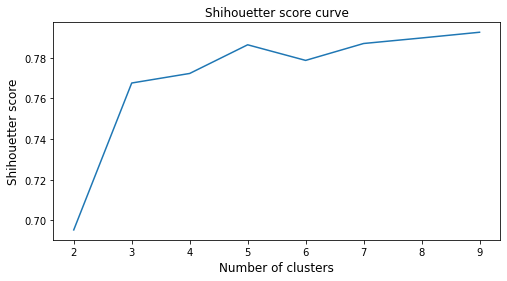

In [229]:
# Sihouette score
sse = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k).fit(final_scores[["final_score"]])
    sse.append([k, silhouette_score(final_scores[["final_score"]], kmeans.labels_)])

fig = plt.figure(figsize = (8,4))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1])
plt.title('Shihouetter score curve', fontsize=12)
plt.ylabel('Shihouetter score', fontsize=12);plt.xlabel('Number of clusters',fontsize=12)
plt.show()

In [230]:
# Silhouette analysis

range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(final_scores[["final_score"]])
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(final_scores[["final_score"]], cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.6952815699855772
For n_clusters=3, the silhouette score is 0.7676258930884886
For n_clusters=4, the silhouette score is 0.7723322928127669
For n_clusters=5, the silhouette score is 0.7864694584048291
For n_clusters=6, the silhouette score is 0.7787626388292954
For n_clusters=7, the silhouette score is 0.7854539464324988
For n_clusters=8, the silhouette score is 0.7899075220440294


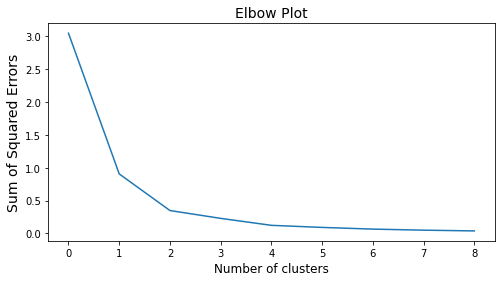

In [231]:
# Elbow-curve/SSD
# SSD = Sum of Square distance of samples to thier closest center
ssd = []
for num_clusters in list(range(1,10)):
    model_clus = KMeans(n_clusters = num_clusters, max_iter=50)
    model_clus.fit(final_scores[["final_score"]])
    ssd.append(model_clus.inertia_)

fig = plt.figure(figsize = (8,4))
plt.plot(ssd)
plt.title('Elbow Plot', fontsize=14)
plt.ylabel('Sum of Squared Errors', fontsize=14);plt.xlabel('Number of clusters',fontsize=12)
plt.show()

1. Elbow curve the distinct bend observed at around n_clusters = 2 (0,1,2). Thus we will select three as the number of cutlers for further analysis. 

2. We will first consider five for factorial, random since hospital ranking is 1 to 5 star. 

3. We will use one of the models for three clusterings. 

4. Based on domain knowledge, we will classify as 1,2, should be low; three should be average, and 4 & 5 should be good.

In [232]:
# Kmean clusterings

score_cluster = KMeans( 5, n_init = 100)
score_cluster.fit(final_scores[["final_score"]])

print(score_cluster.labels_)
final_scores["cluster_id"] = score_cluster.labels_

[1 1 2 ... 0 0 0]


In [233]:
g = final_scores.groupby("cluster_id", as_index = False).agg({"final_score":"mean"}).sort_values("final_score" , ascending=False)
g.columns =[ "cluster_id" , "avg_score"]
print (g)

   cluster_id  avg_score
2           2   0.097879
1           1   0.052343
4           4   0.027805
0           0  -0.000249
3           3  -0.090931


In [234]:
for i in range(final_scores.shape[0]):
  
    id = final_scores.loc[i,"cluster_id"]
    final_scores.loc[i,"newcluster_id"] = 4 - which(g["cluster_id"] == id) + 1

In [235]:
final_scores.groupby("newcluster_id" , as_index = False).agg({"final_score":"mean"}).sort_values("final_score")

,newcluster_id,final_score
0,1.0,-0.090931
1,2.0,-0.000249
2,3.0,0.027805
3,4.0,0.052343
4,5.0,0.097879


In [236]:
final_scores_plot = final_scores
final_scores_plot["final_score"] = final_scores["final_score"]*100
final_scores_plot["newcluster_id"] = final_scores["newcluster_id"]

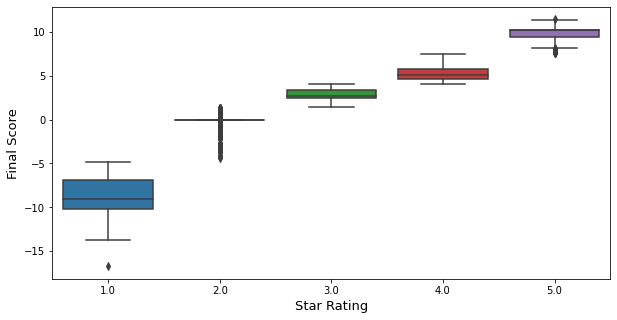

In [237]:
plot_vgl = sns.boxplot(x = "newcluster_id" ,  y = "final_score" , data = final_scores_plot)
plot_vgl.set_ylabel("Final Score", size=13)
plot_vgl.set_xlabel("Star Rating", size=13)
plt.show()

The graph indicates that the final score moves towards positive from negative as the star ratings move from 1 to 5.

In [238]:
group_scores = group_scores.merge(final_scores, left_on="Provider ID",right_on="Provider ID")
group_scores_plot = group_scores
group_scores_plot[["medical_score","mort_score","safety_score","eff_score","exp_score",
                   "readm_score","timeliness_score","final_score_x","final_score_y"]] = group_scores_plot[["medical_score","mort_score","safety_score","eff_score","exp_score","readm_score","timeliness_score","final_score_x","final_score_y"]]*100

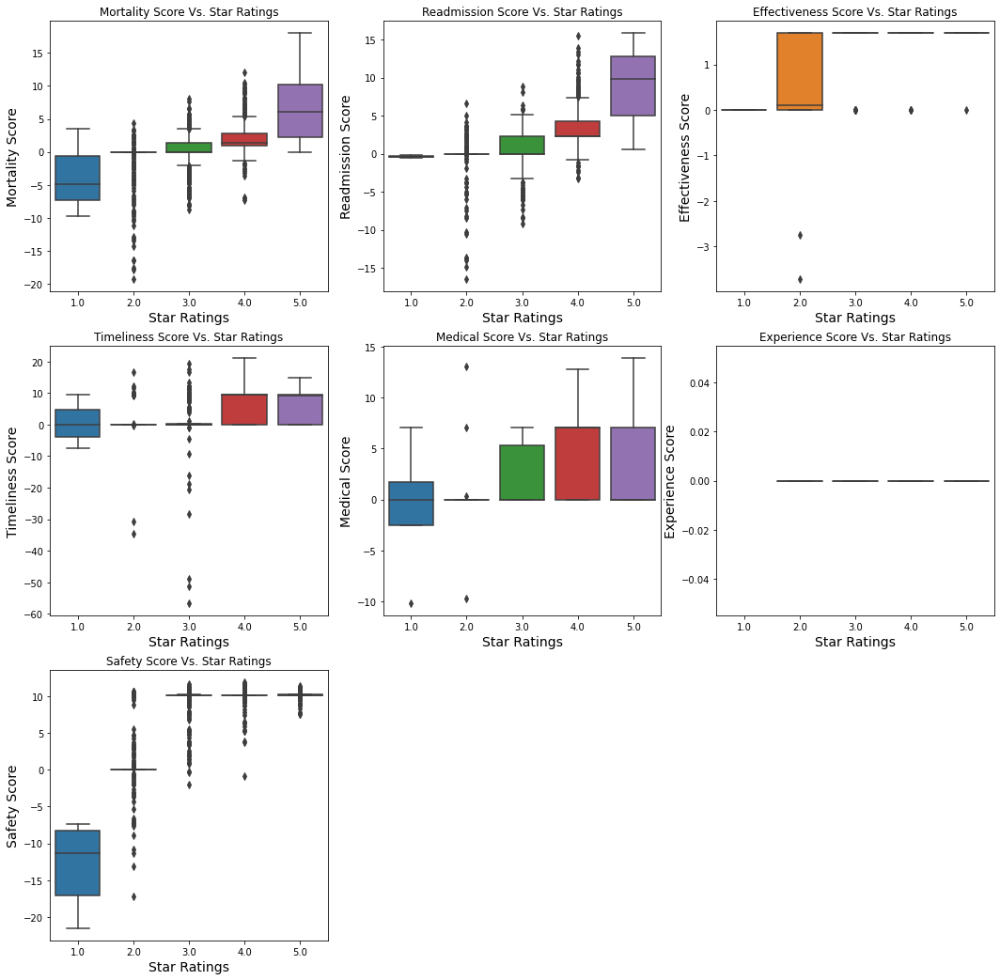

In [239]:
# Mortality
def plot_mort():
    plot_mor = sns.boxplot(x = "newcluster_id" ,  y = "mort_score" , data = group_scores_plot)
    plot_mor.set_ylabel("Mortality Score",size = 14)
    plot_mor.set_xlabel("Star Ratings",size = 14)
    plot_mor.set(title="Mortality Score Vs. Star Ratings")

# Readmission
def plot_read():
    plot_read = sns.boxplot(x = "newcluster_id" ,  y = "readm_score" , data = group_scores_plot)
    plot_read.set_ylabel("Readmission Score",size = 14)
    plot_read.set_xlabel("Star Ratings",size = 14)
    plot_read.set(title="Readmission Score Vs. Star Ratings")

# Effectiveness
def plot_eff():
    plot_eff = sns.boxplot(x = "newcluster_id" ,  y = "eff_score" , data = group_scores_plot)
    plot_eff.set_ylabel("Effectiveness Score",size = 14)
    plot_eff.set_xlabel("Star Ratings",size = 14)
    plot_eff.set(title="Effectiveness Score Vs. Star Ratings")

# Timeliness
def plot_timel():
    plot_t = sns.boxplot(x = "newcluster_id" ,  y = "timeliness_score" , data = group_scores_plot)
    plot_t.set_ylabel("Timeliness Score",size = 14)
    plot_t.set_xlabel("Star Ratings",size = 14)
    plot_t.set(title="Timeliness Score Vs. Star Ratings")
    
# Medical
def plot_med():
    plot_med = sns.boxplot(x = "newcluster_id" ,  y = "medical_score" , data = group_scores_plot)
    plot_med.set_ylabel("Medical Score",size = 14)
    plot_med.set_xlabel("Star Ratings",size = 14)
    plot_med.set(title="Medical Score Vs. Star Ratings")
    
# Experience
def plot_exp():
    plot_exp = sns.boxplot(x = "newcluster_id" ,  y = "exp_score" , data = group_scores_plot)
    plot_exp.set_ylabel("Experience Score",size = 14)
    plot_exp.set_xlabel("Star Ratings",size = 14)
    plot_exp.set(title="Experience Score Vs. Star Ratings")

# Safety
def plot_saft():
    plot_saft = sns.boxplot(x = "newcluster_id" ,  y = "safety_score" , data = group_scores_plot)
    plot_saft.set_ylabel("Safety Score",size = 14)
    plot_saft.set_xlabel("Star Ratings",size = 14)
    plot_saft.set(title="Safety Score Vs. Star Ratings")

fig = plt.figure(figsize=(18,18))
ax1 = fig.add_subplot(3,3,1)
ax1 = plot_mort()
ax2 = fig.add_subplot(3,3,2)
ax2 = plot_read()
ax3 = fig.add_subplot(3,3,3)
ax3 = plot_eff()
ax4 = fig.add_subplot(3,3,4)
ax4 = plot_timel()
ax5 = fig.add_subplot(3,3,5)
ax5 = plot_med()
ax6 = fig.add_subplot(3,3,6)
ax6 = plot_exp()
ax7 = fig.add_subplot(3,3,7)
ax7 = plot_saft()

plt.show()

In [240]:
#  Comparing different groups median ratings against star ratings
median_scores = group_scores.groupby("newcluster_id" , as_index =False).median()[["newcluster_id" ,"readm_score","safety_score","exp_score","mort_score","eff_score","timeliness_score","medical_score"]]
    
# Save data as median group scores
median_group_scores = median_scores

# median_scores data review
median_scores.head(2)

,newcluster_id,readm_score,safety_score,exp_score,mort_score,eff_score,timeliness_score,medical_score
0,1.0,-0.376419,-11.378658,NaN,-4.909267,0.000000,0.0,0.0
1,2.0,0.000000,0.000000,0.0,0.000000,0.106828,0.0,0.0


In [241]:
# Star_rating_validation

rating_file = pd.read_csv("../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Hospital General Information.csv" , encoding="ISO--8859-1")
ratings = rating_file[rating_file.columns[[0, 12]]]
ratings["Hospital overall rating"] = le().fit_transform(ratings["Hospital overall rating"])

# Merging final score with hospital overall ratings
final_scores = final_scores.merge( ratings,  left_on="Provider ID",right_on="Provider ID", how="outer")
final_scores["newcluster_id"] =final_scores["newcluster_id"].astype("str")
final_scores["newcluster_id"][which(final_scores["newcluster_id"].isna())] = "Not Available"
final_scores["newcluster_id"] = le().fit_transform(final_scores["newcluster_id"])
print (final_scores["newcluster_id"].value_counts())

5    1986
1    1549
2     546
3     454
4     270
0      13
Name: newcluster_id, dtype: int64


In [242]:
# Confusion Matrix 
print(confusion_matrix(final_scores["newcluster_id"],final_scores["Hospital overall rating"]))

[[  0   3   7   2   0   1]
 [ 13 122 479 253  38 644]
 [  1  21 138  52   6 328]
 [  1  30 138  87  12 186]
 [  2  29 143  81   4  11]
 [100 479 867 489  51   0]]


**Step 4: Provider_analysis**

In [243]:
# Evaluate the data shape
print(group_scores.shape)

(2832, 12)


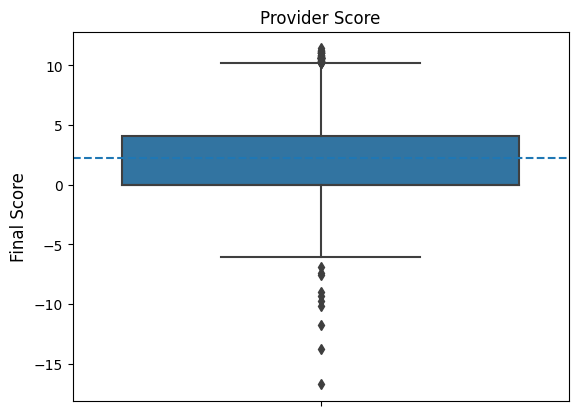

In [244]:
plt.style.use('default')
plot_box = sns.boxplot( y = "final_score_x" , data = group_scores)
plot_box.axes.axhline(2.252, ls='--')
plot_box.set_title("Provider Score", size=12)
plot_box.set_ylabel("Final Score", size= 12)
plt.show()

In [245]:
group_scores[group_scores["Provider ID"] == 10097]

,Provider ID,medical_score,mort_score,safety_score,eff_score,exp_score,readm_score,timeliness_score,final_score_x,final_score_y,cluster_id,newcluster_id
18,10097.0,7.042167,1.703197,10.085007,1.685826,NaN,6.231419,NaN,5.828968,582.896849,1,4.0


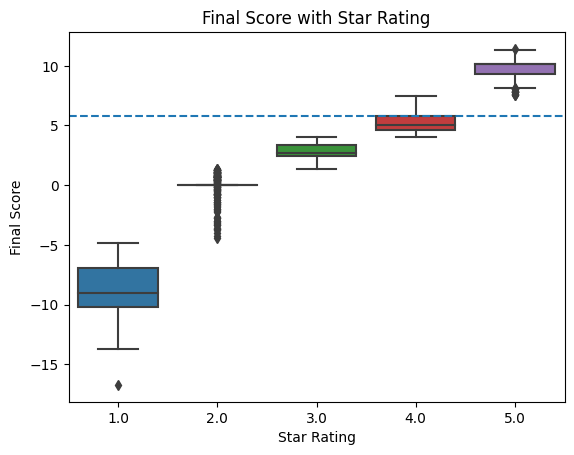

In [246]:
plt.style.use('default')
plot_box1 = sns.boxplot(x = "newcluster_id" ,  y = "final_score_x" , data = group_scores)
plot_box1.axes.axhline(5.828, ls='--')
plot_box1.set_title("Final Score with Star Rating")
plot_box1.set_ylabel("Final Score")
plot_box1.set_xlabel("Star Rating")
plt.show()

The final score was observed to be higher than the average score of ranking four but lower than rating five.

In [247]:
vg = group_scores.groupby("newcluster_id" , as_index =False).mean()[["newcluster_id" ,"final_score_x","mort_score","safety_score","eff_score","readm_score","timeliness_score","medical_score","exp_score"]]
vg

,newcluster_id,final_score_x,mort_score,safety_score,eff_score,readm_score,timeliness_score,medical_score,exp_score
0,1.0,-9.093118,-3.686100,-12.696501,0.000000,-0.376419,0.653857,-0.793125,NaN
1,2.0,-0.024902,-0.264499,0.210417,0.276298,-0.072355,0.249743,0.091604,0.0
2,3.0,2.780509,0.164900,9.710318,1.277141,0.524627,1.623112,1.920591,0.0
3,4.0,5.234294,2.016038,10.075030,1.436074,3.379538,7.089145,4.708801,0.0
4,5.0,9.787858,7.106558,10.178560,1.573437,8.945096,5.539982,3.098826,0.0


In [248]:
vg.reset_index()
vg.columns = ["rating", "avg_final", "avg_mort", "avg_safety", "avg_effectiveness","avg_readmission", "avg_timeliness", "avg_medical", "avg_experience"]
print(g)

   cluster_id  avg_score
2           2   0.097879
1           1   0.052343
4           4   0.027805
0           0  -0.000249
3           3  -0.090931


In [249]:
avg_scores_by_rating = vg

In [250]:
group_scores_plot = group_scores*100
group_scores_plot["newcluster_id"] = group_scores["newcluster_id"]

In [251]:
# mortality
def plot_mort1():
    plot_mort1 = sns.boxplot(x = "newcluster_id" ,  y = "mort_score" , data = group_scores_plot)
    plot_mort1.axes.axhline(1.703, ls='--')
    plot_mort1.set_ylabel("Mortality Score", size =14)
    plot_mort1.set_xlabel("Star Ratings")
    plot_mort1.set(title="Mortality Score Vs. Star Ratings")

# readmission
def plot_read1():
    plot_read1 = sns.boxplot(x = "newcluster_id" ,  y = "readm_score" , data = group_scores_plot)
    plot_read1.axes.axhline(6.231, ls='--')
    plot_read1.set_ylabel("Readmission Score", size =14)
    plot_read1.set_xlabel("Star Ratings")
    plot_read1.set(title="Readmission Score Vs. Star Ratings")

# effectiveness
def plot_eff1():
    plot_eff1 = sns.boxplot(x = "newcluster_id" ,  y = "eff_score" , data = group_scores_plot)
    plot_eff1.axes.axhline(1.685, ls='--')
    plot_eff1.set_ylabel("Effectiveness Score", size =14)
    plot_eff1.set_xlabel("Star Ratings")
    plot_eff1.set(title="Effectiveness Score Vs. Star Ratings")

# timeliness
def plot_timel1():
    plot_timel1 = sns.boxplot(x = "newcluster_id" ,  y = "timeliness_score" , data = group_scores_plot)
    plot_timel1.axes.axhline(0.0, ls='--')
    plot_timel1.set_ylabel("Timeliness Score", size =14)
    plot_timel1.set_xlabel("Star Ratings")
    plot_timel1.set(title="Timeliness Score Vs. Star Ratings")
    
# experience
def plot_exp1():
    plot_exp1 = sns.boxplot(x = "newcluster_id" ,  y = "exp_score" , data = group_scores_plot)
    plot_exp1.axes.axhline(0, ls='--')
    plot_exp1.set_ylabel("Experience Score", size =14)
    plot_exp1.set_xlabel("Star Ratings")
    plot_exp1.set(title="Experience Score Vs. Star Ratings")
    
# safety
def plot_safe1():
    plot_safe1 = sns.boxplot(x = "newcluster_id" ,  y = "safety_score" , data = group_scores_plot)
    plot_safe1.axes.axhline(10.085, ls='--')
    plot_safe1.set_ylabel("Safety Score", size =14)
    plot_safe1.set_xlabel("Star Ratings")
    plot_safe1.set(title="Safety Score Vs. Star Ratings")
    
# medical
def plot_med1():
    plot_med1 = sns.boxplot(x = "newcluster_id" ,  y = "medical_score" , data = group_scores_plot)
    plot_med1.axes.axhline(7.042, ls='--')
    plot_med1.set_ylabel("Medical Score", size =14)
    plot_med1.set_xlabel("Star Ratings")
    plot_med1.set(title="Medical Score Vs. Star Ratings")

group_scores["Provider ID"] == 10097:  On comparing the average scores of groups with the provider's score 



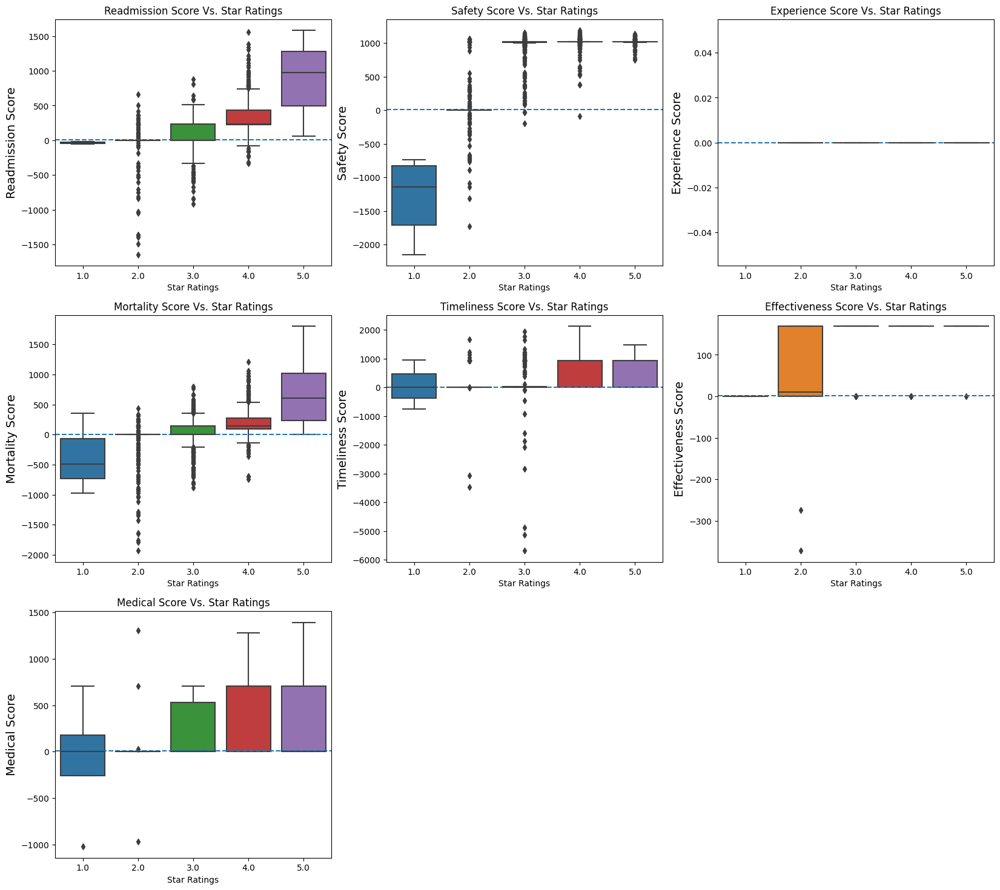

In [252]:
print('group_scores["Provider ID"] == 10097:  On comparing the average scores of groups with the provider\'s score \n')

plt.style.use('default')
fig = plt.figure(figsize=(20,18))
ax1 = fig.add_subplot(3,3,1)
ax1 = plot_read1()
ax2 = fig.add_subplot(3,3,2)
ax2 = plot_safe1()
ax3 = fig.add_subplot(3,3,3)
ax3 = plot_exp1()
ax4 = fig.add_subplot(3,3,4)
ax4 = plot_mort1()
ax5 = fig.add_subplot(3,3,5)
ax5 = plot_timel1()
ax6 = fig.add_subplot(3,3,6)
ax6 = plot_eff1()
ax7 = fig.add_subplot(3,3,7)
ax7 = plot_med1()

plt.show()

1. Mortality score found better than average of rating five
2. Safety score observed avg rating of two but lower than one and higher than three and four
3. Effective score observed better slightly with all variables
4. Readmissions score is between avg of ratings one and three
5. Timeliness score is better than average of five rating
6. The medical score is better than average of five rating
7. Experience score is between avg of ratings two and three

In [253]:
# Compare the provider's score with the overall averages
mean_scores = group_scores.iloc[:,1:9].mean()
print("Mean Score \n")
print(mean_scores);Line_Separator1()
print('Score provided by provider: \n')
print(group_scores[group_scores["Provider ID"] == 10097].iloc[:,1:9])

Mean Score 

medical_score       1.827084
mort_score          0.350443
safety_score        4.700841
eff_score           1.204326
exp_score           0.000000
readm_score         0.805224
timeliness_score    1.959049
final_score_x       2.252989
dtype: float64
**************************************************************************************************** 

Score provided by provider: 

    medical_score  mort_score  safety_score  eff_score  exp_score  \
18       7.042167    1.703197     10.085007   1.685826        NaN   

    readm_score  timeliness_score  final_score_x  
18     6.231419               NaN       5.828968  


The provider's one of the scores observed higher than the overall average score.

**1. Saftey**

In [254]:
# will further deep dive with the individual measure
# 1. Saftey 
safety_scores = safety_clean

# Safety scores of the provider
avg_safety = safety_scores[safety_scores["Provider ID"] == 10092].iloc[:,1:safety_scores.shape[1]]
avg_safety

,HAI_1_SIR,HAI_2_SIR,HAI_3_SIR,HAI_4_SIR,HAI_5_SIR,HAI_6_SIR,COMP_HIP_KNEE_Score,PSI_90_SAFETY_Score
48,-0.617479,0.122685,0.159596,0.404011,0.597677,0.291603,-0.640254,-0.057918


In [255]:
# Comparing with the average safety scores

provider_safety = safety_scores.iloc[:, 1:10].mean(axis=0)*100
pd.concat([avg_safety, pd.DataFrame([list(provider_safety)],columns=avg_safety.columns)])

,HAI_1_SIR,HAI_2_SIR,HAI_3_SIR,HAI_4_SIR,HAI_5_SIR,HAI_6_SIR,COMP_HIP_KNEE_Score,PSI_90_SAFETY_Score
48,-0.617479,0.122685,0.159596,0.404011,0.597677,0.291603,-0.640254,-0.057918
0,0.163982,0.512394,0.063827,0.025234,0.109216,0.105597,0.076139,0.094811


1. For comparison purposes, multiplied 0 rows to 100
2. HAI_3_SIR, HAI_4_SIR, HAI_5_SIR, HAI_6_SIR observed lower than the avg safety score while others are higher are doing well.

In [256]:
# Merging safety scores with hospital ratings
safety_scores = safety_scores.merge(final_scores, left_on="Provider ID",right_on="Provider ID")
safety_scores.drop(["Provider ID"],axis=1,inplace=True)

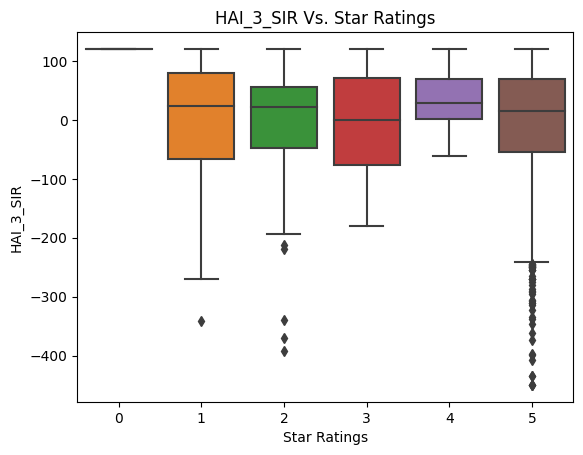

In [257]:
safety_scores_plot = safety_scores*100
safety_scores_plot["newcluster_id"] = safety_scores["newcluster_id"]

plt.style.use('default')
plot_hai4 = sns.boxplot(x="newcluster_id" , y="HAI_3_SIR" ,data= safety_scores_plot  )
plot_hai4.set_ylabel("HAI_3_SIR")
plot_hai4.set_xlabel("Star Ratings")
plot_hai4.set(title="HAI_3_SIR Vs. Star Ratings")
plt.show()

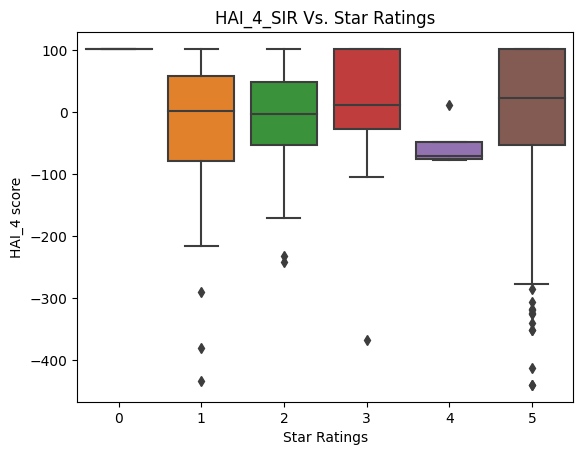

In [258]:
# Observation: HAI_4 score of the provider (0.00) is lower than the median scores for ratings 2, 3, 4, 5
plt.style.use('default')
plot_hai5 = sns.boxplot(x="newcluster_id" , y="HAI_4_SIR" ,data= safety_scores_plot  )
plot_hai5.set_ylabel("HAI_4 score")
plot_hai5.set_xlabel("Star Ratings")
plot_hai5.set(title="HAI_4_SIR Vs. Star Ratings")
plt.show()

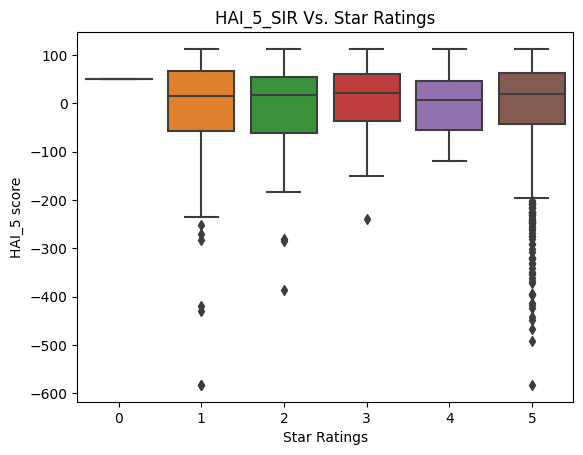

In [259]:
plt.style.use('default')
plot_hai5 = sns.boxplot(x="newcluster_id" , y="HAI_5_SIR" ,data= safety_scores_plot  )
plot_hai5.set_ylabel("HAI_5 score")
plot_hai5.set_xlabel("Star Ratings")
plot_hai5.set(title="HAI_5_SIR Vs. Star Ratings")
plt.show()

**2. Experience**

In [260]:
# 2. Experience
experience_scores = experience_clean

# Safety scores of the provider
avg_experience = experience_scores[experience_scores["Provider ID"] == 10097].iloc[:,1:experience_scores.shape[1]]

# Comparing with the average safety scores
provider_experience = experience_scores.iloc[:, 1:experience_scores.shape[1]].mean().round(3)

# Comparision
pd.concat([avg_experience, pd.DataFrame([list(provider_experience)] , columns=avg_experience.columns)])

,H_CLEAN_LINEAR_SCORE_mean,H_COMP_1_LINEAR_SCORE_mean,H_COMP_2_LINEAR_SCORE_mean,H_COMP_3_LINEAR_SCORE_mean,H_COMP_4_LINEAR_SCORE_mean,H_COMP_5_LINEAR_SCORE_mean,H_COMP_6_LINEAR_SCORE_mean,H_COMP_7_LINEAR_SCORE_mean,H_HSP_RATING_LINEAR_SCORE_mean,H_QUIET_LINEAR_SCORE_mean,H_RECMND_LINEAR_SCORE_mean
50,-0.075947,-0.129172,2.087214,1.529652,-0.606383,0.98424,-0.815413,0.513111,0.698817,1.164208,-0.007499
0,0.000000,0.001000,0.001000,0.000000,0.000000,0.00000,0.001000,0.000000,0.001000,0.000000,0.001000


Observation

H_CLEAN_LINEAR_SCORE_mean; H_COMP_1_LINEAR_SCORE_mean; H_COMP_4_LINEAR_SCORE_mean;     H_COMP_6_LINEAR_SCORE_mean;H_RECMND_LINEAR_SCORE_mean are better
H_COMP_2_LINEAR_SCORE_mean; H_COMP_3_LINEAR_SCORE_mean; H_COMP_3_LINEAR_SCORE_mean; H_COMP_5_LINEAR_SCORE_mean, H_COMP_7_LINEAR_SCORE_mean H_HSP_RATING_LINEAR_SCORE_mean, H_QUIET_LINEAR_SCORE_mean - need improvement

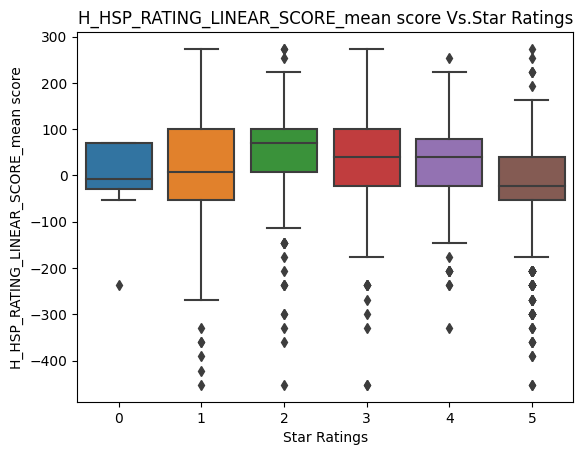

In [261]:
# Merging safety scores with hospital ratings
experience_scores = experience_scores.merge(final_scores, left_on="Provider ID",right_on="Provider ID")
experience_scores.drop(["Provider ID"],axis=1,inplace=True)
   
experience_scores_plot = experience_scores*100
experience_scores_plot["newcluster_id"] = experience_scores["newcluster_id"]

plt.style.use('default')
plot_hsp = sns.boxplot(x="newcluster_id" , y="H_HSP_RATING_LINEAR_SCORE_mean" ,data= experience_scores_plot  )
plot_hsp.set_ylabel("H_HSP_RATING_LINEAR_SCORE_mean score")
plot_hsp.set_xlabel("Star Ratings")
plot_hsp.set(title="H_HSP_RATING_LINEAR_SCORE_mean score Vs.Star Ratings")
plt.show()

**Observation**: HSP_RATING score of the provider is lower than the 25th percentile of rating four.

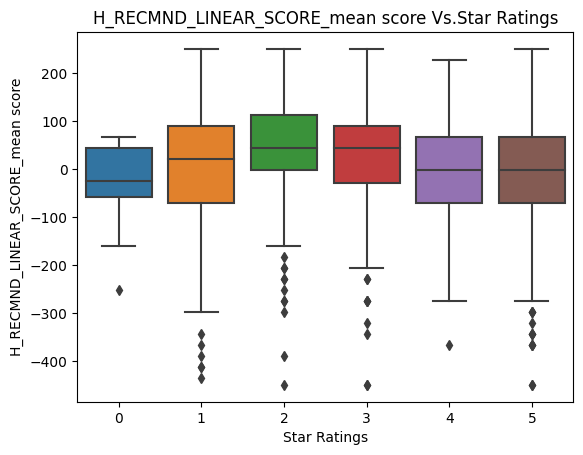

In [262]:
plt.style.use('default')
plot_recmd = sns.boxplot(x="newcluster_id" , y="H_RECMND_LINEAR_SCORE_mean" ,data= experience_scores_plot  )
plot_recmd.set_ylabel("H_RECMND_LINEAR_SCORE_mean score")
plot_recmd.set_xlabel("Star Ratings") 
plot_recmd.set(title="H_RECMND_LINEAR_SCORE_mean score Vs.Star Ratings")
plt.show()

H_RECMND_LINEAR_SCORE_mean is near the 25th percentile of rating=4. However, second, a star rating hospital has mean higher score comparatively.

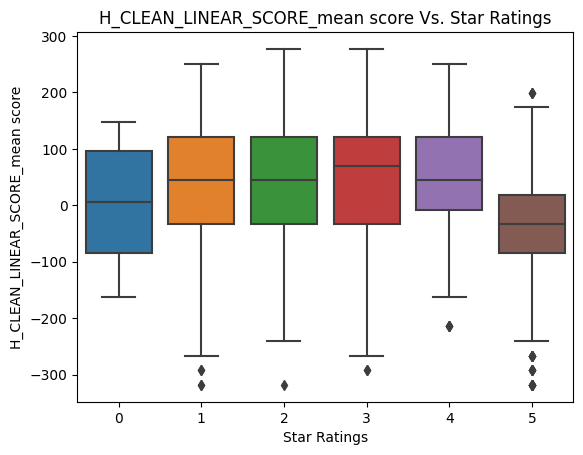

In [263]:
plot_clean = sns.boxplot(x="newcluster_id" , y="H_CLEAN_LINEAR_SCORE_mean" ,data= experience_scores_plot  )
plot_clean.set_ylabel("H_CLEAN_LINEAR_SCORE_mean score")
plot_clean.set_xlabel("Star Ratings") 
plot_clean.set(title="H_CLEAN_LINEAR_SCORE_mean score Vs. Star Ratings")
plt.show()

H_CLEAN_LINEAR_SCORE_mean of 0 is comparable to the median cleanliness score for rating=3; again five star rating hospital has the comparatively lower score.

**3. Readmission**

In [264]:
readm_scores = readmission_clean

# Readmission scores of the provider
avg_readm = readm_scores[readm_scores["Provider ID"] == 140010].iloc[:,1:readm_scores.shape[1]]

# Comparing with the average readm scores
provider_readm = readm_scores.iloc[:, 1:readm_scores.shape[1]].mean().round(3)

# Result
pd.concat([avg_readm, pd.DataFrame([list(provider_readm)] , columns=avg_readm.columns)])

,READM_30_AMI_score,READM_30_CABG_score,READM_30_COPD_score,READM_30_HF_score,READM_30_HIP_KNEE_score,READM_30_HOSP_WIDE_score,READM_30_PN_score,READM_30_STK_score
1124,0.408636,-1.058546,0.235655,0.503942,1.645491,0.457452,0.356369,-0.217749
0,-0.000000,0.001000,0.000000,0.001000,0.000000,-0.001000,0.001000,0.000000


**Observation**
1. READM_30_AMI_score; READM_30_STK_score better score
2. READM_30_AMI_score; READM_30_COPD_score; READM_30_HF_score; READM_30_HIP_KNEE_score; READM_30_HOSP_WIDE_scor; READM_30_PN_score- need improvement

**Step 6: RandomForest & Other models selection**

In [265]:
# Import the master clean file has combined score of all seven variables 
masterfile = masterfile_clean
print(masterfile.shape);Line_Separator()
print(masterfile.columns);Line_Separator1()

(4818, 65)
************************************************************ 

Index(['Provider ID', 'MORT_30_AMI_score', 'MORT_30_CABG_score',
       'MORT_30_COPD_score', 'MORT_30_HF_score', 'MORT_30_PN_score',
       'MORT_30_STK_score', 'PSI_4_SURG_COMP_Score', 'READM_30_AMI_score',
       'READM_30_CABG_score', 'READM_30_COPD_score', 'READM_30_HF_score',
       'READM_30_HIP_KNEE_score', 'READM_30_HOSP_WIDE_score',
       'READM_30_PN_score', 'READM_30_STK_score', 'HAI_1_SIR', 'HAI_2_SIR',
       'HAI_3_SIR', 'HAI_4_SIR', 'HAI_5_SIR', 'HAI_6_SIR',
       'COMP_HIP_KNEE_Score', 'PSI_90_SAFETY_Score',
       'H_CLEAN_LINEAR_SCORE_mean', 'H_COMP_1_LINEAR_SCORE_mean',
       'H_COMP_2_LINEAR_SCORE_mean', 'H_COMP_3_LINEAR_SCORE_mean',
       'H_COMP_4_LINEAR_SCORE_mean', 'H_COMP_5_LINEAR_SCORE_mean',
       'H_COMP_6_LINEAR_SCORE_mean', 'H_COMP_7_LINEAR_SCORE_mean',
       'H_HSP_RATING_LINEAR_SCORE_mean', 'H_QUIET_LINEAR_SCORE_mean',
       'H_RECMND_LINEAR_SCORE_mean', 'OP_10_Score', 'OP_

In [266]:
# CMS ratings data 

ratings = pd.read_csv("../input/capstone-project-cms-hospital-ratings/Hospital_Revised_FlatFiles_20161110/Hospital General Information.csv" ,  encoding = "ISO-8859-1")
ratings = ratings[ratings.columns[[0, 12]]]
print(ratings.shape);Line_Separator1()
print(ratings.columns);Line_Separator1()

(4818, 2)
**************************************************************************************************** 

Index(['Provider ID', 'Hospital overall rating'], dtype='object')
**************************************************************************************************** 



In [267]:
# count - 'Not Available'
ratings["Hospital overall rating"][ratings["Hospital overall rating"] == "Not Available"] = np.nan
print(ratings.isna().sum())

Provider ID                   0
Hospital overall rating    1170
dtype: int64


In [268]:
# Merging the master file and rating file
masterfile = masterfile.merge( ratings, left_on="Provider ID",right_on="Provider ID")

In [269]:
# Removing provider ID
masterfile = masterfile.iloc[:,1:]

# Removing na entry 
masterfile = masterfile[masterfile["Hospital overall rating"].notna()]

In [270]:
# Removing - 'Not Available'
masterfile["Hospital overall rating"] = masterfile["Hospital overall rating"].astype("int") #.astype("category")
print (masterfile["Hospital overall rating"].value_counts())
print (masterfile.shape[0])

3    1772
4     964
2     684
1     117
5     111
Name: Hospital overall rating, dtype: int64
3648


In [271]:
masterfile.head(2)

,MORT_30_AMI_score,MORT_30_CABG_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,PSI_4_SURG_COMP_Score,READM_30_AMI_score,READM_30_CABG_score,READM_30_COPD_score,...,STK_4_Score,STK_5_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,VTE_6_Score,Hospital overall rating
0,1.249,-0.996,-1.094,-0.166,0.428,-0.282,-1.712,0.409,-0.615,-0.867,...,-1.228,-0.025,0.446,-0.570,0.334,0.381,-0.278,-0.254,0.416,3
1,-1.546,NaN,0.434,-2.286,-2.103,-0.342,-2.298,0.200,NaN,1.574,...,NaN,0.193,-0.915,0.618,0.178,-0.450,0.819,0.635,NaN,3


In [272]:
# Data spliting 
def nc(x):
    return x.isna().sum()

na_cols = masterfile.apply(nc , axis =0)
print (na_cols)

MORT_30_AMI_score          1267
MORT_30_CABG_score         2612
MORT_30_COPD_score          257
MORT_30_HF_score            221
MORT_30_PN_score            131
                           ... 
VTE_2_Score                 778
VTE_3_Score                1208
VTE_5_Score                1458
VTE_6_Score                2417
Hospital overall rating       0
Length: 65, dtype: int64


In [273]:
masterfile.dtypes

MORT_30_AMI_score          float64
MORT_30_CABG_score         float64
MORT_30_COPD_score         float64
MORT_30_HF_score           float64
MORT_30_PN_score           float64
                            ...   
VTE_2_Score                float64
VTE_3_Score                float64
VTE_5_Score                float64
VTE_6_Score                float64
Hospital overall rating      int64
Length: 65, dtype: object

In [274]:
# Remove columns > 1800 NA values
na_cols  = na_cols[na_cols > 1800]
print (na_cols)

MORT_30_CABG_score       2612
PSI_4_SURG_COMP_Score    1831
READM_30_CABG_score      2623
HAI_4_SIR                2804
HAI_5_SIR                1860
OP_10_Score              3648
OP_11_Score              3648
OP_13_Score              3648
OP_14_Score              3648
OP_8_Score               3648
OP_3b_Score              3267
CAC_3_Score              3516
OP_23_Score              2467
STK_4_Score              2762
STK_5_Score              2133
VTE_6_Score              2417
dtype: int64


In [275]:
masterfile = masterfile.drop(list(na_cols.index), axis=1)
masterfile.head(2)

,MORT_30_AMI_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,READM_30_AMI_score,READM_30_COPD_score,READM_30_HF_score,READM_30_HIP_KNEE_score,READM_30_HOSP_WIDE_score,...,OP_30_Score,OP_4_Score,PC_01_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score,Hospital overall rating
0,1.249,-1.094,-0.166,0.428,-0.282,0.409,-0.867,0.370,-0.884,0.215,...,0.071,NaN,0.539,0.446,-0.570,0.334,0.381,-0.278,-0.254,3
1,-1.546,0.434,-2.286,-2.103,-0.342,0.200,1.574,0.036,-1.968,0.821,...,0.500,0.546,0.324,-0.915,0.618,0.178,-0.450,0.819,0.635,3


In [276]:
masterfile['Hospital overall rating'].unique()

array([3, 2, 4, 5, 1])

In [277]:
# Replacing na with median value
masterfile = masterfile.fillna(masterfile.median())

In [278]:
# Identify missing value
(100*(masterfile.isnull()).sum()/len(masterfile)).sort_values(ascending=False)

MORT_30_AMI_score                 0.0
H_COMP_7_LINEAR_SCORE_mean        0.0
H_QUIET_LINEAR_SCORE_mean         0.0
H_RECMND_LINEAR_SCORE_mean        0.0
ED_1b_Score                       0.0
ED_2b_Score                       0.0
OP_18b_Score                      0.0
OP_20_Score                       0.0
OP_21_Score                       0.0
OP_5_Score                        0.0
IMM_2_Score                       0.0
IMM_3_OP_27_FAC_ADHPCT_Score      0.0
OP_22_Score                       0.0
OP_29_Score                       0.0
OP_30_Score                       0.0
OP_4_Score                        0.0
PC_01_Score                       0.0
STK_6_Score                       0.0
STK_8_Score                       0.0
VTE_1_Score                       0.0
VTE_2_Score                       0.0
VTE_3_Score                       0.0
VTE_5_Score                       0.0
H_HSP_RATING_LINEAR_SCORE_mean    0.0
H_COMP_6_LINEAR_SCORE_mean        0.0
MORT_30_COPD_score                0.0
H_COMP_5_LIN

In [279]:
X = masterfile.drop("Hospital overall rating",axis=1)
y = masterfile["Hospital overall rating"]

In [280]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2, train_size=0.8,  random_state=0)
X_train.shape,X_test.shape

((2918, 48), (730, 48))

In [281]:
%%time
ML_models = {}
model_index = ['LR','RF','NN', 'GRB', 'DT','KN']
model_sklearn = [LogisticRegression(solver='liblinear',random_state=0),
                 RandomForestClassifier(n_estimators=100,random_state=0),
                 MLPClassifier([100]*5,early_stopping=True,learning_rate='adaptive',random_state=0),
                 GradientBoostingClassifier(n_estimators = 50, max_depth = 2, random_state = 0),
                 DecisionTreeClassifier(random_state = 0),
                 KNeighborsClassifier(n_neighbors=5)]
                
    
model_summary = []
model_summary1 = []

for name,model in zip(model_index,model_sklearn):
    ML_models[name] = model.fit(X_train,y_train)
    preds = model.predict(X_test)
    model_summary.append([name,f1_score(y_test,preds,average='weighted'),accuracy_score(y_test,preds)])
    model_summary1.append([name,confusion_matrix(y_test,preds)])
print(ML_models)

{'LR': LogisticRegression(random_state=0, solver='liblinear'), 'RF': RandomForestClassifier(random_state=0), 'NN': MLPClassifier(early_stopping=True, hidden_layer_sizes=[100, 100, 100, 100, 100],
              learning_rate='adaptive', random_state=0), 'GRB': GradientBoostingClassifier(max_depth=2, n_estimators=50, random_state=0), 'DT': DecisionTreeClassifier(random_state=0), 'KN': KNeighborsClassifier()}
CPU times: user 11.5 s, sys: 4.21 s, total: 15.7 s
Wall time: 15.7 s


In [282]:
model_summary = pd.DataFrame(model_summary,columns=['Name','F1_score','Accuracy'])
model_summary = model_summary.reset_index()
display(model_summary)

,index,Name,F1_score,Accuracy
0,0,LR,0.723529,0.745205
1,1,RF,0.750015,0.761644
2,2,NN,0.869498,0.869863
3,3,GRB,0.752339,0.760274
4,4,DT,0.653307,0.653425
5,5,KN,0.682720,0.693151


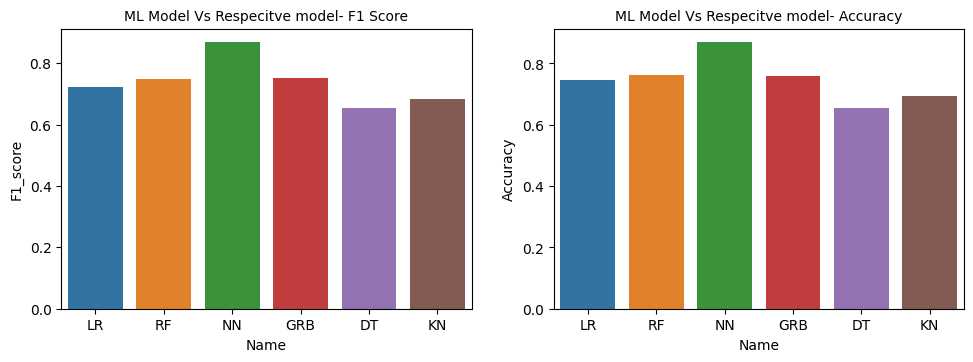

In [283]:
plt.rcParams['figure.figsize']=(18,8)
plt.subplot(231)
g=sns.barplot(data=model_summary, x="Name", y="F1_score")
plt.title('ML Model Vs Respecitve model- F1 Score', fontsize=10)

plt.subplot(232)
g=sns.barplot(data=model_summary, x="Name", y="Accuracy")
plt.title('ML Model Vs Respecitve model- Accuracy', fontsize=10)

plt.show()

In [284]:
print(model_summary1)

[['LR', array([[  5,  16,   0,   0,   0],
       [  1,  58,  70,   0,   0],
       [  0,   8, 337,  13,   0],
       [  0,   0,  61, 142,   0],
       [  0,   0,   0,  17,   2]])], ['RF', array([[  6,  15,   0,   0,   0],
       [  2,  78,  49,   0,   0],
       [  0,  11, 327,  20,   0],
       [  0,   0,  63, 140,   0],
       [  0,   0,   0,  14,   5]])], ['NN', array([[ 16,   5,   0,   0,   0],
       [  1, 111,  17,   0,   0],
       [  0,  19, 320,  19,   0],
       [  0,   0,  23, 176,   4],
       [  0,   0,   0,   7,  12]])], ['GRB', array([[  8,  13,   0,   0,   0],
       [  3,  79,  47,   0,   0],
       [  0,  13, 320,  25,   0],
       [  0,   0,  61, 141,   1],
       [  0,   0,   0,  12,   7]])], ['DT', array([[ 12,   9,   0,   0,   0],
       [  8,  77,  42,   2,   0],
       [  1,  46, 258,  51,   2],
       [  0,   3,  66, 123,  11],
       [  0,   0,   1,  11,   7]])], ['KN', array([[  6,  14,   1,   0,   0],
       [  3,  67,  59,   0,   0],
       [  0,  16, 303, 

Top 10 features are: 
READM_30_HOSP_WIDE_score
PSI_90_SAFETY_Score
H_COMP_7_LINEAR_SCORE_mean
H_HSP_RATING_LINEAR_SCORE_mean
MORT_30_PN_score
H_RECMND_LINEAR_SCORE_mean
MORT_30_HF_score
H_COMP_3_LINEAR_SCORE_mean
H_COMP_1_LINEAR_SCORE_mean
READM_30_PN_score


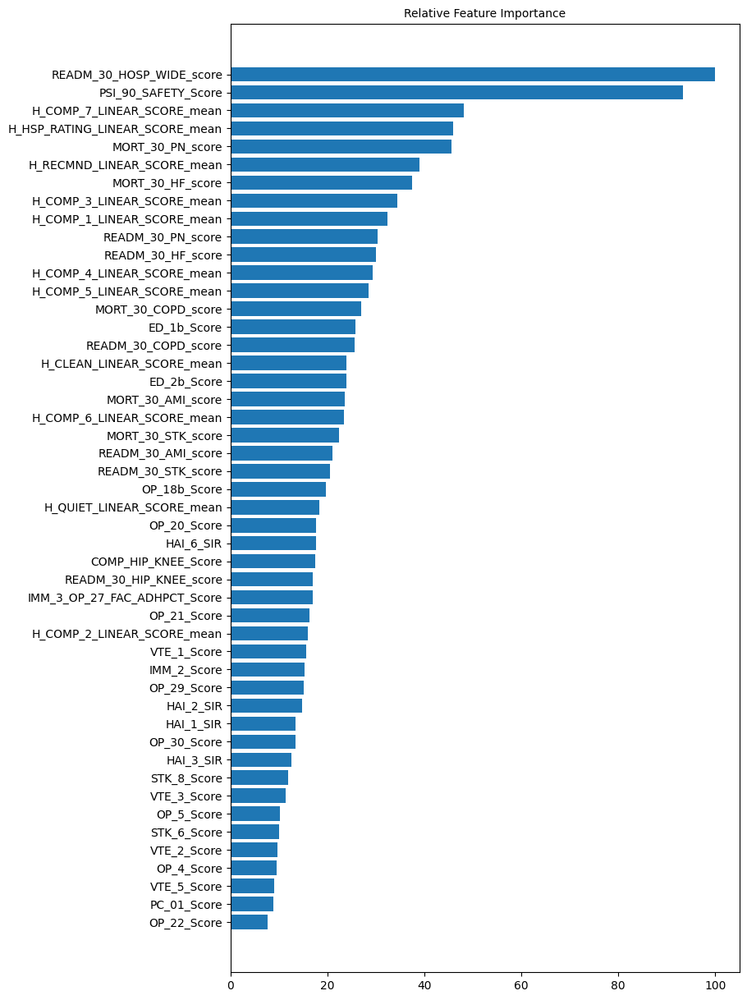

In [285]:
importances = ML_models['RF'].feature_importances_

# Make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# Plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

Top 10 features are: 
READM_30_HOSP_WIDE_score
PSI_90_SAFETY_Score
H_COMP_7_LINEAR_SCORE_mean
MORT_30_HF_score
MORT_30_PN_score
MORT_30_COPD_score
H_RECMND_LINEAR_SCORE_mean
H_HSP_RATING_LINEAR_SCORE_mean
H_COMP_3_LINEAR_SCORE_mean
H_COMP_1_LINEAR_SCORE_mean


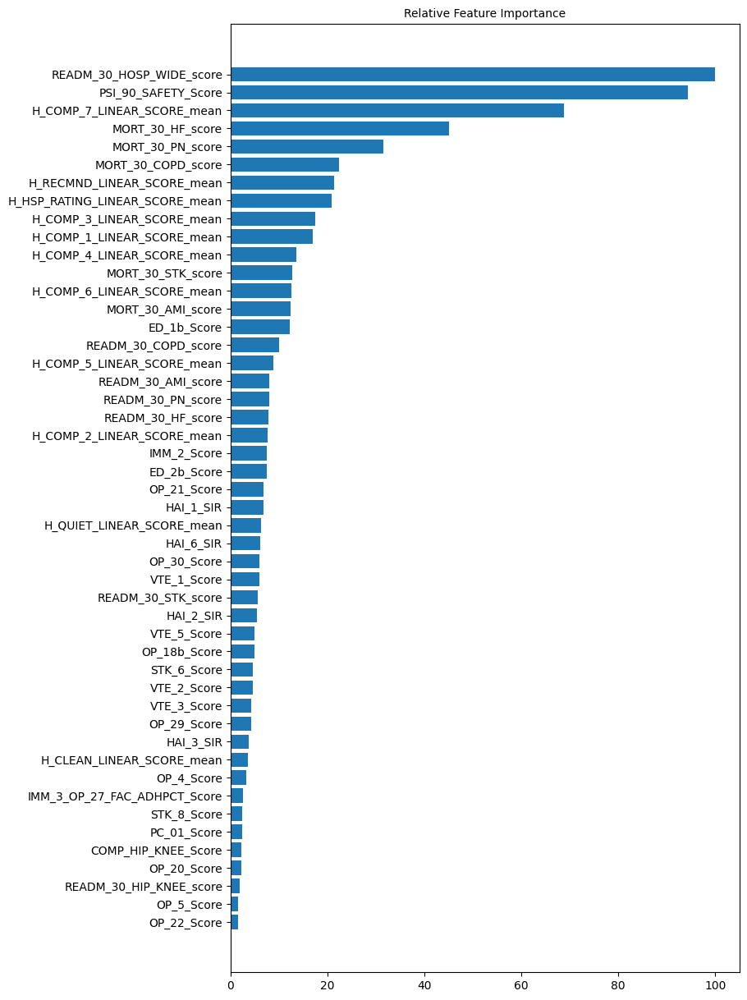

In [286]:
importances = ML_models['DT'].feature_importances_

# make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

Top 10 features are: 
READM_30_HOSP_WIDE_score
PSI_90_SAFETY_Score
H_COMP_7_LINEAR_SCORE_mean
H_HSP_RATING_LINEAR_SCORE_mean
H_COMP_3_LINEAR_SCORE_mean
H_COMP_1_LINEAR_SCORE_mean
MORT_30_PN_score
H_RECMND_LINEAR_SCORE_mean
MORT_30_HF_score
H_COMP_4_LINEAR_SCORE_mean


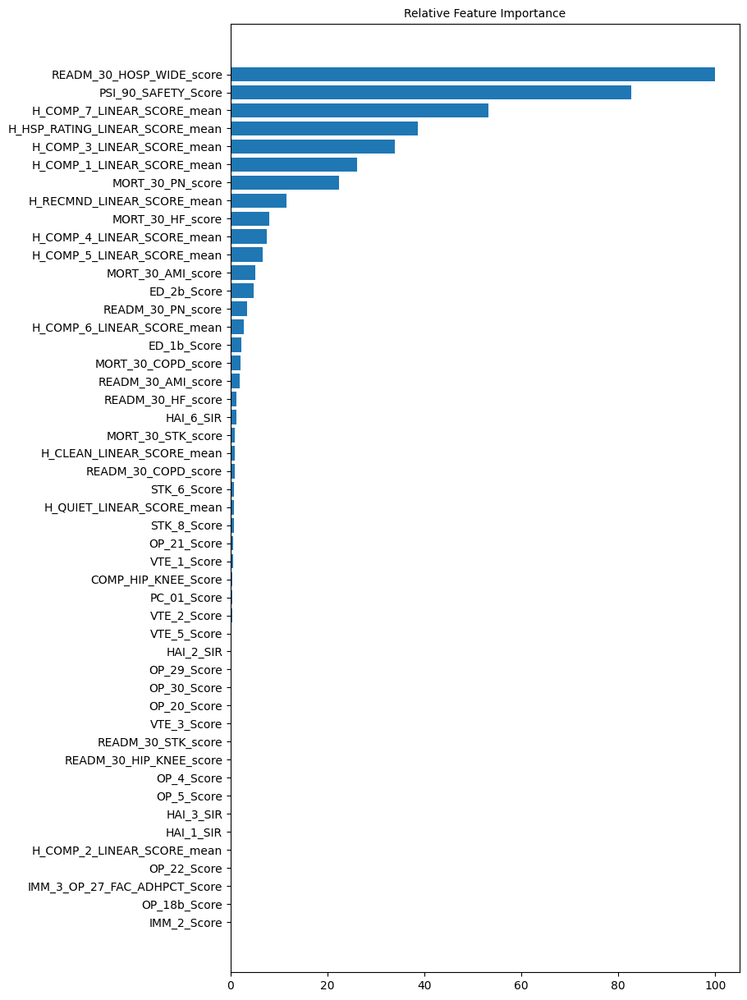

In [287]:
importances = ML_models['GRB'].feature_importances_

# make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

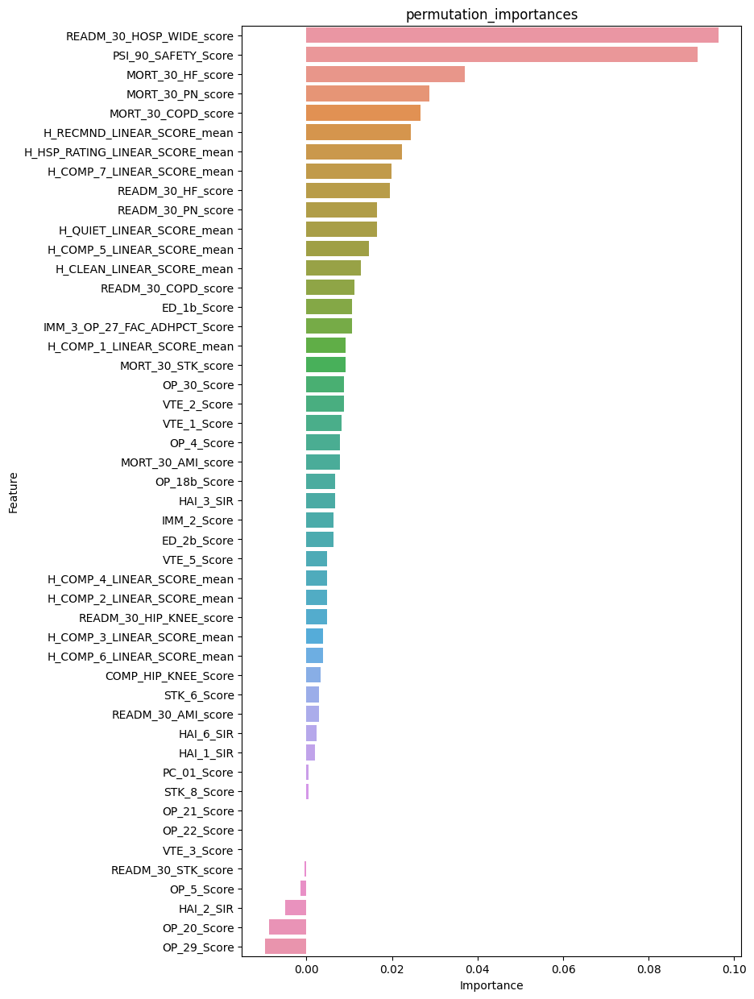

In [288]:
# RF model permutation_importances

from sklearn.metrics import r2_score
from rfpimp import permutation_importances

def r2(model, X_train, y_train):
    return r2_score(y_train, model.predict(X_train))

perm_imp_rfpimp = permutation_importances(model, X_train, y_train, r2).reset_index()


# plot the result
plt.figure(figsize=(8, 15))
g=sns.barplot(data=perm_imp_rfpimp, y="Feature", x="Importance")
plt.title('permutation_importances')
plt.show()

In [289]:
#initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['1','2','3','4','5'])

In [290]:
X_test.head(2)

,MORT_30_AMI_score,MORT_30_COPD_score,MORT_30_HF_score,MORT_30_PN_score,MORT_30_STK_score,READM_30_AMI_score,READM_30_COPD_score,READM_30_HF_score,READM_30_HIP_KNEE_score,READM_30_HOSP_WIDE_score,...,OP_29_Score,OP_30_Score,OP_4_Score,PC_01_Score,STK_6_Score,STK_8_Score,VTE_1_Score,VTE_2_Score,VTE_3_Score,VTE_5_Score
3897,-0.508,0.254,-1.055,-1.196,0.079,-0.009,-2.048,-1.633,0.019,-1.600,...,0.981,0.844,0.190,-0.106,-0.544,0.161,0.567,0.215,0.210,0.102
708,1.010,0.434,0.313,1.001,0.439,1.139,0.551,-0.097,-0.884,0.336,...,0.476,0.629,0.546,0.539,-0.173,0.618,0.334,0.215,0.576,0.635


In [291]:
test_df = pd.DataFrame(X_test.loc[3897,:]).T

In [292]:
#ELI5 - RandomForest (Global model interpretation)
ELI5_RF_GMI = eli5.show_weights(ML_models['RF'], feature_names = list(X_test.columns),top=None)
ELI5_RF_GMI

Weight,Feature
0.0850 ± 0.0406,READM_30_HOSP_WIDE_score
0.0793 ± 0.0331,PSI_90_SAFETY_Score
0.0408 ± 0.0542,H_COMP_7_LINEAR_SCORE_mean
0.0391 ± 0.0605,H_HSP_RATING_LINEAR_SCORE_mean
0.0387 ± 0.0177,MORT_30_PN_score
0.0332 ± 0.0454,H_RECMND_LINEAR_SCORE_mean
0.0319 ± 0.0181,MORT_30_HF_score
0.0292 ± 0.0365,H_COMP_3_LINEAR_SCORE_mean
0.0275 ± 0.0457,H_COMP_1_LINEAR_SCORE_mean
0.0258 ± 0.0207,READM_30_PN_score


EADM_30_HOSP_WIDE_score ; PSI_90_SAFETY_Score are deciding features for hospital ranking.

In [293]:
#ELI5 - RandomForest (Local model interpretation)
ELI5_RF_LMI = eli5.show_prediction(ML_models['RF'], test_df.values[0],feature_names=list(X_test.columns),top=None, show_feature_values=True)
ELI5_RF_LMI

READM_30_HOSP_WIDE_score; READM_30_COPD_score ; PSI_90_SAFETY_Score ; H_COMP_3_LINEAR_SCORE_mean ; ED_2b_Score are the key subfeatures for hospital ranking.

In [294]:
#ELI5 - RF (Permutation Importance from Testing Data)
exp_RF = PermutationImportance(ML_models['RF'],random_state = 0).fit(X_test, y_test)
ELI5_RF_PM =eli5.show_weights(exp_RF,feature_names=list(X_test.columns),top=None)
ELI5_RF_PM 

Weight,Feature
0.1104 ± 0.0341,READM_30_HOSP_WIDE_score
0.0485 ± 0.0133,PSI_90_SAFETY_Score
0.0186 ± 0.0079,MORT_30_PN_score
0.0101 ± 0.0064,MORT_30_HF_score
0.0063 ± 0.0093,H_RECMND_LINEAR_SCORE_mean
0.0058 ± 0.0053,READM_30_HF_score
0.0055 ± 0.0124,H_COMP_4_LINEAR_SCORE_mean
0.0038 ± 0.0121,H_COMP_7_LINEAR_SCORE_mean
0.0036 ± 0.0037,READM_30_STK_score
0.0030 ± 0.0044,READM_30_COPD_score


READM_30_HOSP_WIDE_score is the key for hospital ranking

In [295]:
#ELI5 - NN (Permutation Importance from Testing Data)
exp_NN = PermutationImportance(ML_models['NN'],random_state = 0).fit(X_test, y_test)
ELI5_NN_PM =eli5.show_weights(exp_NN,feature_names=list(X_test.columns),top=None)
ELI5_NN_PM

Weight,Feature
0.2318 ± 0.0162,READM_30_HOSP_WIDE_score
0.1838 ± 0.0200,PSI_90_SAFETY_Score
0.0649 ± 0.0198,MORT_30_HF_score
0.0523 ± 0.0032,MORT_30_PN_score
0.0334 ± 0.0082,H_COMP_3_LINEAR_SCORE_mean
0.0312 ± 0.0180,H_COMP_4_LINEAR_SCORE_mean
0.0279 ± 0.0102,H_COMP_1_LINEAR_SCORE_mean
0.0277 ± 0.0053,H_COMP_7_LINEAR_SCORE_mean
0.0247 ± 0.0118,MORT_30_COPD_score
0.0175 ± 0.0094,H_HSP_RATING_LINEAR_SCORE_mean


READM_30_HOSP_WIDE_score and PSI_90_SAFETY_Score are two key for hospital ranking

In [296]:
# SHAP - RF
exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(test_df.values)
shap.force_plot(exp_RF.expected_value[0], shap_values_RF[0], 
                test_df.values, feature_names=X_test.columns)

Read 30 HOSP Wide socre,key for hospital ranking

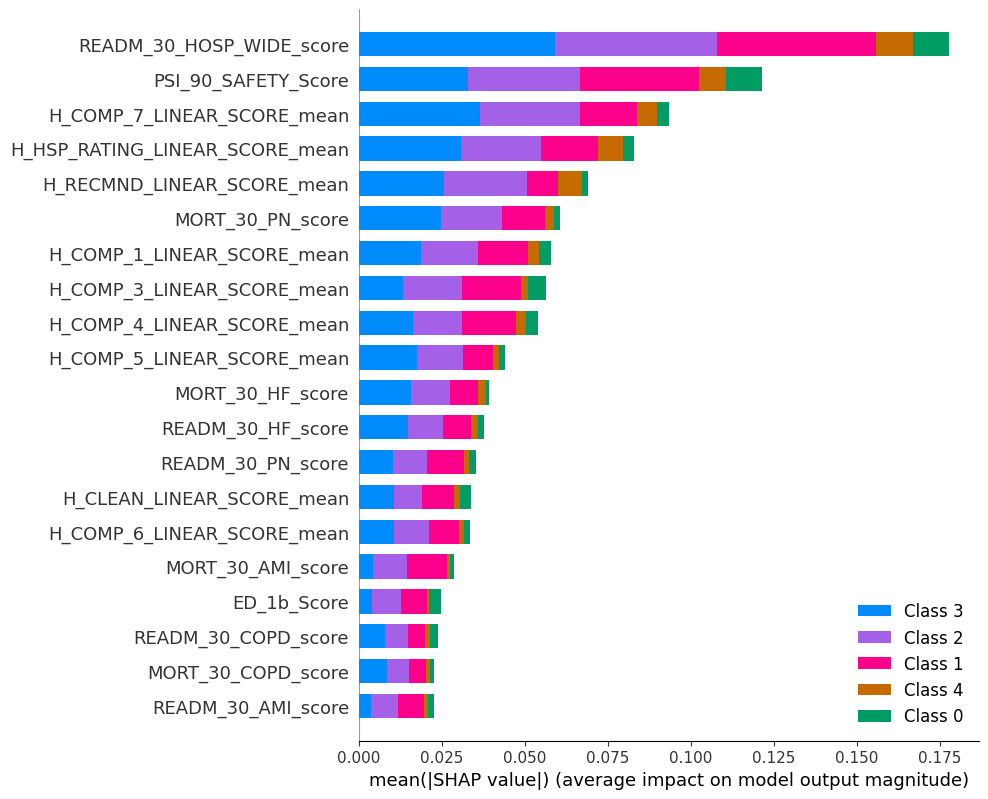

In [297]:
# Initialization of an explainer from LIME

explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['1','3'])

exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values_RF, X_test.values, feature_names=X_test.columns)


1. READM_30_HOSP_WIDE_score is the most contributing factor in hospital ranking.
2. We could achieve much better accuracy with three classes instead of 5. Moreover, in earlier kmean clustering, we observed through elbow-curve/SSD. Three looks more promising. We will convert them into three clusters based on domain understanding, i.e., 1,2 should be low; three should be average, and 4 & 5 should be good

In [298]:
# Review Data
masterfile['Hospital overall rating'].unique()

array([3, 2, 4, 5, 1])

In [299]:
# Ratings into (1,2=low), (3=avg), (4,5) = good
for row in list(masterfile.index):
    if (masterfile.loc[row,"Hospital overall rating"] == 2):
        masterfile.loc[row,"Hospital overall rating"] = 1
  
    if (masterfile.loc[row,"Hospital overall rating"] == 4):
        masterfile.loc[row,"Hospital overall rating"] = 5

In [300]:
# Review Data 
masterfile['Hospital overall rating'].unique()

array([3, 1, 5])

One implies low, three means medium, and four indicates - good

In [301]:
masterfile.dtypes

MORT_30_AMI_score                 float64
MORT_30_COPD_score                float64
MORT_30_HF_score                  float64
MORT_30_PN_score                  float64
MORT_30_STK_score                 float64
READM_30_AMI_score                float64
READM_30_COPD_score               float64
READM_30_HF_score                 float64
READM_30_HIP_KNEE_score           float64
READM_30_HOSP_WIDE_score          float64
READM_30_PN_score                 float64
READM_30_STK_score                float64
HAI_1_SIR                         float64
HAI_2_SIR                         float64
HAI_3_SIR                         float64
HAI_6_SIR                         float64
COMP_HIP_KNEE_Score               float64
PSI_90_SAFETY_Score               float64
H_CLEAN_LINEAR_SCORE_mean         float64
H_COMP_1_LINEAR_SCORE_mean        float64
H_COMP_2_LINEAR_SCORE_mean        float64
H_COMP_3_LINEAR_SCORE_mean        float64
H_COMP_4_LINEAR_SCORE_mean        float64
H_COMP_5_LINEAR_SCORE_mean        

In [302]:
X = masterfile.drop("Hospital overall rating",axis=1)
y = masterfile["Hospital overall rating"]

In [303]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2, train_size=0.8,  random_state=0)
X_train.shape,X_test.shape

((2918, 48), (730, 48))

In [304]:
%%time
ML_models = {}
model_index = ['LR','RF','NN', 'GRB', 'DT','KN']
model_sklearn = [LogisticRegression(solver='liblinear',random_state=0),
                 RandomForestClassifier(n_estimators=100,random_state=0),
                 MLPClassifier([100]*5,early_stopping=True,learning_rate='adaptive',random_state=0),
                 GradientBoostingClassifier(n_estimators = 50, max_depth = 2, random_state = 0),
                 DecisionTreeClassifier(random_state = 0),
                 KNeighborsClassifier(n_neighbors=5)]
                
    
model_summary = []
model_summary1 = []

for name,model in zip(model_index,model_sklearn):
    ML_models[name] = model.fit(X_train,y_train)
    preds = model.predict(X_test)
    model_summary.append([name,f1_score(y_test,preds,average='weighted'),accuracy_score(y_test,preds)])
    model_summary1.append([name,confusion_matrix(y_test,preds)])
print(ML_models)

{'LR': LogisticRegression(random_state=0, solver='liblinear'), 'RF': RandomForestClassifier(random_state=0), 'NN': MLPClassifier(early_stopping=True, hidden_layer_sizes=[100, 100, 100, 100, 100],
              learning_rate='adaptive', random_state=0), 'GRB': GradientBoostingClassifier(max_depth=2, n_estimators=50, random_state=0), 'DT': DecisionTreeClassifier(random_state=0), 'KN': KNeighborsClassifier()}
CPU times: user 6.13 s, sys: 1.86 s, total: 7.99 s
Wall time: 7.99 s


In [305]:
model_summary = pd.DataFrame(model_summary,columns=['Name','F1_score','Accuracy'])
model_summary = model_summary.reset_index()
display(model_summary)

,index,Name,F1_score,Accuracy
0,0,LR,0.904187,0.904110
1,1,RF,0.830790,0.831507
2,2,NN,0.868933,0.869863
3,3,GRB,0.808672,0.809589
4,4,DT,0.701629,0.701370
5,5,KN,0.734246,0.736986


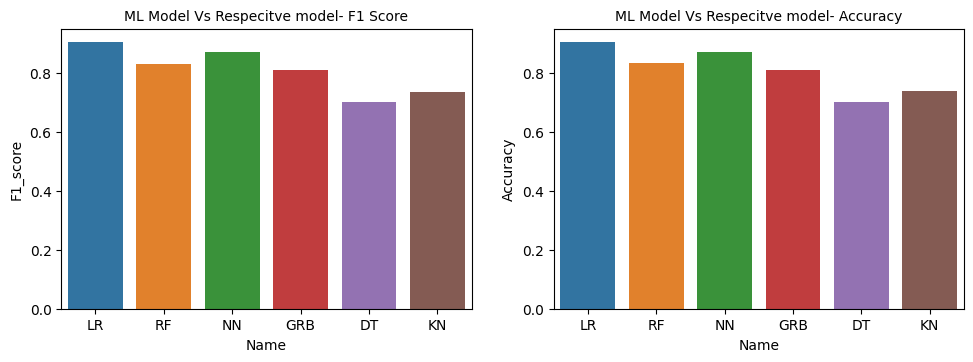

In [306]:
plt.rcParams['figure.figsize']=(18,8)
plt.subplot(231)
g=sns.barplot(data=model_summary, x="Name", y="F1_score")
plt.title('ML Model Vs Respecitve model- F1 Score', fontsize=10)

plt.subplot(232)
g=sns.barplot(data=model_summary, x="Name", y="Accuracy")
plt.title('ML Model Vs Respecitve model- Accuracy', fontsize=10)

plt.show()

In [307]:
print(model_summary1)

[['LR', array([[133,  17,   0],
       [ 17, 327,  14],
       [  0,  22, 200]])], ['RF', array([[115,  35,   0],
       [ 13, 324,  21],
       [  0,  54, 168]])], ['NN', array([[134,  16,   0],
       [ 27, 286,  45],
       [  0,   7, 215]])], ['GRB', array([[106,  44,   0],
       [ 13, 316,  29],
       [  0,  53, 169]])], ['DT', array([[106,  43,   1],
       [ 52, 249,  57],
       [  4,  61, 157]])], ['KN', array([[ 90,  60,   0],
       [ 16, 302,  40],
       [  0,  76, 146]])]]


Top 10 features are: 
READM_30_HOSP_WIDE_score
PSI_90_SAFETY_Score
H_COMP_7_LINEAR_SCORE_mean
H_HSP_RATING_LINEAR_SCORE_mean
MORT_30_PN_score
H_COMP_1_LINEAR_SCORE_mean
H_RECMND_LINEAR_SCORE_mean
H_COMP_3_LINEAR_SCORE_mean
MORT_30_HF_score
H_COMP_4_LINEAR_SCORE_mean


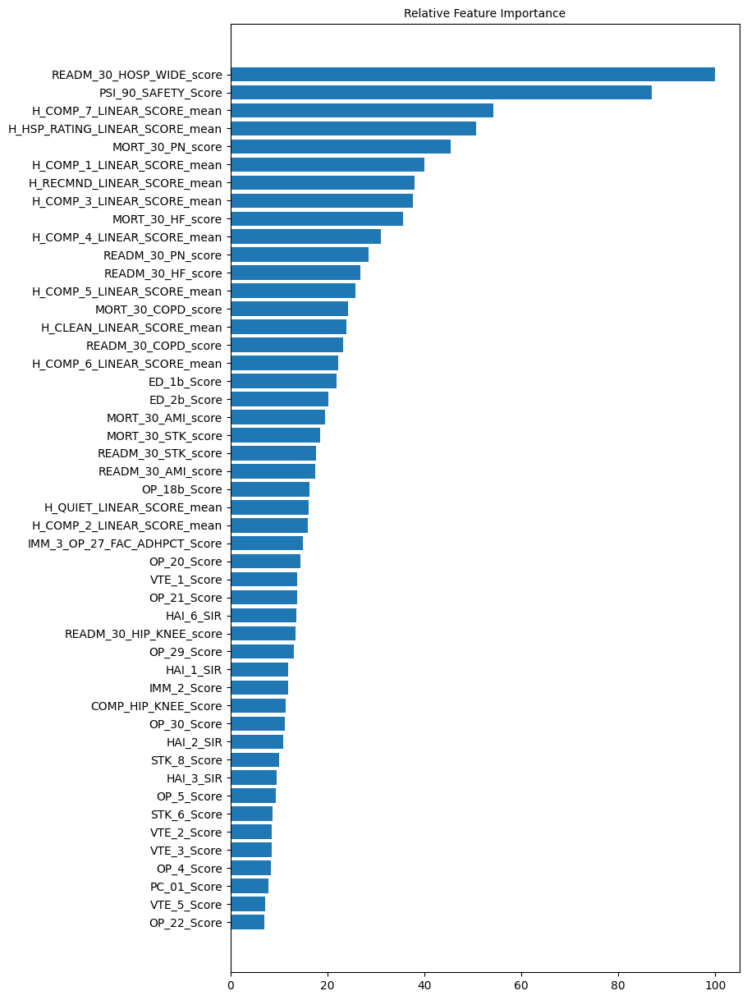

In [308]:
importances = ML_models['RF'].feature_importances_

# make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

Top 10 features are: 
READM_30_HOSP_WIDE_score
H_COMP_7_LINEAR_SCORE_mean
PSI_90_SAFETY_Score
MORT_30_HF_score
MORT_30_PN_score
H_HSP_RATING_LINEAR_SCORE_mean
MORT_30_COPD_score
H_COMP_1_LINEAR_SCORE_mean
H_COMP_3_LINEAR_SCORE_mean
H_COMP_6_LINEAR_SCORE_mean


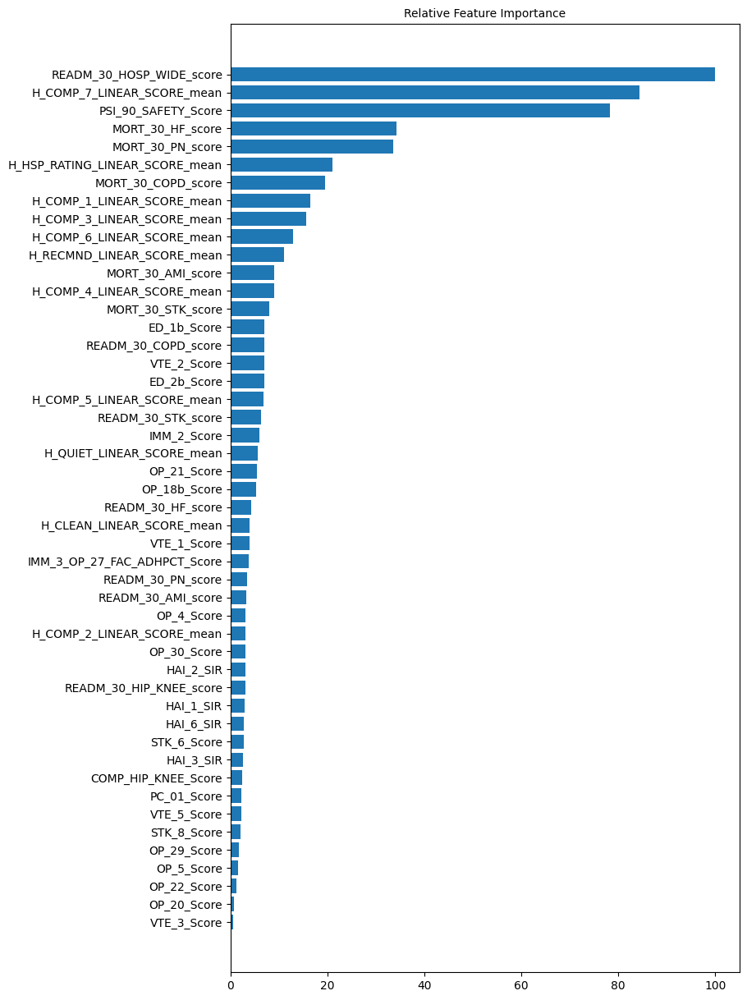

In [309]:
importances = ML_models['DT'].feature_importances_

# make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

Top 10 features are: 
READM_30_HOSP_WIDE_score
PSI_90_SAFETY_Score
H_COMP_7_LINEAR_SCORE_mean
H_HSP_RATING_LINEAR_SCORE_mean
H_COMP_3_LINEAR_SCORE_mean
H_COMP_1_LINEAR_SCORE_mean
MORT_30_PN_score
H_RECMND_LINEAR_SCORE_mean
MORT_30_HF_score
H_COMP_4_LINEAR_SCORE_mean


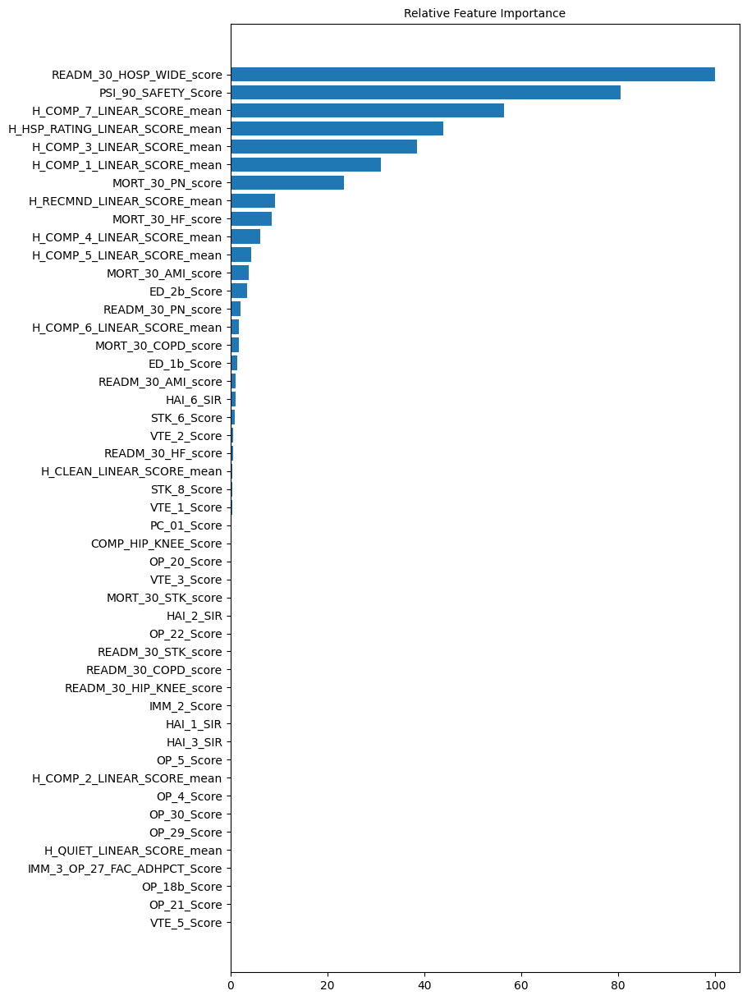

In [310]:
importances = ML_models['GRB'].feature_importances_

# make importance relative to the max importance
feature_importance = 100.0 * (importances / importances.max())
sorted_idx = np.argsort(feature_importance)
feature_names = list(X_train.columns.values)
feature_names_sort = [feature_names[indice] for indice in sorted_idx]
pos = np.arange(sorted_idx.shape[0]) + .5
print('Top 10 features are: ')
for feature in feature_names_sort[::-1][:10]:
    print(feature)

# plot the result
plt.figure(figsize=(8, 15))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, feature_names_sort)
plt.title('Relative Feature Importance', fontsize=10)
plt.show()

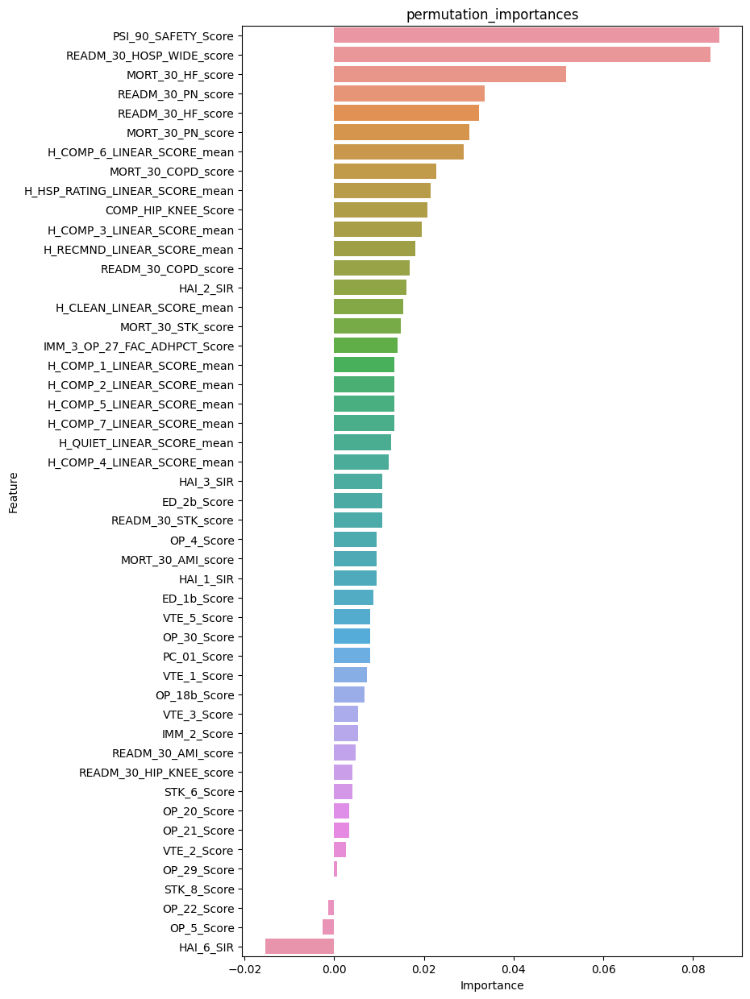

In [311]:
# RF model permutation_importances

from sklearn.metrics import r2_score
from rfpimp import permutation_importances

def r2(model, X_train, y_train):
    return r2_score(y_train, model.predict(X_train))

perm_imp_rfpimp = permutation_importances(model, X_train, y_train, r2).reset_index()


# plot the result
plt.figure(figsize=(8, 15))
g=sns.barplot(data=perm_imp_rfpimp, y="Feature", x="Importance")
plt.title('permutation_importances')
plt.show()

In [312]:
# initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['1','3','5'])

In [313]:
test_df = pd.DataFrame(X_test.loc[3897,:]).T

In [314]:
#ELI5 - RandomForest (Local model interpretation)
ELI5_RF_LMI = eli5.show_prediction(ML_models['RF'], test_df.values[0],feature_names=list(X_test.columns),top=None, show_feature_values=True)
ELI5_RF_LMI

In [315]:
#ELI5 - RF (Permutation Importance from Testing Data)
exp_RF = PermutationImportance(ML_models['RF'],random_state = 0).fit(X_test, y_test)
ELI5_RF_PM =eli5.show_weights(exp_RF,feature_names=list(X_test.columns),top=None)
ELI5_RF_PM

Weight,Feature
0.1142 ± 0.0301,READM_30_HOSP_WIDE_score
0.0729 ± 0.0148,PSI_90_SAFETY_Score
0.0293 ± 0.0134,MORT_30_PN_score
0.0181 ± 0.0053,H_HSP_RATING_LINEAR_SCORE_mean
0.0159 ± 0.0064,MORT_30_HF_score
0.0140 ± 0.0089,READM_30_HF_score
0.0140 ± 0.0084,H_COMP_1_LINEAR_SCORE_mean
0.0112 ± 0.0100,READM_30_PN_score
0.0101 ± 0.0084,MORT_30_COPD_score
0.0082 ± 0.0101,H_COMP_4_LINEAR_SCORE_mean


In [316]:
#ELI5 - NN (Permutation Importance from Testing Data)
exp_NN = PermutationImportance(ML_models['NN'],random_state = 0).fit(X_test, y_test)
ELI5_NN_PM =eli5.show_weights(exp_NN,feature_names=list(X_test.columns),top=None)
ELI5_NN_PM

Weight,Feature
0.1901 ± 0.0271,READM_30_HOSP_WIDE_score
0.1488 ± 0.0169,PSI_90_SAFETY_Score
0.0466 ± 0.0101,MORT_30_PN_score
0.0455 ± 0.0115,MORT_30_HF_score
0.0156 ± 0.0066,H_COMP_3_LINEAR_SCORE_mean
0.0137 ± 0.0039,READM_30_HF_score
0.0110 ± 0.0039,H_COMP_1_LINEAR_SCORE_mean
0.0101 ± 0.0117,H_COMP_4_LINEAR_SCORE_mean
0.0090 ± 0.0126,ED_1b_Score
0.0085 ± 0.0089,MORT_30_COPD_score


In [317]:
# SHAP - RF
exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(test_df.values)
shap.force_plot(exp_RF.expected_value[0], shap_values_RF[0], 
                test_df.values, feature_names=X_test.columns)

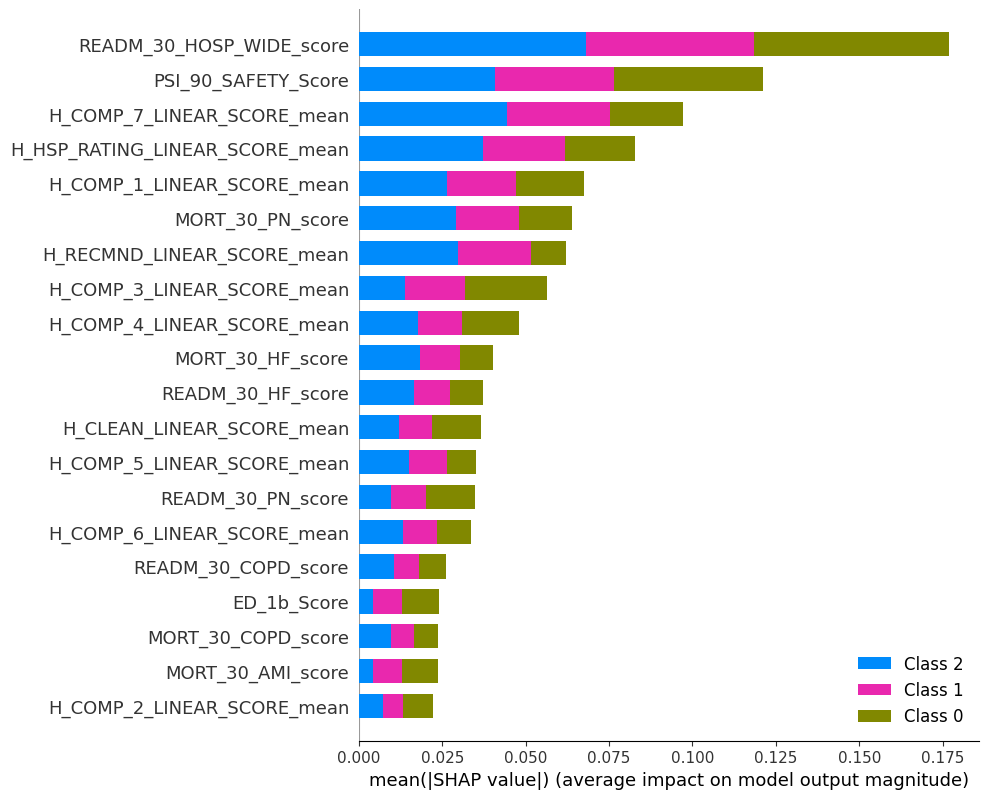

In [318]:
# Initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['1','3'])

exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values_RF, X_test.values, feature_names=X_test.columns)

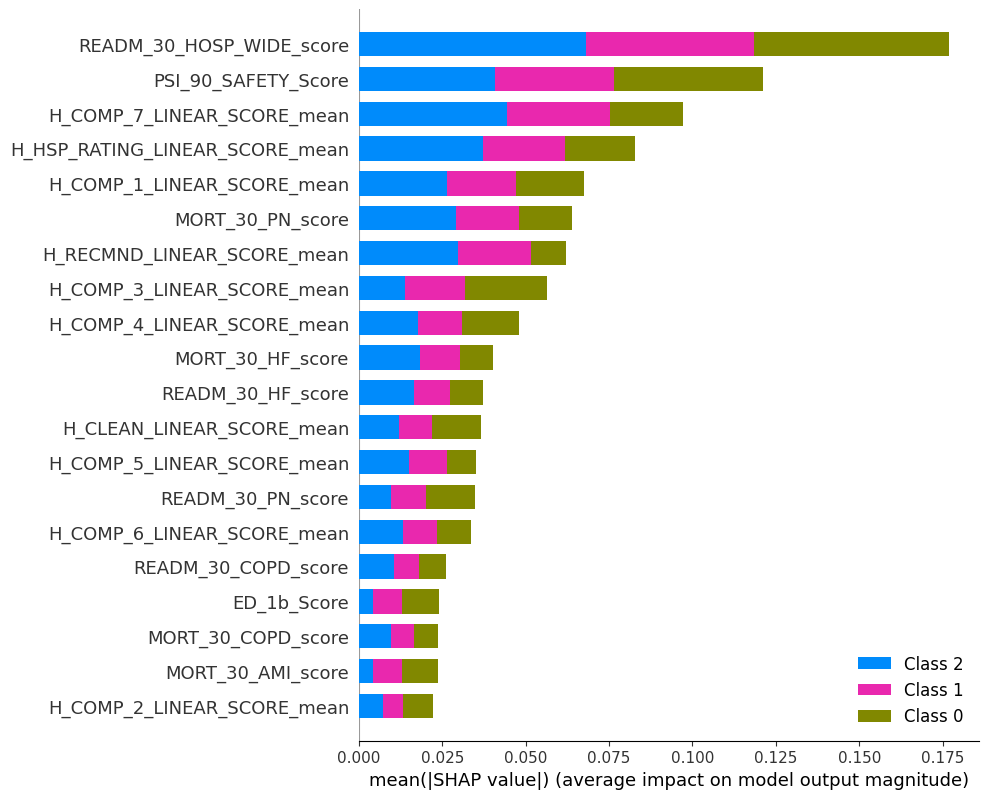

In [319]:
# Initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['1','5'])

exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values_RF, X_test.values, feature_names=X_test.columns)

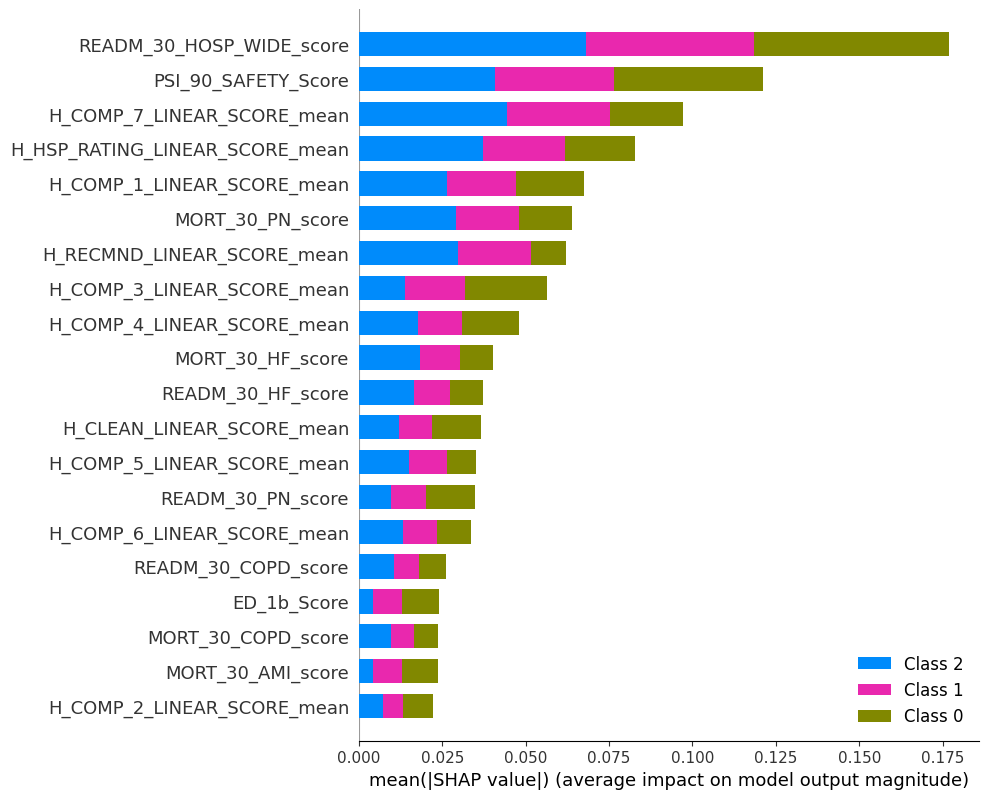

In [320]:
# Initialization of a explainer from LIME
explainer = LimeTabularExplainer(X_train.values, mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['3','5'])

exp_RF = TreeExplainer(ML_models['RF'])
shap_values_RF = exp_RF.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values_RF, X_test.values, feature_names=X_test.columns)